# Table of Contents
   
</div>

* 1. [Import Libraries](#1.)
* 2. [Load Dataset](#2.)
* 3. [Data Exploration and Treatment](#3.)
    * 3.1. [General Information](#3.1.)
    * 3.2. [Transformation of Variables & Data Types](#3.2.)
    * 3.3. [Duplicates](#3.3.)
    * 3.4. [Features' Distributions and Frequencies](#3.4.)
    * 3.5. [Check Incoherences](#4.5.)
    * 3.6. [Outliers](#3.6.)
        * 3.6.1. [Detection](#3.6.1.)
        * 3.6.2. [Treatment](#3.6.2.)
    * 3.7. [Missing Values](#3.7.)
    * 3.8. [Transformation of Variables & Data Types (pt2)](#3.8.)
    * 3.9. [Visualization](#3.9.)
* 4. [Feature Engineering](#4.) 
* 4.5. [Scaling](#Scalling)
* 5. [Feature Selection](#5.)
    * 5.1. [Correlations](#5.1.)
    * 5.2. [New variables' distributions and Discriminant Power](#5.2.)
* 6. [PCA](#6.)
* 7. [Clustering by Perspectives](#7.)
    * 7.1. [DBSCAN to remove outliers](#7.1.)
    * 7.2. [Sociodemographic Variables](#7.2.)
    * 7.3. [Value Variables](#7.3.)
        * 7.3.1. [Kmeans Clustering](#7.3.1.)
        * 7.3.2. [K-Means on top of SOM units](#7.3.2.)
    * 7.4. [Product variables](#7.4.) 
        * 7.4.1. [Kmeans Clustering](#7.4.1.)
        * 7.4.2. [K-Means on top of SOM units](#7.4.2.)
* 8. [Merging](#8.)

<div class="alert alert-block alert-danger">
    
# <b> 1. Import Libraries </b> 
    
</div>
<a name="1."></a>

In [135]:
'''# !pip install bokeh
# !pip install colorcet
# !pip install datashader
# !pip install holoviews
# !pip install matplotlib
# !pip install numpy
# !pip install pandas
# !pip install plotly
# !pip install scipy
# !pip install seaborn
# !conda install git
# !pip install -U git+https://github.com/sevamoo/SOMPY.git
# !pip install kmodes
# !pip install !pip install -U scikit-learn
# !pip install umap-learn
# !pip install graphviz'''

'# !pip install bokeh\n# !pip install colorcet\n# !pip install datashader\n# !pip install holoviews\n# !pip install matplotlib\n# !pip install numpy\n# !pip install pandas\n# !pip install plotly\n# !pip install scipy\n# !pip install seaborn\n# !conda install git\n# !pip install -U git+https://github.com/sevamoo/SOMPY.git\n# !pip install kmodes\n# !pip install !pip install -U scikit-learn\n# !pip install umap-learn\n# !pip install graphviz'

In [136]:
import bokeh.plotting as bpl
import bokeh.transform as btr
import colorcet
import datashader as ds
import datashader.transfer_functions as tf
import datashader.bundling as bd
import holoviews as hv
import holoviews.operation.datashader as hd
import math
import matplotlib.pyplot as plt
import matplotlib.colors
import matplotlib.cm as cm
import numpy as np
import pandas as pd 
import plotly.express as px
import scipy.stats as stats
import seaborn as sns
import sompy
import umap
import umap.plot

from kmodes.kprototypes import KPrototypes
from math import ceil
from matplotlib import cm, colorbar
from matplotlib import colors as mpl_colors
from matplotlib import __version__ as mplver
from matplotlib.lines import Line2D
from matplotlib.patches import RegularPolygon, Ellipse
from mpl_toolkits.axes_grid1 import make_axes_locatable
from pandas.core.indexers import length_of_indexer
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.stats import chi2_contingency
from sklearn import metrics
from sklearn.base import clone
from sklearn.cluster import MeanShift, DBSCAN, estimate_bandwidth, Birch, OPTICS, KMeans, AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.impute import KNNImputer
from sklearn.manifold import TSNE
from sklearn.metrics import pairwise_distances, silhouette_samples, silhouette_score
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler, PowerTransformer
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView
from sompy.visualization.hitmap import HitMapView

# deactivate warnings
import warnings
warnings.filterwarnings('ignore')

<div class="alert alert-block alert-danger">
    
# <b> 2. Load Dataset </b> 
    
</div>
<a name="2."></a>

In [137]:
train_df= pd.read_sas('a2z_insurance.sas7bdat', index='CustID')
original_dataframe=train_df
train_df.head(15)

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
1.0,1985.0,1982.0,b'2 - High School',2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
2.0,1981.0,1995.0,b'2 - High School',677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
3.0,1991.0,1970.0,b'1 - Basic',2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
4.0,1990.0,1981.0,b'3 - BSc/MSc',1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
5.0,1986.0,1973.0,b'3 - BSc/MSc',1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45
6.0,1986.0,1956.0,b'2 - High School',2566.0,4.0,1.0,-24.33,1.00,440.75,18.90,114.80,7.00,7.67
7.0,1979.0,1943.0,b'2 - High School',4103.0,4.0,0.0,-66.01,1.05,156.92,295.60,317.95,14.67,26.34
8.0,1988.0,1974.0,b'2 - High School',1743.0,4.0,1.0,-144.91,1.13,248.27,397.30,144.36,66.68,53.23
9.0,1981.0,1978.0,b'3 - BSc/MSc',1862.0,1.0,1.0,356.53,0.36,344.51,18.35,210.04,8.78,9.89


<div class="alert alert-block alert-danger">
    
# <b> 3. Data Exploration and Treatment
    
</div>
<a name="3."></a>

<div class="alert alert-block alert-danger">
    
## <b> 3.1. General Information
    
</div>
<a name="3.1."></a>

| *Feature* | *Description* | 
| --- | --- |
| ID | ID | 
| First Policy | Year of the customer’s first policy |
| Birthday | Customer’s Birthday Year | 
| Education |  Academic Degree |
| Salary | Gross monthly salary (€) |
| Area | Living area | 
| Children | Binary variable (Y=1) |
| CMV | Customer Monetary Value |
| Claims | Claims Rate |
| Motor | Premiums (€) in LOB: Motor |
| Household | Premiums (€) in LOB: Household |
| Health | Premiums (€) in LOB: Health |
| Life | Premiums (€) in LOB: Life |
| Work Compensation | Premiums (€) in LOB: Work Compensations |

In [138]:
# Print how many observations and features are in the training data
print('Charateristics of the data:','\nNumber of Clients:', train_df.shape[0], '\nNumber of Features:', train_df.shape[1])

Charateristics of the data: 
Number of Clients: 10296 
Number of Features: 13


In [139]:
# Print statement with a list of columns
print('The Features Are:\n',train_df.columns.tolist())

The Features Are:
 ['FirstPolYear', 'BirthYear', 'EducDeg', 'MonthSal', 'GeoLivArea', 'Children', 'CustMonVal', 'ClaimsRate', 'PremMotor', 'PremHousehold', 'PremHealth', 'PremLife', 'PremWork']


In [140]:
# Presenting all the columns in the training data
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 10296 entries, 1.0 to 10296.0
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   FirstPolYear   10266 non-null  float64
 1   BirthYear      10279 non-null  float64
 2   EducDeg        10279 non-null  object 
 3   MonthSal       10260 non-null  float64
 4   GeoLivArea     10295 non-null  float64
 5   Children       10275 non-null  float64
 6   CustMonVal     10296 non-null  float64
 7   ClaimsRate     10296 non-null  float64
 8   PremMotor      10262 non-null  float64
 9   PremHousehold  10296 non-null  float64
 10  PremHealth     10253 non-null  float64
 11  PremLife       10192 non-null  float64
 12  PremWork       10210 non-null  float64
dtypes: float64(12), object(1)
memory usage: 1.1+ MB


In [141]:
# Describe the training data
train_df.describe().T

,count,mean,std,min,25%,50%,75%,max
FirstPolYear,10266.0,1991.062634,511.267913,1974.00,1980.00,1986.00,1992.0000,53784.00
BirthYear,10279.0,1968.007783,19.709476,1028.00,1953.00,1968.00,1983.0000,2001.00
MonthSal,10260.0,2506.667057,1157.449634,333.00,1706.00,2501.50,3290.2500,55215.00
GeoLivArea,10295.0,2.709859,1.266291,1.00,1.00,3.00,4.0000,4.00
Children,10275.0,0.706764,0.455268,0.00,0.00,1.00,1.0000,1.00
CustMonVal,10296.0,177.892605,1945.811505,-165680.42,-9.44,186.87,399.7775,11875.89
ClaimsRate,10296.0,0.742772,2.916964,0.00,0.39,0.72,0.9800,256.20
PremMotor,10262.0,300.470252,211.914997,-4.11,190.59,298.61,408.3000,11604.42
PremHousehold,10296.0,210.431192,352.595984,-75.00,49.45,132.80,290.0500,25048.80
PremHealth,10253.0,171.580833,296.405976,-2.11,111.80,162.81,219.8200,28272.00


Important remarks are that the max FirstPolYear is impossible in 2016; 

The min value of the Birth Year is also impossible, and the youngest client is 15 years old;

MonthSal, CustMonVal and Premiums seem to have a high variability, with the Premiums having negative values, as said in the Project script. 

'FirstPolYear', 'Age', 'GeoLivArea', and 'Children' are type float, but should be int, before converting them it mist be checked if there are any decimal values.

In [142]:
for col in ['FirstPolYear','GeoLivArea','Children']:
    print('-' * 30, col,  '-' * 30 )
    print(train_df[col].value_counts())

------------------------------ FirstPolYear ------------------------------
1988.0     512
1994.0     475
1993.0     473
1989.0     466
1984.0     464
1986.0     458
1977.0     453
1978.0     453
1992.0     451
1990.0     449
1981.0     445
1995.0     445
1982.0     444
1979.0     443
1996.0     440
1987.0     438
1976.0     433
1980.0     432
1991.0     430
1985.0     429
1983.0     423
1975.0     285
1997.0     271
1974.0     141
1998.0     112
53784.0      1
Name: FirstPolYear, dtype: int64
------------------------------ GeoLivArea ------------------------------
4.0    4145
1.0    3048
3.0    2066
2.0    1036
Name: GeoLivArea, dtype: int64
------------------------------ Children ------------------------------
1.0    7262
0.0    3013
Name: Children, dtype: int64


In [143]:
train_df['BirthYear'].unique()

array([1982., 1995., 1970., 1981., 1973., 1956., 1943., 1974., 1978.,
       1948., 1945., 1958., 1949., 2000., 1975., 1979., 1989., 1962.,
       1986., 1961., 1952., 1944., 1937., 1942., 1972., 1953., 1966.,
       1955., 1941., 1938., 1968., 1990., 1984., 1980., 1946., 1965.,
       1957., 1967., 1977., 1951., 1985., 1959., 1988., 1983., 1939.,
       1964., 1950., 1960., 1976., 1971., 1954., 1969., 1994., 1992.,
       1997., 1963., 1991., 1999., 1993., 1947., 1987., 1996., 1940.,
       1935., 1936.,   nan, 1998., 2001., 1028.])

There are no Decimal values. The feautures will be converted into after treating the NaN values.

<div class="alert alert-block alert-danger">
    
## <b> 3.2. Transformation of Variables & Data Types
    
</div>
    

Change index type from float to int.

In [144]:
train_df.index = train_df.index.astype('int')
print('Index data type:',train_df.index.dtype)

Index data type: int64


Convert "EducDeg" to ranks.

In [145]:
train_df["EducDeg"]= train_df["EducDeg"].map({b'1 - Basic':1, b'2 - High School':2, b'3 - BSc/MSc':3, b'4 - PhD':4, np.nan:10}) 
train_df["EducDeg"]= train_df["EducDeg"].map({1:1, 2:2, 3:3, 4:4, 10:np.nan}) 

Convert "BirthYear" to "Age" to increase interpretability. 

In [146]:
train_df['Age'] = 2016 - train_df['BirthYear']
train_df.pop('BirthYear')
train_df = train_df[['FirstPolYear', 'Age', 'EducDeg', 'MonthSal', 'GeoLivArea', 'Children', 'CustMonVal', 'ClaimsRate', 'PremMotor', 'PremHousehold', 'PremHealth', 'PremLife', 'PremWork']]

In [147]:
train_df.head(2)

,FirstPolYear,Age,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
1,1985.0,34.0,2.0,2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
2,1981.0,21.0,2.0,677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13


<div class="alert alert-block alert-danger">
    
## <b> 3.3. Duplicates
    
</div>
<a name="3.3."></a>

In [148]:
# print total number of duplicated rows in the training data
print('There are {} duplicated rows in the training data'.format(train_df.duplicated().sum()))

There are 3 duplicated rows in the training data


In [149]:
# Find rows with duplicate values
duplicated_rows = train_df[train_df.duplicated(keep=False)]
# Sort duplicated_rows by FirstPolYear for better readability
duplicated_rows.sort_values(by='FirstPolYear', inplace=True)
duplicated_rows

,FirstPolYear,Age,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
2076,1977.0,42.0,2.0,2204.0,4.0,1.0,-22.11,1.00,214.93,88.90,266.94,39.23,42.12
8122,1977.0,42.0,2.0,2204.0,4.0,1.0,-22.11,1.00,214.93,88.90,266.94,39.23,42.12
3507,1986.0,64.0,2.0,3900.0,4.0,0.0,-119.35,1.10,163.03,481.75,224.82,94.35,18.56
9554,1986.0,64.0,2.0,3900.0,4.0,0.0,-119.35,1.10,163.03,481.75,224.82,94.35,18.56
2100,1987.0,29.0,2.0,1912.0,4.0,1.0,290.61,0.58,202.37,177.25,306.39,63.90,-0.11
8014,1987.0,29.0,2.0,1912.0,4.0,1.0,290.61,0.58,202.37,177.25,306.39,63.90,-0.11


Even though they have different ID's, these observations have the same values and are most likely to be the same person, so they will be droped.

In [150]:
# Drop the duplicated rows
train_df.drop_duplicates(inplace=True)
# print total number of duplicated rows in the training data
print('There are now {} duplicated rows in the training data'.format(train_df.duplicated().sum()))

There are now 0 duplicated rows in the training data


<div class="alert alert-block alert-danger">
    
## <b> 3.4. Features' Distributions and Frequencies
    
</div>
<a name="3.4."></a>   

In [151]:
non_metric_feat = ["EducDeg", "Children", "GeoLivArea"]

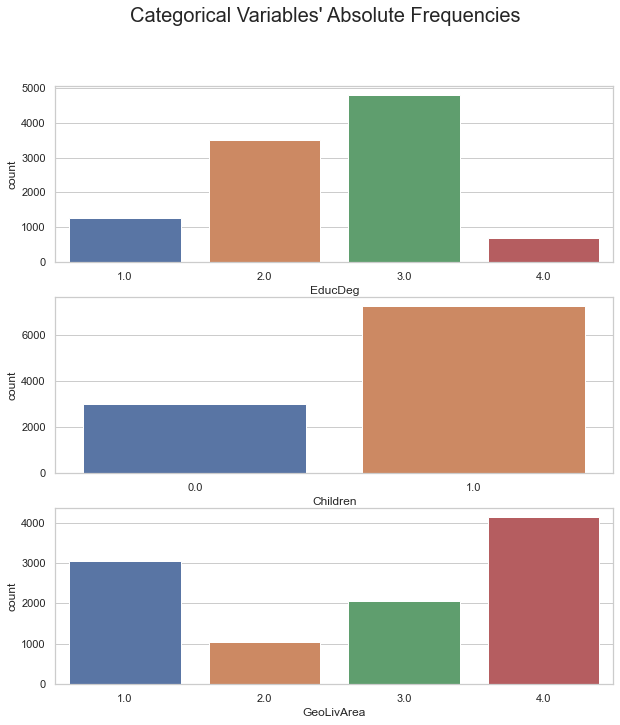

In [152]:
# All Non-Metric Variables' Absolute Frequencies
sns.set(style="whitegrid")

# Prepare figure. Create individual axes where each bar plot will be placed
fig, axes = plt.subplots(3, ceil(len(non_metric_feat) / 3), figsize=(10, 11))

# Plot data
# Iterate across axes objects and associate each bar plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), non_metric_feat): # Notice the zip() function and flatten() method
    sns.countplot(train_df[feat].astype(object), ax=ax)

title = "Categorical Variables' Absolute Frequencies"
plt.suptitle(title, size = 20)

plt.show()

In [153]:
metric_features = [feature for feature in train_df.columns if feature not in non_metric_feat]

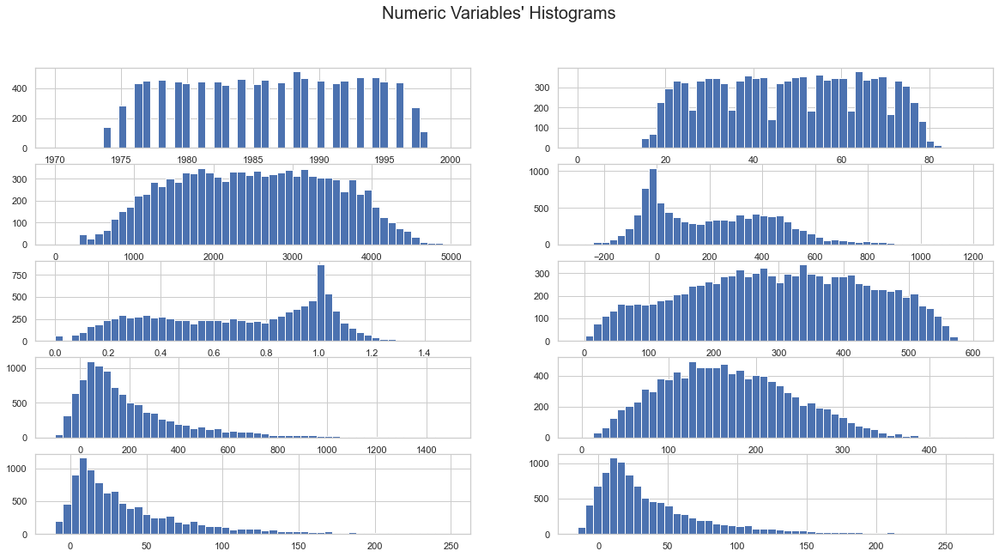

In [154]:
# All Numeric Variables' Histograms in one figure
sns.set(style="whitegrid")

#for each variable
#min x
min_x = [1970, 0, 0, -300, 0, -10, -100, -5, -10, -15]
#max x
max_x = [2000, 90, 5000, 1200, 1.5, 600, 1500, 450, 250, 270]
#bins

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(5, ceil(len(metric_features) / 5), figsize=(20, 10))

# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat, max_x, min_x in zip(axes.flatten(), metric_features, max_x, min_x): # Notice the zip() function and flatten() method
    ax.hist(train_df[feat],bins=50 ,range=[min_x,max_x])
    
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Histograms"

plt.suptitle(title, size = 20)

plt.show()

The outliers were exclucded from this plotting (histograms) to better visualise the distributions.

PremHousehold, PremLifem, PremWork (and CustMonVal) have a right tail.

MonthSal, PremMotor, PremHealth has an almost normal distribution.

<div class="alert alert-block alert-danger">
    
## <b> 3.5. Check Incoherences
    
</div>
<a name="3.5."></a>

   - 1) Age needs to be between 0 and 110 (considering that people live up to 110 years)

In [155]:
print('Individuals with age above 110:',train_df[train_df['Age'] > 110].shape[0])
print('Individuals with age bellow 0:',train_df[train_df['Age'] < 0].shape[0])

Individuals with age above 110: 1
Individuals with age bellow 0: 0


In [156]:
display(train_df[train_df['Age'] > 110])

,FirstPolYear,Age,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
7196,1993.0,988.0,3.0,2830.0,4.0,0.0,146.02,0.77,428.97,192.8,108.91,1.89,23.67


998 years of age is clearly an error so it will be deleted.

In [157]:
train_df = train_df[(train_df['Age'] <= 110) | (pd.isna(train_df['Age']))]

   - 2) A person under 16 cannot have a BSc/MSc or a PhD
   - 3) A person under 16 cannot have a salary

In [158]:
#2
print('Individuals under 16 with BSc/MSc or a PhD:', train_df[(train_df["Age"]<16) & (train_df["EducDeg"] == 3.0)].shape[0] + train_df[(train_df["Age"]<16) & (train_df["EducDeg"] == 4.0)].shape[0])
#3
print('Individuals under 16 with salary:', train_df[(train_df["Age"]<16) & (train_df["MonthSal"] > 0)].shape[0])

Individuals under 16 with BSc/MSc or a PhD: 0
Individuals under 16 with salary: 12


This would be impossible by Portuguese stardards, but as there are interernational clients and so, they wll not be touched.

   - 4) FirstPolYear, BirthYear, MonthSal, ClaimsRate cannot have negative values

In [159]:
print('Individuals with negative FirstPolYear:', train_df[train_df["FirstPolYear"]<0].shape[0])
print('Individuals with negative Age:',train_df[train_df["Age"]<0].shape[0])
print('Individuals with negative ClaimsRate:',train_df[train_df["ClaimsRate"]<0] .shape[0])
print('Individuals with negative MonthSal:',train_df[train_df["MonthSal"]<0].shape[0])

Individuals with negative FirstPolYear: 0
Individuals with negative Age: 0
Individuals with negative ClaimsRate: 0
Individuals with negative MonthSal: 0


   - 5) Money on insurances cannot be bigger than MonthSal*12 (annual salary) (see 14 MonthSal - summer and christmas subsidy)

In [160]:
print('Individuals with insurance expenses bigger than MonthSal*12:',train_df[(train_df["MonthSal"]*12 < 
(train_df["PremMotor"]+train_df["PremHousehold"]+train_df["PremHealth"]+train_df["PremLife"]+train_df["PremWork"]))].shape[0])

print('Individuals with insurance expenses bigger than MonthSal*14:',train_df[(train_df["MonthSal"]*14 < 
(train_df["PremMotor"]+train_df["PremHousehold"]+train_df["PremHealth"]+train_df["PremLife"]+train_df["PremWork"]))].shape[0])

Individuals with insurance expenses bigger than MonthSal*12: 1
Individuals with insurance expenses bigger than MonthSal*14: 1


Other people help in the payment, such as parents, so it may not be incorrect.

   - 6) MonthSal needs to be bigger or equal than 530 (minimum wage in Portugal in 2016)

In [161]:
min_wage = train_df[train_df['MonthSal']<530][['Age','MonthSal']]
#exclude individuals under 16 (cannot have salary - see #4)
min_wage = min_wage[(min_wage['Age']>16)]

In [162]:
print('Individuals over 16 with a salary below the minimum wage:',min_wage.shape[0])

Individuals over 16 with a salary below the minimum wage: 85


In [163]:
#Individual with ages between 16 and 18 with salary below minimum wage
len(min_wage[(min_wage['Age']>16) & (min_wage['Age']<25)])

74

74 people could be part-time workers and the other 11 could be too, or be international clients with different minimum wages.

Individuals between 16 and 18 can only work part time and may receive less than the minimum wage, so these customers are not incoherences.

   - 7) Usualy parents are over 18.

In [164]:
print('Individuals under 18 with children:', train_df[(train_df["Age"]<=19) & (train_df["Children"] == 1)].shape[0])

Individuals under 18 with children: 257


Although the group couldn't find the teen pregnancies rates in Portugal, in America 'Teen birth rates continued to decline from 17.4 per 1,000 females in 2018 to 16.7 per 1,000 females in 2019' - this is from Ages 13 to 19. Considering that Portugal should have a value similar to these the value seems reasonable. Also, keep in mind the clients are not just Portuguese.

   - 8) People who have MotorPrem are assumed to drive, which are usually over 18.

In [165]:
print('Individuals under 18 with Motor Prem:', train_df[(train_df["Age"]<=18) & (train_df["PremMotor"] != 0)].shape[0])

Individuals under 18 with Motor Prem: 210


It's a low number that could be explained by minor driving 50 cc vehicles or foreign clients.

   - 9) People who don't recieve salary shouldn't have Work Prem.

In [166]:
print('Individuals that do not recieve Salary but have Work Prem:',
      train_df[(train_df["MonthSal"] == 0) & (train_df["PremWork"] > 0)].shape[0])

Individuals that do not recieve Salary but have Work Prem: 0


   - 10) FirstPolYear needs to be between BirthYear and 2016

In [167]:
#2
print('Individuals with FirstPolYear below birth year:', train_df[(train_df["FirstPolYear"] < (2016 - train_df["Age"]))].shape[0])
print('Individuals with FirstPolYear above date 2016:', train_df[train_df['FirstPolYear'] > 2016].shape[0])

Individuals with FirstPolYear below birth year: 1997
Individuals with FirstPolYear above date 2016: 1


The row with the impossible value of *FirstPolYear* will be deleted.

In [168]:
train_df=train_df[train_df['FirstPolYear'] <= 2016]

The group will now find out how big the difference between the wrong values is.

In [169]:
dif=train_df[(train_df["FirstPolYear"] < (2016 - train_df["Age"]))]
dif['dif']=(2016 - train_df["Age"])-dif['FirstPolYear']
dif['dif'].value_counts()

3.0     175
2.0     165
1.0     152
5.0     141
4.0     137
6.0     122
10.0    119
7.0     116
8.0     113
9.0     104
11.0     86
13.0     83
12.0     78
14.0     76
15.0     63
16.0     54
19.0     50
17.0     41
18.0     40
20.0     29
21.0     27
22.0     15
23.0      5
24.0      3
25.0      2
27.0      1
Name: dif, dtype: int64

In [170]:
dif['dif'].describe().T

count    1997.000000
mean        8.400601
std         5.633492
min         1.000000
25%         4.000000
50%         7.000000
75%        12.000000
max        27.000000
Name: dif, dtype: float64

75% of the values have a difference of a maximum of 12 years.

Creating a dataframe with the wrong values of the 2 columns switched. (without Nan values)

In [171]:
dif['temporary_Age']=dif['Age']

In [172]:
dif['Age'] = dif["FirstPolYear"]
dif["FirstPolYear"] = (2016 - dif['temporary_Age'])
dif = dif.drop(['temporary_Age','dif'], axis=1)

In [173]:
dif.head()

,FirstPolYear,Age,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
2,1995.0,1981.0,2.0,677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
14,2000.0,1983.0,1.0,1043.0,3.0,1.0,-75.12,1.06,44.34,342.85,127.69,267.94,94.46
19,1982.0,1981.0,1.0,1414.0,3.0,1.0,230.38,0.71,313.17,373.40,121.80,14.78,72.57
23,1986.0,1976.0,2.0,1495.0,1.0,1.0,-89.79,1.08,209.04,308.95,192.48,64.79,54.90
41,1995.0,1994.0,2.0,1177.0,4.0,1.0,121.36,0.84,52.01,455.65,135.47,146.36,148.03


In [174]:
train_df_clean=train_df[(train_df["FirstPolYear"] >= (2016 - train_df["Age"]))]

In [175]:
train_df_clean=pd.concat([train_df_clean,dif])
train_df_clean=train_df_clean.dropna()

In [176]:
train_df_out=train_df. dropna()

#### Original without Nan

In [177]:
df_all_corr = train_df_out.corr(method ='pearson').abs().unstack().sort_values(kind="quicksort", ascending=False).reset_index()
df_all_corr.rename(columns={"level_0": "Feature 1", "level_1": "Feature 2", 0: 'Correlation Coefficient'}, inplace=True)
df_all_corr[df_all_corr['Feature 1'] == 'Age']

,Feature 1,Feature 2,Correlation Coefficient
1,Age,Age,1.000000
15,Age,MonthSal,0.786054
17,Age,Children,0.488167
37,Age,PremLife,0.261703
44,Age,PremWork,0.235156
47,Age,EducDeg,0.195579
50,Age,PremMotor,0.175499
53,Age,PremHousehold,0.171035
91,Age,FirstPolYear,0.018044
101,Age,GeoLivArea,0.014303


#### Switched

In [178]:
df_all_corr = train_df_clean.corr(method ='pearson').abs().unstack().sort_values(kind="quicksort", ascending=False).reset_index()
df_all_corr.rename(columns={"level_0": "Feature 1", "level_1": "Feature 2", 0: 'Correlation Coefficient'}, inplace=True)
df_all_corr[df_all_corr['Feature 1'] == 'Age']

,Feature 1,Feature 2,Correlation Coefficient
1,Age,Age,1.000000
16,Age,MonthSal,0.486539
26,Age,PremLife,0.353290
32,Age,PremWork,0.310786
36,Age,PremMotor,0.284629
50,Age,PremHousehold,0.231264
53,Age,FirstPolYear,0.223833
56,Age,EducDeg,0.221055
75,Age,Children,0.122624
89,Age,PremHealth,0.049791


#### Deleted wrong values

In [179]:
clean=train_df[(train_df["FirstPolYear"] >= (2016 - train_df["Age"]))].dropna()
df_all_corr = clean.corr(method ='pearson').abs().unstack().sort_values(kind="quicksort", ascending=False).reset_index()
df_all_corr.rename(columns={"level_0": "Feature 1", "level_1": "Feature 2", 0: 'Correlation Coefficient'}, inplace=True)
df_all_corr[df_all_corr['Feature 1'] == 'Age']

,Feature 1,Feature 2,Correlation Coefficient
1,Age,Age,1.000000
15,Age,MonthSal,0.748896
18,Age,Children,0.595715
38,Age,FirstPolYear,0.201138
59,Age,PremHealth,0.111257
80,Age,PremMotor,0.043749
88,Age,EducDeg,0.028516
98,Age,GeoLivArea,0.017353
103,Age,PremLife,0.015935
115,Age,CustMonVal,0.011718


#### Original without Nan

In [180]:
df_all_corr = train_df_out.corr(method ='pearson').abs().unstack().sort_values(kind="quicksort", ascending=False).reset_index()
df_all_corr.rename(columns={"level_0": "Feature 1", "level_1": "Feature 2", 0: 'Correlation Coefficient'}, inplace=True)
df_all_corr[df_all_corr['Feature 1'] == 'FirstPolYear']

,Feature 1,Feature 2,Correlation Coefficient
0,FirstPolYear,FirstPolYear,1.000000
82,FirstPolYear,MonthSal,0.023644
92,FirstPolYear,Age,0.018044
95,FirstPolYear,PremWork,0.017528
104,FirstPolYear,Children,0.013419
107,FirstPolYear,PremHousehold,0.010812
113,FirstPolYear,PremLife,0.009489
121,FirstPolYear,PremMotor,0.005960
129,FirstPolYear,EducDeg,0.005753
134,FirstPolYear,PremHealth,0.004728


#### Switched

In [181]:
df_all_corr = train_df_clean.corr(method ='pearson').abs().unstack().sort_values(kind="quicksort", ascending=False).reset_index()
df_all_corr.rename(columns={"level_0": "Feature 1", "level_1": "Feature 2", 0: 'Correlation Coefficient'}, inplace=True)
df_all_corr[df_all_corr['Feature 1'] == 'FirstPolYear']

,Feature 1,Feature 2,Correlation Coefficient
0,FirstPolYear,FirstPolYear,1.000000
44,FirstPolYear,PremLife,0.254811
45,FirstPolYear,MonthSal,0.251528
52,FirstPolYear,PremWork,0.230956
54,FirstPolYear,Age,0.223833
60,FirstPolYear,PremMotor,0.185323
64,FirstPolYear,EducDeg,0.173598
69,FirstPolYear,PremHousehold,0.149076
94,FirstPolYear,Children,0.033452
99,FirstPolYear,PremHealth,0.025440


#### Deleted wrong values

In [182]:
df_all_corr = clean.corr(method ='pearson').abs().unstack().sort_values(kind="quicksort", ascending=False).reset_index()
df_all_corr.rename(columns={"level_0": "Feature 1", "level_1": "Feature 2", 0: 'Correlation Coefficient'}, inplace=True)
df_all_corr[df_all_corr['Feature 1'] == 'FirstPolYear']

,Feature 1,Feature 2,Correlation Coefficient
0,FirstPolYear,FirstPolYear,1.000000
37,FirstPolYear,Age,0.201138
54,FirstPolYear,MonthSal,0.136402
63,FirstPolYear,PremLife,0.086096
68,FirstPolYear,PremWork,0.084106
71,FirstPolYear,PremMotor,0.064595
73,FirstPolYear,PremHealth,0.055101
81,FirstPolYear,Children,0.041522
84,FirstPolYear,EducDeg,0.035071
89,FirstPolYear,PremHousehold,0.025830


No matter the changes the correlation of both variables seems to have decreased.
*FirstPolYear* is assumed to be wrong since it has very low correlations but at least the *CustMonVal* feature should have a high correlation since it the lower the year they first became clients, the higher the value the clients have brought to the business should be.
So *FirstPolYear* will be deleted.

In [183]:
#2 delete FirstPolYear
train_df=train_df.drop('FirstPolYear', axis=1)
metric_features.remove('FirstPolYear')

<div class="alert alert-block alert-danger">
    
## <b> 3.6. Outliers
    
</div>
<a name="3.6."></a>


<div class="alert alert-block alert-danger">
    
### <b> 3.6.1. Detection
    
</div>
<a name="3.6.1."></a>

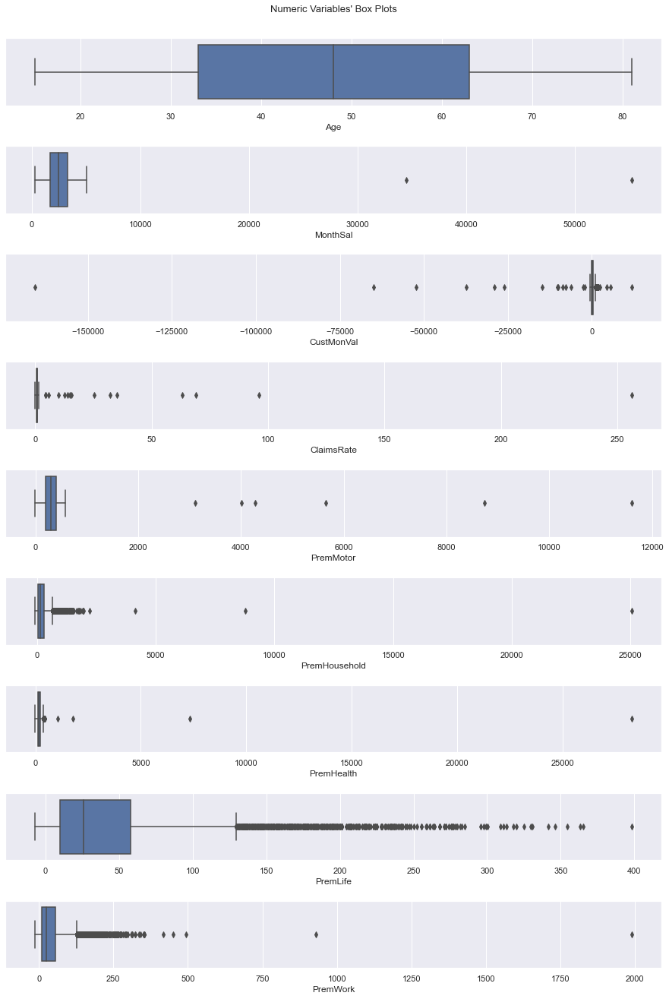

In [184]:
# All Numeric Variables' Box Plots in one figure
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(len(metric_features), ceil(len(metric_features) / len(metric_features)), figsize=(15, 20))

# Plot data
# Iterate across axes objects and associate each box plot:
for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=train_df[feat], ax=ax)

plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.95,
                    #wspace=0.3,
                    hspace=0.6)

# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Box Plots"

plt.suptitle(title, size = 13)

plt.show()

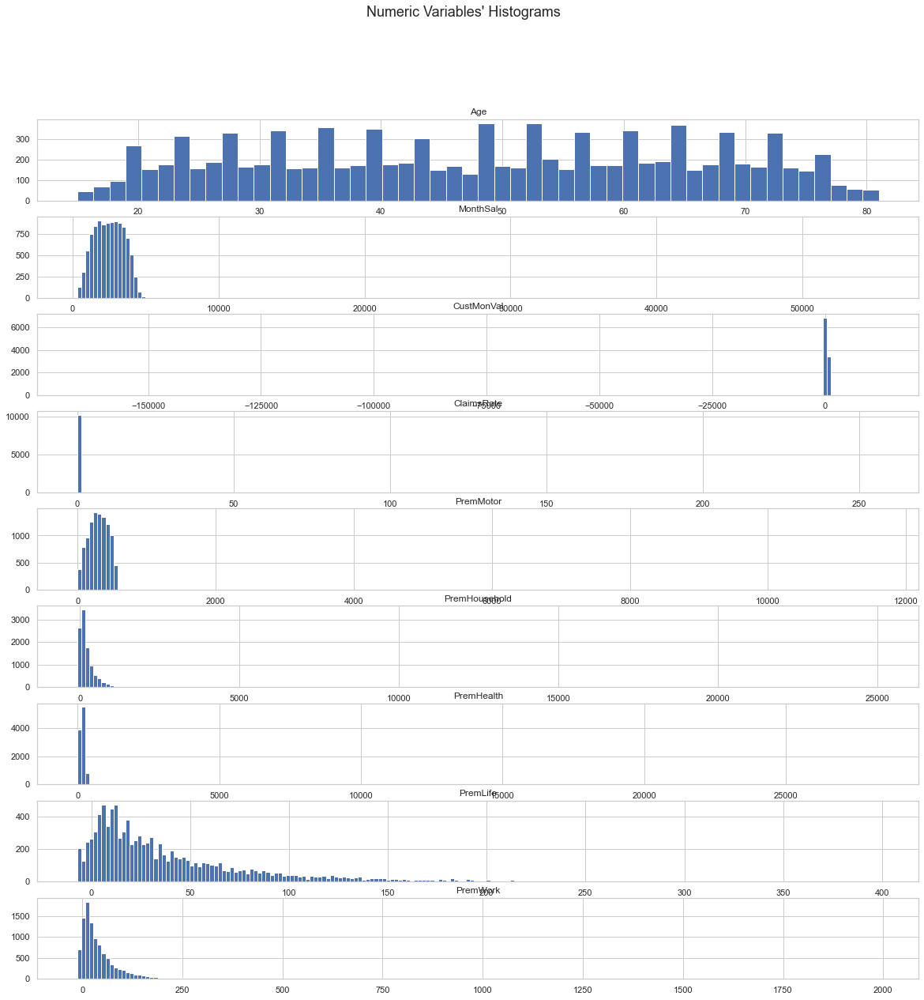

In [185]:
# All Numeric Variables' Histograms in one figure
sns.set(style="whitegrid")

#for each variable
#min x   FirstPolYear min - 1900
min_x = [0, 0, -170000, 0, -10, -100, -5, -10, -15]
#max x  FirstPolYear max - 54000,
max_x = [1000, 57000, 12000, 300, 1300, 27000, 30000, 500, 2100]
#bins
bins = [50, 200, 200, 200, 200, 200, 200, 200, 200]

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(len(metric_features), ceil(len(metric_features) / len(metric_features)), figsize=(20, 20))

# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat, max_x, min_x, bin_f in zip(axes.flatten(), metric_features, max_x, min_x, bins): # Notice the zip() function and flatten() method
    ax.hist(train_df[feat],bins=bin_f)
    ax.set_title(feat)


# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Histograms"

plt.suptitle(title, size = 18)

plt.show()

We tried to see the outliers in the histograms plot but they are so further away that it is not possible for most features.

We can see that the PremLife outliers are the tail of the distribution. Same with PremHousehold and PremWork

In [186]:
# Outlier detection using IQR method
def outlier_detection_iqr(data, feature):
    q1 = data[feature].quantile(0.15)
    q3 = data[feature].quantile(0.85)
    iqr = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr
    return lower, upper

In [187]:
def printoutliers(listoutliers, feature):
# porcentage of outliers over the total number of observations
    print('There are {} outliers in {} feature, which is {}% of the total number of observations.'\
    .format(len(listoutliers), feature, round(len(listoutliers) / len(train_df) * 100, 2)))

In [188]:
outliers_feature = []
percentaje = []
# Print outliers for each feature
for feature in metric_features:
    lower, upper = outlier_detection_iqr(train_df, feature)
    listoutliers = train_df[(train_df[feature] > upper) | (train_df[feature] < lower)]
    outliers_feature.append(len(listoutliers))
    percentaje.append(round(len(listoutliers) / len(train_df) * 100, 2))

outliers = pd.DataFrame(metric_features, columns = ['Features'])
outliers['Count'] = outliers_feature
outliers['Percentaje'] = percentaje
outliers.set_index('Features', inplace = True)
outliers

# print total number of outliers and their percentage over the total number of observations
print('There are {} outliers in total, which is {}% of the total number of observations.'\
.format(sum(outliers_feature), sum(percentaje)))
outliers

There are 513 outliers in total, which is 5.01% of the total number of observations.


,Count,Percentaje
Features,,
Age,0,0.00
MonthSal,2,0.02
CustMonVal,44,0.43
ClaimsRate,15,0.15
PremMotor,6,0.06
PremHousehold,121,1.18
PremHealth,4,0.04
PremLife,155,1.51
PremWork,166,1.62


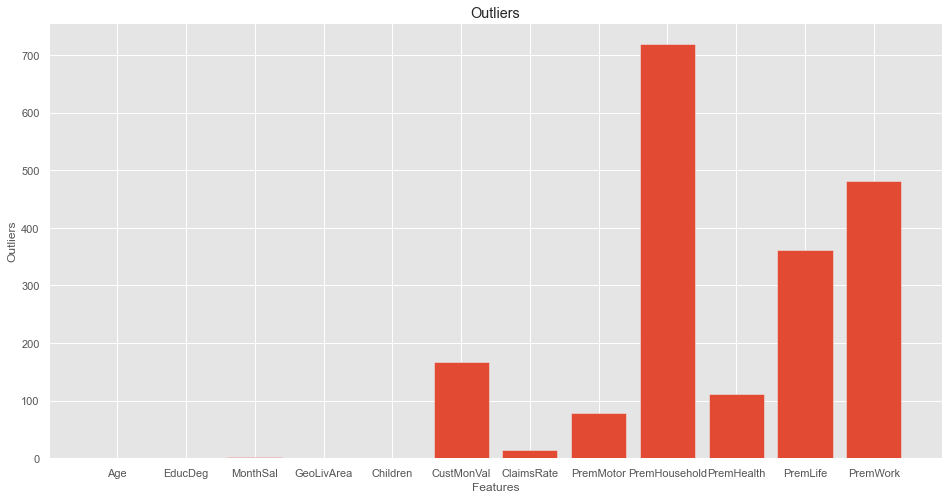

In [189]:
r=PowerTransformer()
X=r.fit_transform(train_df)
df=pd.DataFrame(X,columns=train_df.columns)

out=[]
def iqr_outliers(df,ft):
    q1 = df[ft].quantile(0.25) #try 0.05 and 0.10
    q3 = df[ft].quantile(0.75) #try 0.95 and 0.90
    iqr = q3-q1
    Lower_tail = q1 - 1.5 * iqr
    Upper_tail = q3 + 1.5 * iqr
    c=0
    for i in range(len(df[ft])):
        if df[ft][i] > Upper_tail or df[ft][i] < Lower_tail:
            c+=1
    return c
od={ f:iqr_outliers(df,f) for f in df.columns }

# Plotting Outliers
plt.style.use('ggplot')
plt.figure(figsize=(16,8))
plt.bar(x=od.keys(),height=od.values())
plt.xlabel("Features")
plt.ylabel("Outliers")
plt.title('Outliers')
plt.show()

There is a significant amout of outliers through the IQR method, if considering the interval [0.25,0.75] the deleted that would be 14% of the dataset, but even considering the interval [0.15,0.85] would lead to a loss of over 4%. With this in mind the outlier treatment will not be done through the IQR method but by the criteria of the group based on the boxlplot and histogram.

<div class="alert alert-block alert-danger">
    
### <b> 3.6.2. Treatment
    
</div>
<a name="3.6.2."></a>

In [190]:
#to save the original
train_df_with_outliers = train_df.copy()

In [191]:
#MonthSal
train_df=train_df[(train_df['MonthSal']<10000) | (pd.isna(train_df['MonthSal']))]

In [192]:
#CustMonVal
train_df=train_df[((train_df['CustMonVal']>-300) & (train_df['CustMonVal']<1200)) | (pd.isna(train_df['CustMonVal']))]

In [193]:
#ClaimsRate
train_df=train_df[(train_df['ClaimsRate']<1.4) | (pd.isna(train_df['ClaimsRate']))]

In [194]:
#PremMotor
train_df=train_df[(train_df['PremMotor']<700) | (pd.isna(train_df['PremMotor']))]

In [195]:
#PremHousehold
train_df=train_df[(train_df['PremHousehold']<1000) | (pd.isna(train_df['PremHousehold']))]

In [196]:
#PremHealth
train_df=train_df[(train_df['PremHealth']<350) | (pd.isna(train_df['PremHealth']))]

In [197]:
#PremLife
train_df=train_df[(train_df['PremLife']<250) | (pd.isna(train_df['PremLife']))]

In [198]:
#PremWork
train_df=train_df[(train_df['PremWork']<2500) | (pd.isna(train_df['PremWork']))]

In [199]:
print('In total,', round((1-len(train_df)/len(original_dataframe))*100,3), '% of observations were deleted from the dataset.')

In total, 3.351 % of observations were deleted from the dataset.


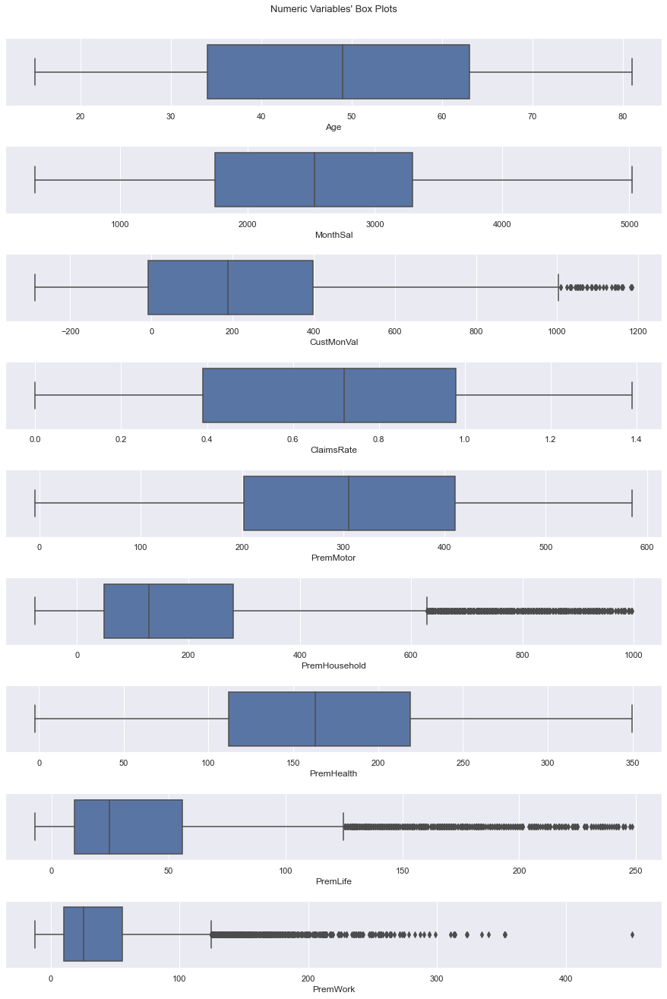

In [200]:
# All Numeric Variables' Box Plots in one figure
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(len(metric_features), ceil(len(metric_features) / len(metric_features)), figsize=(15, 20))

# Plot data
# Iterate across axes objects and associate each box plot:
for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=train_df[feat], ax=ax)

plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.95,
                    #wspace=0.3,
                    hspace=0.6)

# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Box Plots"

plt.suptitle(title, size = 13)

plt.show()

<div class="alert alert-block alert-danger">
    
## <b> 3.7. Missing Values
    
</div>
<a name="3.7."></a>

In [882]:
#List of special characters that might represent Nan values
special_characters = ['-', '_',',', '.', '?', '/', '', 'x']
# Replace special characters with nan
train_df.replace(special_characters, np.nan, inplace=True)
print('Total NaNs after transformation of special chars:',train_df.isna().sum().sum())

Total NaNs after transformation of special chars: 324


After making sure that any possible characters (and empty spaces) that might mean an empty valiue have been converted to Nan values, it is now looked where the missing values are.

In [883]:
# Dataframe of columns with rows containing blank values
missing_values = train_df.isnull().sum().sort_values(ascending=False)
missing_values = missing_values[missing_values > 0]
# Create a dataframe with the missing values and their percentage
missing_values = pd.DataFrame(missing_values)
missing_values.columns = ['Count']
# create a column with the percentage of missing values by feature
missing_values['Percentage'] = round(missing_values['Count'] / train_df.shape[0] * 100,2)
# create a column with the data type of the feature
missing_values['Type'] = train_df[missing_values.index].dtypes
# columns with missing values
row_missing_values = train_df[train_df.isnull().any(axis=1)].shape[0]
# percentage of rows with missing values
porcentage_row_missing_values = round(row_missing_values / train_df.shape[0] * 100,2)

# Print statements
print('There are {} columns with missing values in the training data'.format(missing_values.shape[0]))
print('There are {} empty cells in the training data'.format(missing_values['Count'].sum()))
print('There are {} rows with missing values in the training data. Represent {}% of total rows.'\
    .format(row_missing_values, porcentage_row_missing_values))

# Print the dataframe
missing_values

There are 8 columns with missing values in the training data
There are 324 empty cells in the training data
There are 275 rows with missing values in the training data. Represent 2.76% of total rows.


,Count,Percentage,Type
PremLife,103,1.04,float64
PremWork,84,0.84,float64
PremHealth,42,0.42,float64
MonthSal,33,0.33,float64
PremMotor,33,0.33,float64
Age,14,0.14,float64
Children,13,0.13,float64
EducDeg,2,0.02,float64


There is no feature that has so many missing values that makes it unusable.

The missing values in the Prem features are assumed to mean 0 and will be filled with that logic in mind.

In [884]:
train_df['PremMotor'].replace(np.nan, 0, inplace=True)
train_df['PremHousehold'].replace(np.nan, 0, inplace=True)
train_df['PremHealth'].replace(np.nan, 0, inplace=True)
train_df['PremLife'].replace(np.nan, 0, inplace=True)
train_df['PremWork'].replace(np.nan, 0, inplace=True)

As seen in the incoherences section, *Age* and *MonthSal* have a very high correlation, and so KNN imputation will be used to fill each-other's msising values.

In [885]:
inputation_df=train_df[['Age','MonthSal']]

imputer = KNNImputer(n_neighbors=5)
inputation_df = pd.DataFrame(imputer.fit_transform(inputation_df), index=inputation_df.index , columns = inputation_df.columns)

inputation_df['Age']=(round(inputation_df['Age']))
train_df["Age"]=inputation_df['Age'].astype(int)
train_df['MonthSal']=inputation_df['MonthSal']

The missing values of EducDeg, Children, and GeoLivArea will be deleted as there are so few values missing.

In [886]:
train_df.dropna(inplace=True)

In [887]:
print('In total,', round((1-len(train_df)/len(original_dataframe))*100,3), '% of observations were deleted from the dataset.')

In total, 3.497 % of observations were deleted from the dataset.


#### Rechecking NaNs

In [888]:
#Check for NaN
print(train_df.isna().sum())
print('Total NaNs:',train_df.isna().sum().sum())

Age              0
EducDeg          0
MonthSal         0
GeoLivArea       0
Children         0
CustMonVal       0
ClaimsRate       0
PremMotor        0
PremHousehold    0
PremHealth       0
PremLife         0
PremWork         0
dtype: int64
Total NaNs: 0


There are none left.

<div class="alert alert-block alert-danger">
    
## <b> 3.8. Transformation of Variables & Data Types (pt2)
    
</div>
<a name="3.8."></a>

In [889]:
#Transform into categorical variables (object)
for i in non_metric_feat :
    train_df[i] = train_df[i].astype('O')

In [890]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9936 entries, 1 to 10296
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Age            9936 non-null   int32  
 1   EducDeg        9936 non-null   object 
 2   MonthSal       9936 non-null   float64
 3   GeoLivArea     9936 non-null   object 
 4   Children       9936 non-null   object 
 5   CustMonVal     9936 non-null   float64
 6   ClaimsRate     9936 non-null   float64
 7   PremMotor      9936 non-null   float64
 8   PremHousehold  9936 non-null   float64
 9   PremHealth     9936 non-null   float64
 10  PremLife       9936 non-null   float64
 11  PremWork       9936 non-null   float64
dtypes: float64(8), int32(1), object(3)
memory usage: 970.3+ KB


In [891]:
train_df.describe(include="O").T

,count,unique,top,freq
EducDeg,9936.0,4.0,3.0,4715.0
GeoLivArea,9936.0,4.0,4.0,4015.0
Children,9936.0,2.0,1.0,7054.0


<div class="alert alert-block alert-danger">
    
## <b> 3.9. Visualization
    
</div>
<a name="3.9."></a>    
 

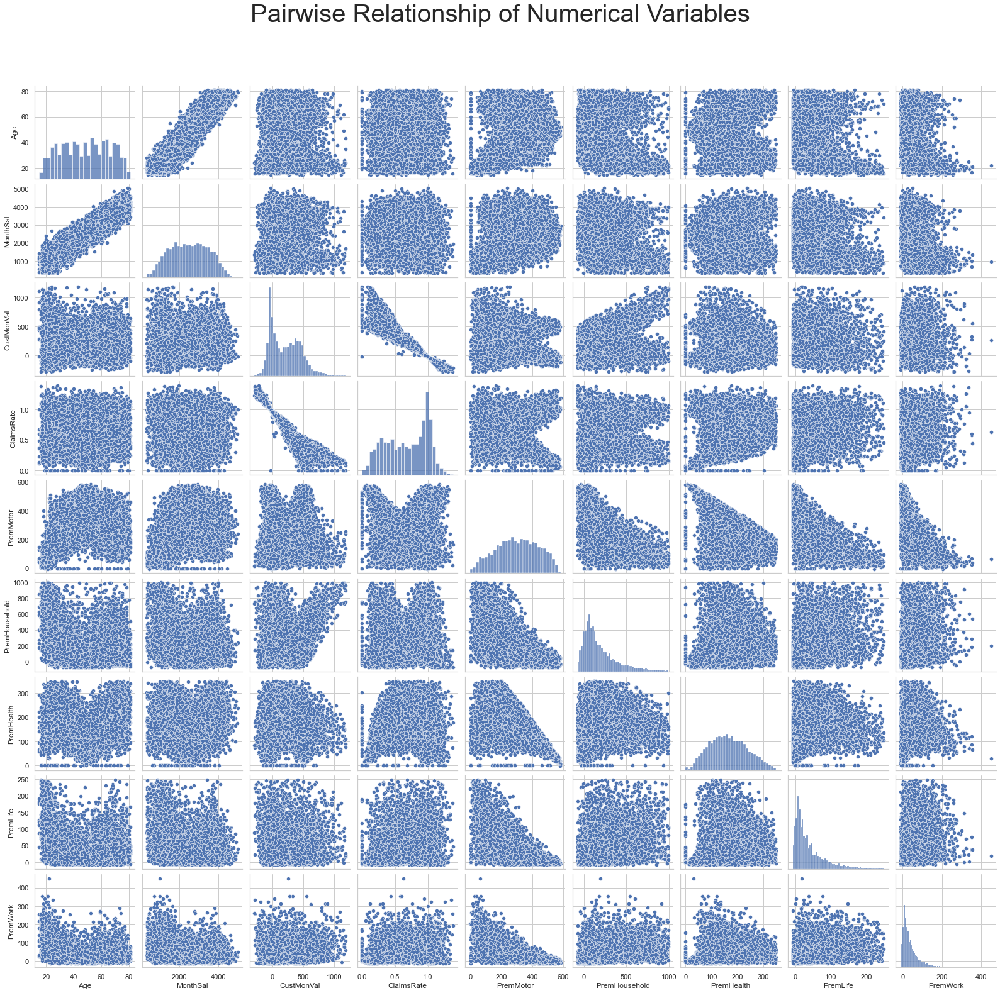

In [892]:
# data to plot
sns.set(style="whitegrid")

# Setting pairgrid
g = sns.pairplot(train_df[metric_features], diag_kind="hist")

# Layout
plt.subplots_adjust(top=0.9)
plt.suptitle("Pairwise Relationship of Numerical Variables", size=40)
plt.show()

We can see that:
  - 1) Age & MonthSal present a strong positive correlation
  - 2) ClaimsRate & CustMonVal present a negative correlation

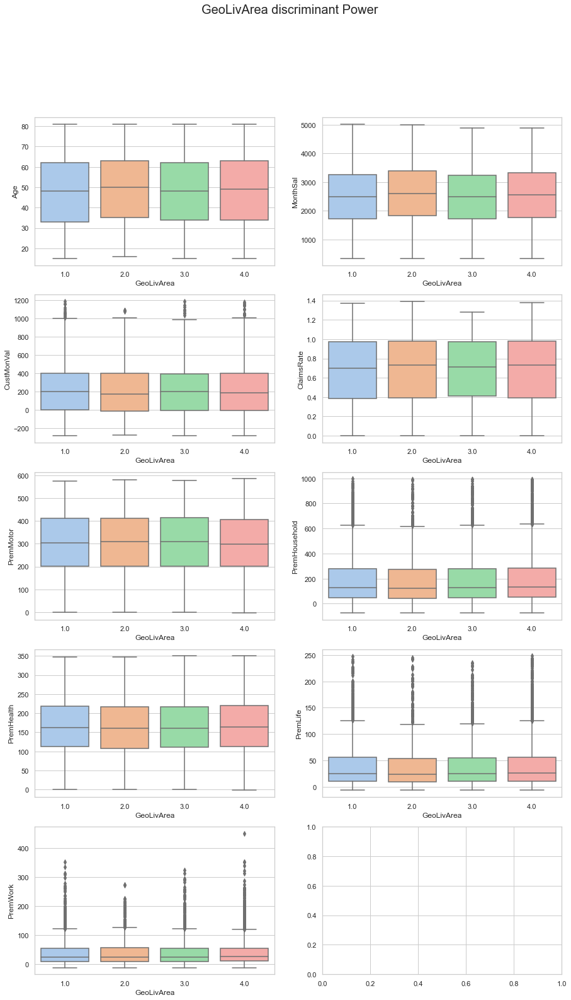

In [893]:
# All Numeric Variables' Box Plots in one figure
sns.set(style='whitegrid')

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(5, ceil(len(metric_features) / 5), figsize=(15, 25))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), metric_features): # Notice the zip() function and flatten() method
    sns.boxplot(x=train_df["GeoLivArea"], y = train_df[feat], ax=ax, palette='pastel')
    
# Layout
# Add a centered title to the figure:
title = "GeoLivArea discriminant Power"
plt.suptitle(title, size = 20)

plt.show()

*GeoLivArea* does not have significant discriminant power.

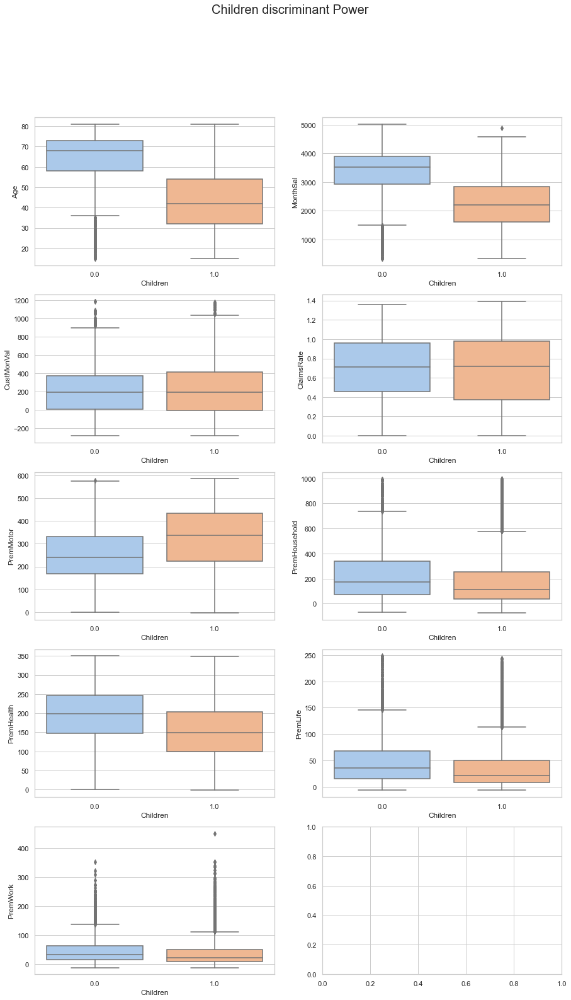

In [894]:
# All Numeric Variables' Box Plots in one figure
sns.set(style='whitegrid')

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(5, ceil(len(metric_features) / 5), figsize=(15, 25))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), metric_features): # Notice the zip() function and flatten() method
    sns.boxplot(x=train_df["Children"], y = train_df[feat], ax=ax, palette='pastel')
    
# Layout
# Add a centered title to the figure:
title = "Children discriminant Power"
plt.suptitle(title, size = 20)

plt.show()

*Children* have some discriminant power when it comes to the features *Age*, *MonthSal*.

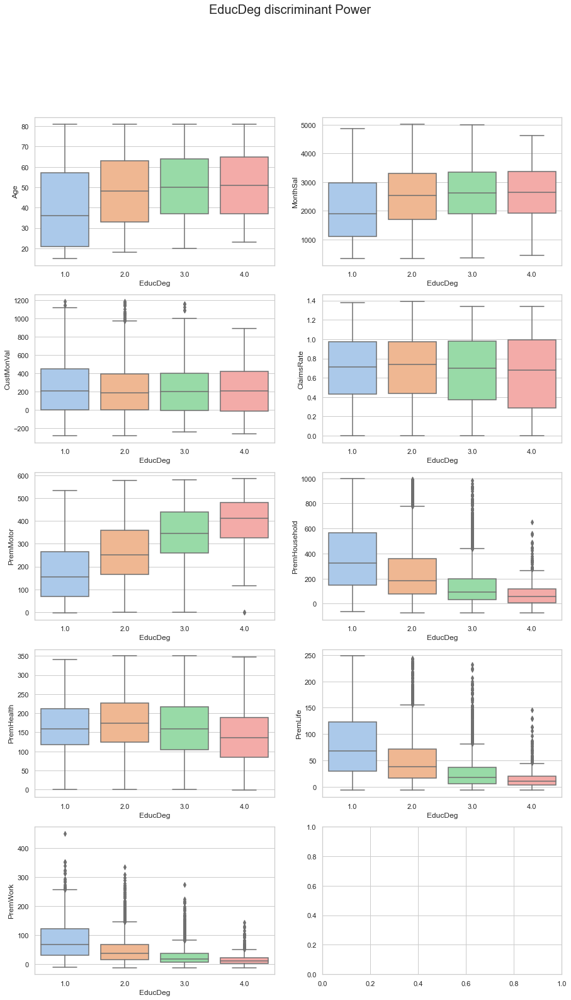

In [895]:
# All Numeric Variables' Box Plots in one figure
sns.set(style='whitegrid')

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(5, ceil(len(metric_features) / 5), figsize=(15, 25))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), metric_features): # Notice the zip() function and flatten() method
    sns.boxplot(x=train_df["EducDeg"], y = train_df[feat], ax=ax, palette='pastel')
    
# Layout
# Add a centered title to the figure:
title = "EducDeg discriminant Power"
plt.suptitle(title, size = 20)

plt.show()

*EducDeg* has discriminant power.

<div class="alert alert-block alert-danger">
    
# <b> 4. Feature Engineering </b> 
    
</div>
<a name="4."></a>

The following variable represents the sum of money the company has made from the company and 'lost' through cancelation of packages.

In [896]:
#Total of insurances
train_df["Total_balance"] = train_df["PremHealth"] + train_df["PremLife"] + train_df["PremMotor"] + train_df["PremHousehold"] + train_df["PremWork"]

To first see if it worth it to create a variable with the number of packages per client there is a sigificant percentage of packages that are not subscribed to or were canceled.

In [897]:
print('Total percentage of not subscribed packages:',(len((train_df[train_df['PremHealth'] <= 0]))+ len((train_df[train_df['PremLife'] <= 0])) + len((train_df[train_df['PremMotor'] <= 0]))+ 
      len((train_df[train_df['PremHousehold'] <= 0])) + len((train_df[train_df['PremWork'] <= 0])))/len(train_df)*100)

Total percentage of not subscribed packages: 29.77053140096618


There is a significant percentage so the variable was created.

The following variable represents the number of subscribed packages per client.

In [898]:
premiums = ['PremHealth','PremLife','PremMotor','PremHousehold','PremWork']
prem_train = train_df[premiums].copy()

for prem in premiums:
    prem_train[prem] = prem_train[prem] > 0
    prem_train[prem].replace(False, 0, inplace=True)
    prem_train[prem].replace(True, 1, inplace=True)
    
prem_health = pd.Series(prem_train['PremHealth'])
prem_life = pd.Series(prem_train['PremLife'])
prem_motor = pd.Series(prem_train['PremMotor'])
prem_household = pd.Series(prem_train['PremHousehold'])
prem_work = pd.Series(prem_train['PremWork'])

train_df['Num_Prems'] = prem_health+prem_life+prem_motor+prem_household+prem_work

train_df['Num_Prems'].value_counts()

5    7561
4    1888
3     416
2      58
0      12
1       1
Name: Num_Prems, dtype: int64

In [899]:
'''train_df['Num_Prems'] = 0 

for i in range(len(train_df)):
    count=0
    for j in (["PremHealth", "PremLife", "PremMotor", "PremHousehold", "PremWork"]):
        if train_df[j].iloc[i] > 0:
            count = count + 1
    train_df['Num_Prems'].iloc[i]=count'''

'train_df[\'Num_Prems\'] = 0 \n\nfor i in range(len(train_df)):\n    count=0\n    for j in (["PremHealth", "PremLife", "PremMotor", "PremHousehold", "PremWork"]):\n        if train_df[j].iloc[i] > 0:\n            count = count + 1\n    train_df[\'Num_Prems\'].iloc[i]=count'

money_made represents the money made by the company per client.

In [900]:
train_df['Money_spent_by_client'] = 0

for i in range(len(train_df)):
    summ=0
    for j in (["PremHealth", "PremLife", "PremMotor", "PremHousehold", "PremWork"]):
        if train_df[j].iloc[i] > 0:
            summ += train_df[j].iloc[i] 
    train_df['Money_spent_by_client'].iloc[i]=summ

The ratios were then calculated - Nan values were the result of dividing by zero and were substituted by 0.

In [901]:
## Ratios
train_df["Money_spent_over_salary"] = (train_df["Money_spent_by_client"] / (train_df["MonthSal"]*12))
train_df["Money_spent_over_salary"]= train_df["Money_spent_over_salary"].fillna(0)

train_df["Health_Ratio"] = (train_df["PremHealth"] / train_df["Total_balance"])
train_df["Life_Ratio"] = train_df["PremLife"] / train_df["Total_balance"]
train_df["Motor_Ratio"] = train_df["PremMotor"] / train_df["Total_balance"]
train_df["Household_Ratio"] = train_df["PremHousehold"] / train_df["Total_balance"]
train_df["Work_Ratio"] = train_df["PremWork"] / train_df["Total_balance"]

train_df["Health_Ratio"]= train_df["Health_Ratio"].fillna(0)

train_df["Life_Ratio"]= train_df["Life_Ratio"].fillna(0)

train_df["Motor_Ratio"]= train_df["Motor_Ratio"].fillna(0)

train_df["Household_Ratio"]= train_df["Household_Ratio"].fillna(0)

train_df["Work_Ratio"]= train_df["Work_Ratio"].fillna(0)

A variable representing the number of canceld packages was created.

In [902]:
premiums = ['PremHealth','PremLife','PremMotor','PremHousehold','PremWork']
prem_train = train_df[premiums].copy()

for prem in premiums:
    prem_train[prem] = prem_train[prem] < 0
    prem_train[prem].replace(False, 0, inplace=True)
    prem_train[prem].replace(True, 1, inplace=True)
    
prem_health = pd.Series(prem_train['PremHealth'])
prem_life = pd.Series(prem_train['PremLife'])
prem_motor = pd.Series(prem_train['PremMotor'])
prem_household = pd.Series(prem_train['PremHousehold'])
prem_work = pd.Series(prem_train['PremWork'])

train_df['Num_canceled_subscriptions'] = prem_health+prem_life+prem_motor+prem_household+prem_work

train_df['Num_canceled_subscriptions'].value_counts()

0    7749
1    1780
2     362
3      45
Name: Num_canceled_subscriptions, dtype: int64

In [903]:
'''train_df['Num_cancaled_subscriptions'] = 0 

for i in range(len(train_df)):
    count=0
    for j in (["PremHealth", "PremLife", "PremMotor", "PremHousehold", "PremWork"]):
        if train_df[j].iloc[i] < 0:
            count = count + 1
    train_df['Num_cancaled_subscriptions'].iloc[i]=count'''

'train_df[\'Num_cancaled_subscriptions\'] = 0 \n\nfor i in range(len(train_df)):\n    count=0\n    for j in (["PremHealth", "PremLife", "PremMotor", "PremHousehold", "PremWork"]):\n        if train_df[j].iloc[i] < 0:\n            count = count + 1\n    train_df[\'Num_cancaled_subscriptions\'].iloc[i]=count'

THe following variable is the 'lost' money to cancelation of subscriptions.

In [904]:
train_df['Money_from_cancelations'] = 0

for i in range(len(train_df)):
    summ=0
    for j in (["PremHealth", "PremLife", "PremMotor", "PremHousehold", "PremWork"]):
        if train_df[j].iloc[i] < 0:
            summ += train_df[j].iloc[i] 
    train_df['Money_from_cancelations'].iloc[i]=summ
    
    

In [905]:
metric_features = [feature for feature in train_df.columns if feature not in non_metric_feat]

In [906]:
new_features=['Total_balance','Money_spent_by_client','Money_spent_over_salary',
              'Health_Ratio', 'Life_Ratio', 'Motor_Ratio', 'Household_Ratio',
              'Work_Ratio', 'Money_from_cancelations','Num_canceled_subscriptions']

<div class="alert alert-block alert-danger">
    
## <b> 4.5. Scalling
    
</div>
<a name="Scalling"></a> 
    

Standard Scaller is not the best option for our data because most variables do not follow a Normal distribution.

Since there are still relevant outliers in the dataset, the most appropriate scaling is the robustscaler.

In [907]:
#scaling of the numeric features
scaler = RobustScaler().fit(train_df[metric_features])
train_df[metric_features] = scaler.transform(train_df[metric_features]) 

<div class="alert alert-block alert-danger">
    
## <b> 5. Feature Selection
    
</div>
<a name="5."></a> 

<div class="alert alert-block alert-danger">
    
### <b> 5.1. Correlations
    
</div>
<a name="5.1."></a>

In [908]:
#Check if any of the numerical variables is univariate (variance is equal to 0). Drop those variables if existent.
train_df[metric_features].var()

Age                             0.347755
MonthSal                        0.392490
CustMonVal                      0.361345
ClaimsRate                      0.287496
PremMotor                       0.421205
PremHousehold                   0.798744
PremHealth                      0.462864
PremLife                        0.895135
PremWork                        1.022732
Total_balance                   0.809303
Num_Prems                       0.353235
Money_spent_by_client           0.780216
Money_spent_over_salary         2.466615
Health_Ratio                    0.504124
Life_Ratio                      0.875930
Motor_Ratio                     0.409623
Household_Ratio                 0.507821
Work_Ratio                      1.003405
Num_canceled_subscriptions      0.295127
Money_from_cancelations       132.350732
dtype: float64

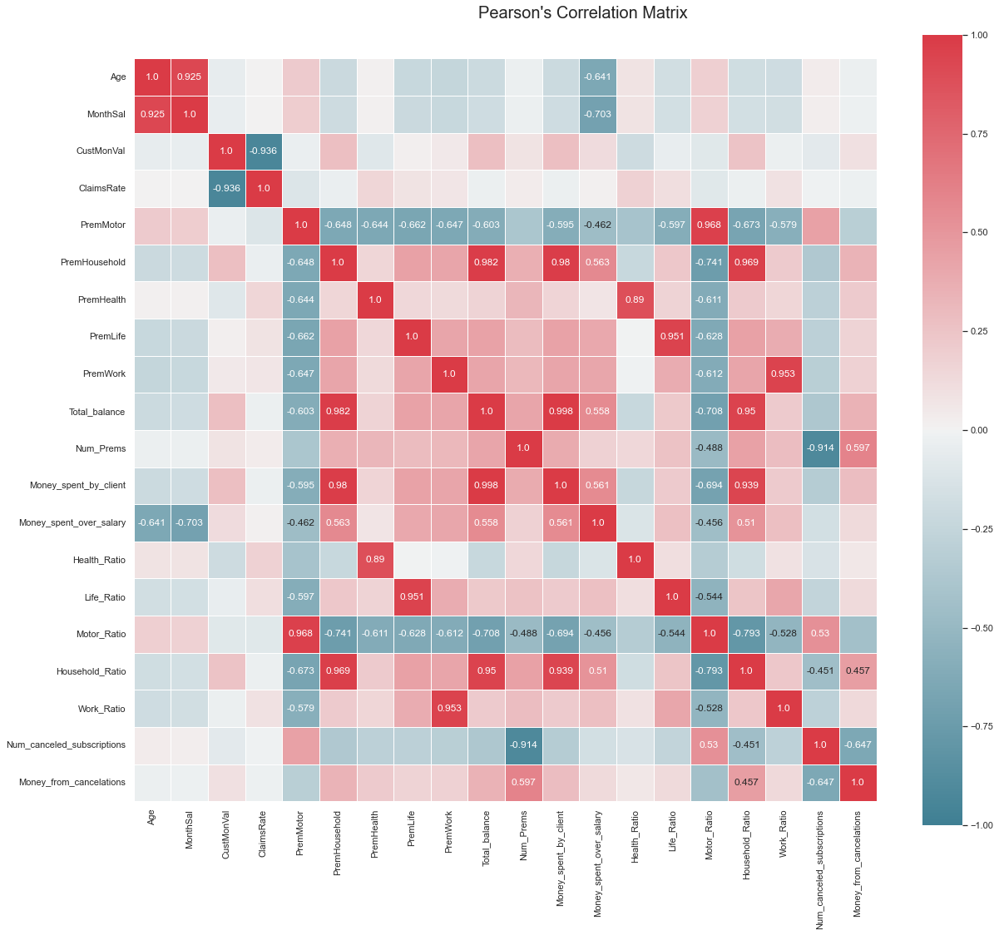

In [909]:
cor_ = np.round(train_df[metric_features].corr(method ='pearson'), decimals=3)

fig = plt.figure(figsize=(20, 16))

# Build annotation matrix (values above |0.3| will appear annotated in the plot)
mask_annot = np.absolute(cor_.values) >= 0.45
annot = np.where(mask_annot, cor_.values, np.full(cor_.shape,"")) 

sns.heatmap(data=cor_, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

fig.subplots_adjust(top=0.95)
fig.suptitle("Pearson's Correlation Matrix", fontsize=20)

plt.show()

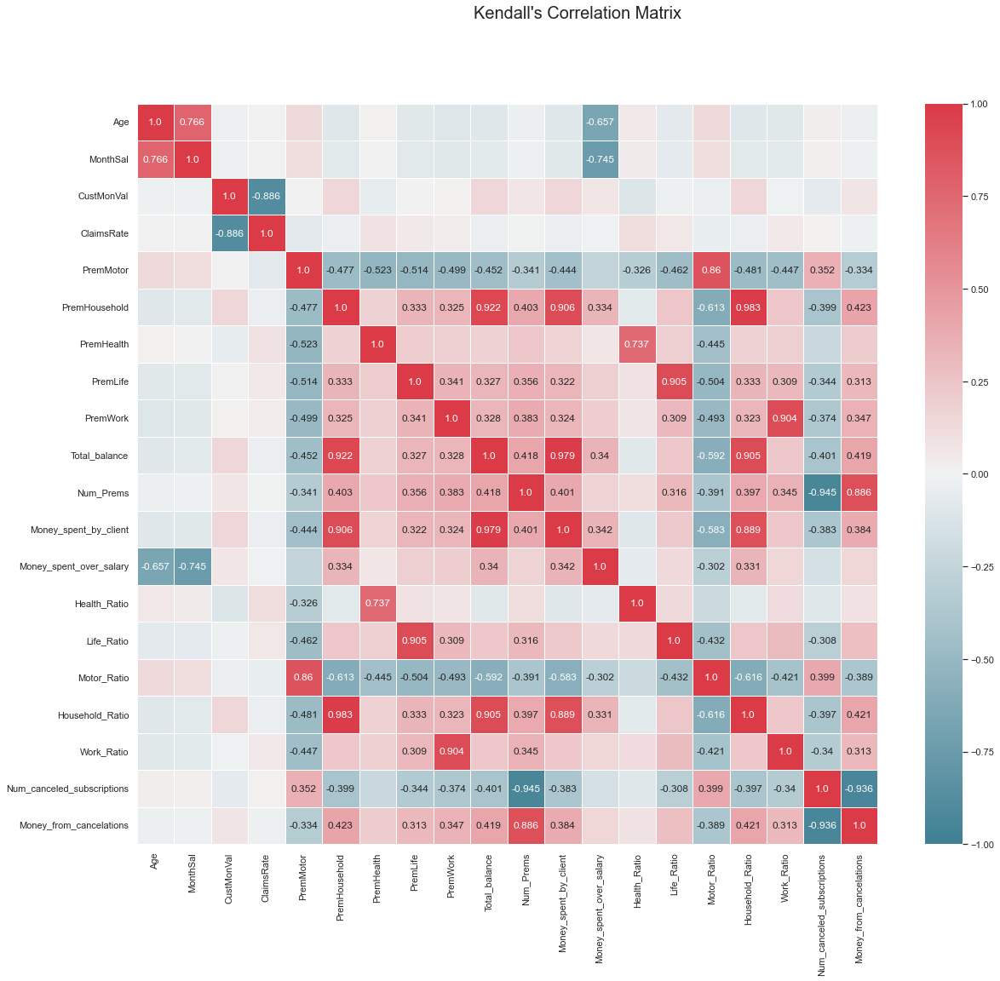

In [910]:
cor_ = np.round(train_df[metric_features].corr(method ='kendall'), decimals=3)

fig = plt.figure(figsize=(20, 16))

# Build annotation matrix (values above |0.3| will appear annotated in the plot)
mask_annot = np.absolute(cor_.values) >= 0.3
annot = np.where(mask_annot, cor_.values, np.full(cor_.shape,"")) 

sns.heatmap(data=cor_, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

# Layout
# Add a centered title to the figure:
title = "Kendall's Correlation Matrix"

plt.suptitle(title, size = 20)

plt.show()

*MonthSal* and *Age* have a very high correlation and so, *MonthSal* is chosen as the potential to buy packages is more important than how old they are;

*CustMonVal* and *ClaimsRate* have a very high correlation, but *ClaimsRate* is decided to be more important as it is based on the last 2 years and not since they bocame clients, which maintains the relvancy of the newer clients;

Total_balance and profit have an extremely high correltion with PremHousehold and to each-other.

Ratio variables have a high correlation with the variable they are based on, so only the ratio variable ou the original variable can be used.



<div class="alert alert-block alert-danger">
    
## <b> 5.2. New variables' distributions and Discriminant Power
    
</div>
<a name="5.2."></a>

'To do this, we suggest you segment the customers using different perspectives
and approaches, as well as combine and analyze the results. A2Z would like to understand the value
and demographics of each customer segment, as well as understand which types of insurance they will
be more interested in buying.'

In [911]:
#Check if any of the numerical variables is univariate (variance is equal to 0). Drop those variables if existent.
train_df[new_features].var()

Total_balance                   0.809303
Money_spent_by_client           0.780216
Money_spent_over_salary         2.466615
Health_Ratio                    0.504124
Life_Ratio                      0.875930
Motor_Ratio                     0.409623
Household_Ratio                 0.507821
Work_Ratio                      1.003405
Money_from_cancelations       132.350732
Num_canceled_subscriptions      0.295127
dtype: float64

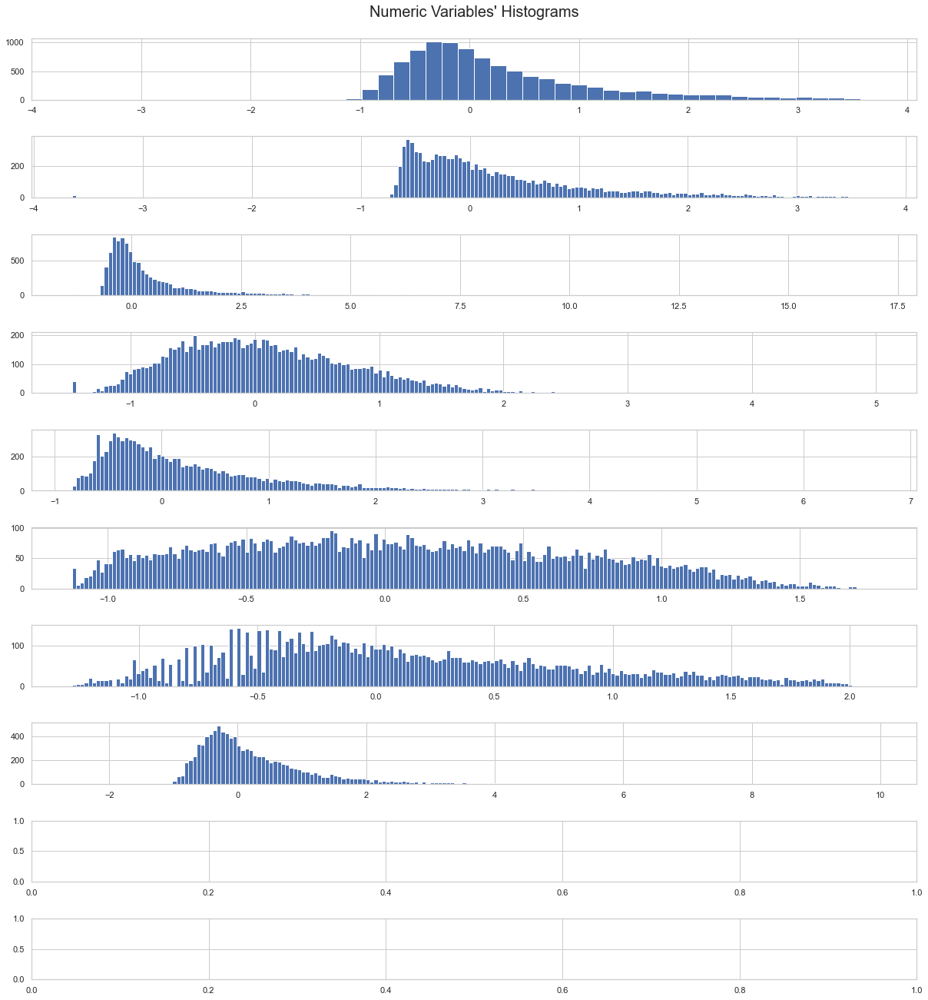

In [912]:
# All Numeric Variables' Histograms in one figure
sns.set(style="whitegrid")

#for each variable
#min x   FirstPolYear min - 1900
min_x = [0, 0, -170000, 0, -10, -100, -5, -10]
#max x  FirstPolYear max - 54000,
max_x = [1000, 57000, 12000, 300, 1300, 27000, 30000, 500]
#bins
bins = [50, 200, 200, 200, 200, 200, 200, 200]

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(len(new_features), 1, figsize=(20, 20))

# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat, max_x, min_x, bin_f in zip(axes.flatten(), new_features, max_x, min_x, bins): # Notice the zip() function and flatten() method
    ax.hist(train_df[feat],bins=bin_f)

plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.95,
                    #wspace=0.3,
                    hspace=0.6)
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Histograms"

plt.suptitle(title, size = 20)

plt.show()

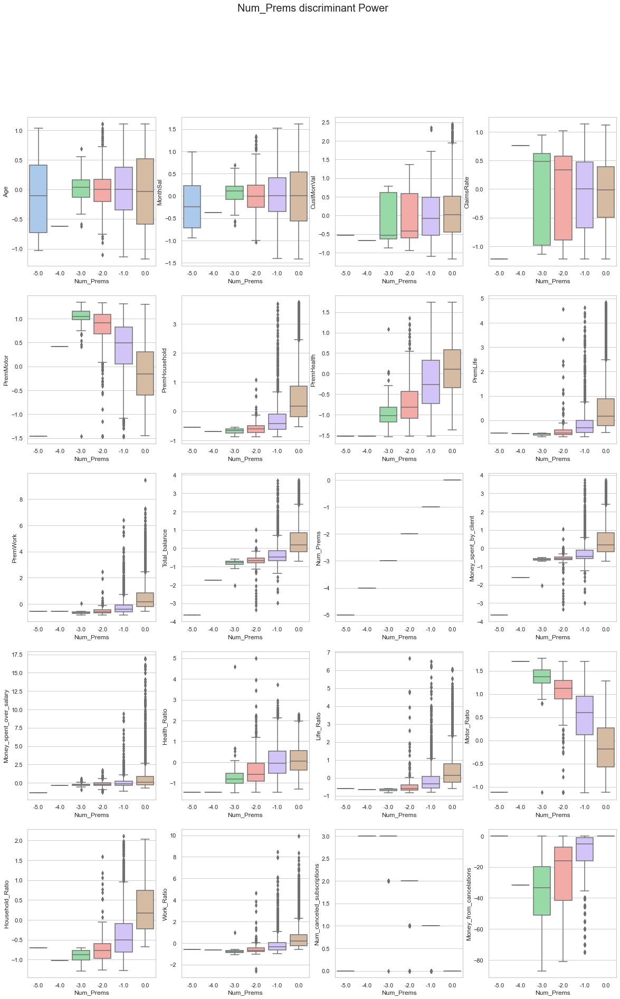

In [913]:
# All Numeric Variables' Box Plots in one figure
sns.set(style='whitegrid')

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(5, ceil(len(metric_features) / 5), figsize=(20, 30))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), metric_features): # Notice the zip() function and flatten() method
    sns.boxplot(x=train_df["Num_Prems"], y = train_df[feat], ax=ax, palette='pastel')
    
# Layout
# Add a centered title to the figure:
title = "Num_Prems discriminant Power"
plt.suptitle(title, size = 20)

plt.show()

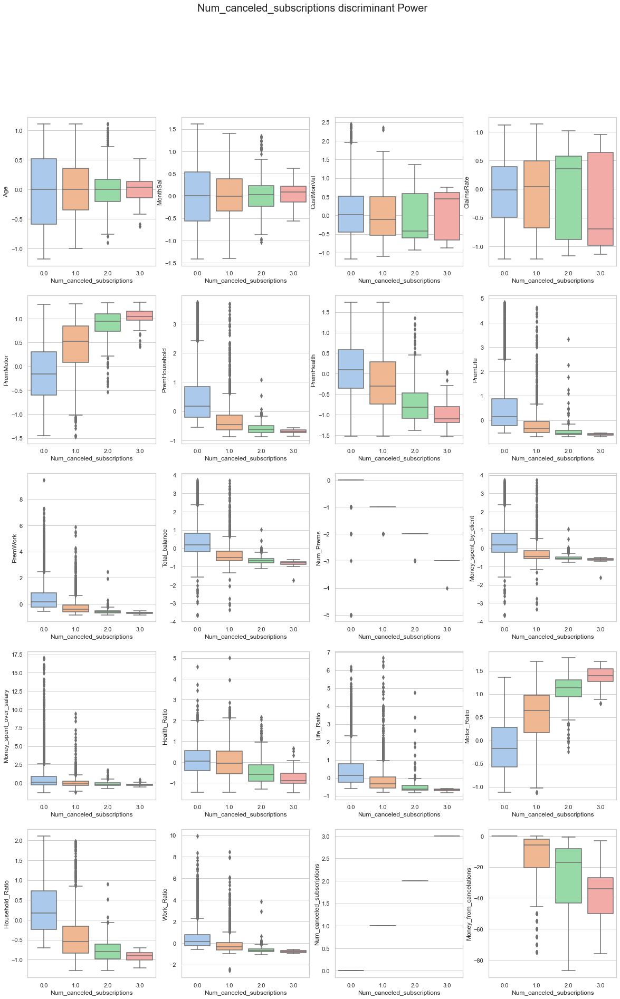

In [914]:
# All Numeric Variables' Box Plots in one figure
sns.set(style='whitegrid')

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(5, ceil(len(metric_features) / 5), figsize=(20, 30))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), metric_features): # Notice the zip() function and flatten() method
    sns.boxplot(x=train_df["Num_canceled_subscriptions"], y = train_df[feat], ax=ax, palette='pastel')
    
# Layout
# Add a centered title to the figure:
title = "Num_canceled_subscriptions discriminant Power"
plt.suptitle(title, size = 20)

plt.show()

In [915]:
sociodemographic = ['Children', 'MonthSal', "EducDeg"]

product = ['PremHealth', 'PremHousehold', 'PremLife', 'PremMotor', 'PremWork']
#product = ["Money_spent_over_salary","Health_Ratio","Life_Ratio","Motor_Ratio","Household_Ratio","Work_Ratio"]

value = ['ClaimsRate', 'Money_spent_by_client','Money_from_cancelations', 'Money_spent_over_salary']
#Num_Prems

<div class="alert alert-block alert-danger">
    
### <b> 6. PCA
    
</div>
<a name="6."></a>

PCA is design measures variation, therefore, it is more effective without categorical features. This said, PCA is not helpful for the socialdemographic prespective once it only has on numeric variable so A PCA will not be performed for this prespective.

As the company wants understand which types of insurance are more interested for the customers, we did not performed PCA for the product prespective in order to analyse them seperatly.

So, PCA was only carried out for the value perspective.

In [691]:
#function to help interprete PCA results
def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

#### Value

In [692]:
value_pca = train_df[value].copy()

In [693]:
pca_v = PCA()
pca_value_feat = pca_v.fit_transform(value_pca) 

In [694]:
pd.DataFrame(
    {"Eigenvalue": pca_v.explained_variance_,
     "Difference": np.insert(np.diff(pca_v.explained_variance_), 0, 0),
     "Proportion": pca_v.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca_v.explained_variance_ratio_)},
    index=range(1, pca_v.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,132.455212,0.000000,0.974759,0.974759
2,2.693281,-129.761931,0.019820,0.994579
3,0.450376,-2.242905,0.003314,0.997894
4,0.286191,-0.164185,0.002106,1.000000


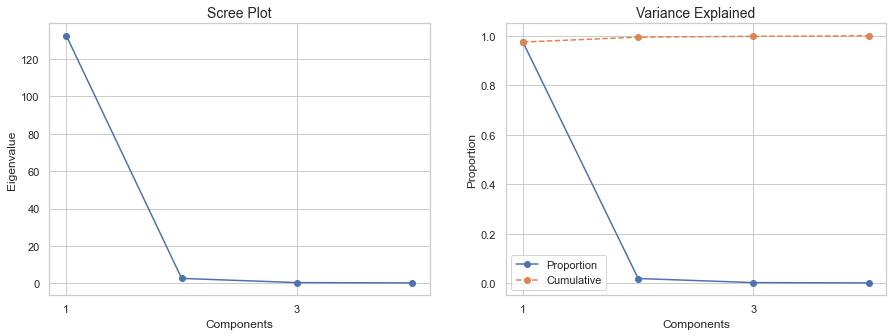

In [695]:
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots
ax1.plot(pca_v.explained_variance_, marker=".", markersize=12)
ax2.plot(pca_v.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca_v.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca_v.n_components_, 2))
ax1.set_xticklabels(range(1, pca_v.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca_v.n_components_, 2))
ax2.set_xticklabels(range(1, pca_v.n_components_ + 1, 2))

plt.show()

The first PC accounts for almost 100% of the variance.

In [696]:
# Perform PCA again with 1 principal component
pca_v = PCA(n_components=1)
value_pca_feat = pca_v.fit_transform(value_pca)
value_pca_feat_names = [f"PC{i+1}" for i in range(pca_v.n_components_)]
value_pca_df = pd.DataFrame(value_pca_feat, index=value_pca.index, columns=value_pca_feat_names)  # remember index=df_pca.index

In [697]:
# Reassigning df to contain pca variables
value_pca_df = pd.concat([value_pca, value_pca_df], axis=1)
value_pca_df.head()

,ClaimsRate,Money_spent_by_client,Money_from_cancelations,Money_spent_over_salary,PC1
CustID,,,,,
1,-0.559322,-0.155187,0.0,0.143087,-3.717463
2,0.677966,1.133137,0.0,5.276015,-3.836075
3,-0.745763,0.238765,0.0,0.239486,-3.728028
4,0.457627,-0.495800,0.0,1.331945,-3.730133
5,0.305085,-0.345863,0.0,0.395774,-3.716868


In [698]:
# Interpreting each Principal Component
loadings = value_pca_df[value_pca.columns.tolist() + value_pca_feat_names].corr().loc[value_pca_df.columns.tolist(), value_pca_feat_names]
loadings.style.applymap(_color_red_or_green)

,PC1
ClaimsRate,0.022910
Money_spent_by_client,-0.285910
Money_from_cancelations,-0.999994
Money_spent_over_salary,-0.130861
PC1,1.000000


In [699]:
value_pca_df.var()

ClaimsRate                   0.287496
Money_spent_by_client        0.780216
Money_from_cancelations    132.350732
Money_spent_over_salary      2.466615
PC1                        132.455212
dtype: float64

In [700]:
value_pca_df.mean()

ClaimsRate                -7.030418e-02
Money_spent_by_client      2.625205e-01
Money_from_cancelations   -3.734315e+00
Money_spent_over_salary    5.188991e-01
PC1                        4.844488e-16
dtype: float64

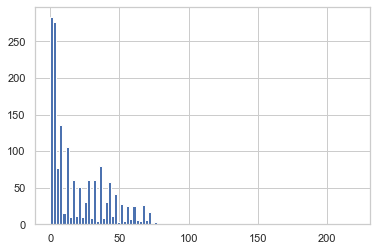

In [701]:
plt.hist(value_pca_df['PC1'],range=[0,220],bins = 100)
plt.show()

The PCA for the value prespective should be clearly done with one principal component. However observing its histogram, we cannot capture any evident clusters. 
The results are not much interpretable or meaningful and the clusters obtain using clustering methods with the original features obtain better results.
PCA is discarded.

<div class="alert alert-block alert-danger">
    
# <b> 7. Clustering by Perspectives </b> 
    
</div>

<a name="7."></a>

### DBSCAN
#### Characteristics:
- No need to define number of clusters apriori
- Resistant to noise and outliers
- Can identify outliers
- Can handle clusters of different shapes and sizes
- Depends highly on the epsilon hyperparameter and it can be hard to tune
- Does not work well with clusters of varying densities

#### Defining eps and min_samples:
- **MinPts**: As a rule of thumb, **minPts = 2 x dim** can be used, but it may be necessary to choose larger values for very large data, for noisy data or for data that contains many duplicates.

- **ε**: The value for ε can then be chosen by using a **k-distance graph**, plotting the distance to the kth (k = minPts - 1) nearest neighbor ordered from the largest to the smallest value. Good values of ε are where this plot shows an **"elbow"**: if ε is chosen much too small, a large part of the data will not be clustered; whereas for a too high value of ε, clusters will merge and the majority of objects will be in the same cluster. **The assumption is that for points in a cluster, their k nearest neighbors are at roughly the same distance**. Noise points have their k-th nearest neighbors at farther distance

### Birch
It is a memory-efficient, online-learning algorithm provided as an alternative to MiniBatchKMeans. It constructs a tree data structure with the cluster centroids being read off the leaf. These can be either the final cluster centroids or can be provided as input to another clustering algorithm such as AgglomerativeClustering.

### Mean-Shift
#### Characteristics:
- No need to define number of clusters apriori
- Can detect clusters of any shape
- Robust to outliers
- Depends on the bandwidth hyperparameter (but there's a way to estimate it)
- **Main drawback**: Poor scalability (on both the algorithm and in estimating the bandwidth)

### Gaussian Mixture Model (GMM)
#### Characteristics:
- Assumes the data is generated from a mixture of finite number of Gaussian distributions with unknown parameters
- Use the EM (Expectation Maximization algorithm) to estimate the parameters
- Provides a probability of each observation belonging to each cluster
- Advantages over K-Means:
    - Can deal with spherical and elipsoid cluster shapes
    - Number of components needs to be defined apriori
    
### Hierarchical Clustering
The Hierarchical Clusteing can be used to decide the number of clusters, keeping in mind that the bigger the distance (vertically) between links, the bigger the diffeente between sub-cluster



Q-Q plots, aka Quantile-Quantile plots, are used to visually compare how similar two distributions are to each other. They consist of plotting the quantiles (i.e. regular intervals) of the observed distribution against the quantiles of the theoretical distribution. The closer the Q-Q plots are to forming a straight line, the more confident you can be that the observed and theoretical distributions are the same.

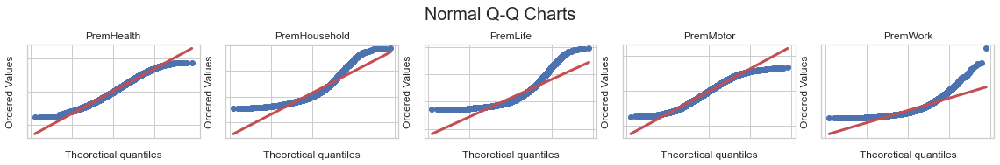

In [702]:
# Normal Q-Q plots
figure = plt.figure(figsize = (16,12))
for i in range(len(train_df[product].columns)):
    
    # Q-Q plot
    ax = plt.subplot(6,5, i+1)
    stats.probplot(train_df[product].iloc[:,i], dist='norm', plot=plt)
    
    # Aesthetics
    ax.get_lines()[0].set_markersize(6.0)
    ax.get_lines()[1].set_linewidth(3.0)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    plt.title(train_df[product].columns[i])
    
figure.tight_layout(h_pad=1.0, w_pad=0.5)
plt.suptitle('Normal Q-Q Charts', y=1.02, fontsize=20)
plt.show()

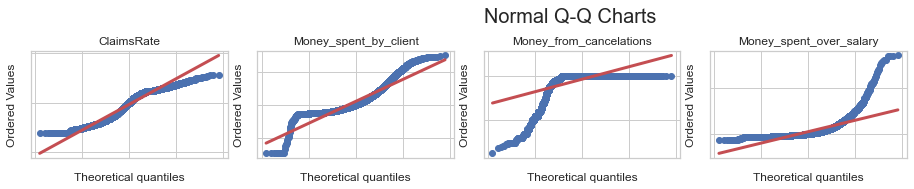

In [703]:
# Normal Q-Q plots
figure = plt.figure(figsize = (16,12))
for i in range(len(train_df[value].columns)):
    
    # Q-Q plot
    ax = plt.subplot(6,5, i+1)
    stats.probplot(train_df[value].iloc[:,i], dist='norm', plot=plt)
    
    # Aesthetics
    ax.get_lines()[0].set_markersize(6.0)
    ax.get_lines()[1].set_linewidth(3.0)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    plt.title(train_df[value].columns[i])
    
figure.tight_layout(h_pad=1.0, w_pad=0.5)
plt.suptitle('Normal Q-Q Charts', y=1.02, fontsize=20)
plt.show()

### Profiling Functions

In [704]:
def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

def r2(df, labels):
    sst = get_ss(df)
    ssw = np.sum(df.groupby(labels).apply(get_ss))
    return 1 - ssw/sst
    
def get_r2_scores(df, clusterer, min_k=2, max_k=10):
    """
    Loop over different values of k. To be used with sklearn clusterers.
    """
    r2_clust = {}
    for n in range(min_k, max_k):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = r2(df, labels)
    return r2_clust

In [705]:
def individual_profile(dataframe, predi, selected_dataframe,selected_vars):      
    
    # Characterizing the 3 clusters - 
    df_concat = dataframe
    hc=df_concat.groupby('clusters').mean()
    hc['Labels_'] = hc.index
    print('           Visualization of the mean of the metric features of each cluster')
    fig=plt.figure(figsize=(10,7))
    for i, feature in enumerate(selected_vars):
        ax=fig.add_subplot(1,len(selected_vars),i+1)
        sns.barplot(hc.index,hc[feature])
        plt.title(feature)
    plt.tight_layout()
    plt.show()
    
    plt.figure(figsize=(20, 10))
    pd.plotting.parallel_coordinates(hc, class_column='Labels_', color=sns.color_palette())
    plt.xticks(fontsize=15)
    plt.title("Coordinates", fontsize=20)
    plt.show()

    print("\n r2 =", r2(dataframe[selected_vars], dataframe['clusters']),'\n')  
    
    print('                                                    Clusters histograms')
    for j in range(len(np.unique(dataframe['clusters']))):
        fig, axes = plt.subplots(1, (len(selected_vars) ), figsize=(20, 3))
        cond=(dataframe.loc[dataframe['clusters']==j])
        for ax, feat in zip(axes.flatten(), selected_vars):
            ax.set_title(feat+" Distribution")
            cond[feat].hist(bins=15, ax=ax)
    fig.tight_layout() 
    plt.show()
    
    plt.figure(figsize=(7,5))
    sns.countplot(x=dataframe['clusters'])
    plt.title('Clusters Size', fontsize=10)
    plt.show()
    

    # PCA
    pca_var = PCA()
    pca_var.fit(selected_dataframe)
    # Plot
    plt.figure(figsize=(7,5))
    xi = np.arange(1,1+selected_dataframe.shape[1], step=1)
    yi = np.cumsum(pca_var.explained_variance_ratio_)
    plt.plot(xi, yi, marker='o', linestyle='--', color='b')
    # Aesthetics
    plt.ylim(0.0,1.1)
    plt.xlabel('Number of Components')
    plt.xticks(np.arange(1,1+selected_dataframe.shape[1], step=1))
    plt.ylabel('Cumulative variance (%)')
    plt.title('Explained variance by each component')
    plt.axhline(y=1, color='r', linestyle='-')
    plt.gca().xaxis.grid(False)
    plt.show()

In [706]:
def individual_profile_kprototypes(dataframe, predi, selected_dataframe,selected_vars): 
    
    print('clusters size')
    plt.figure(figsize=(10,4))
    sns.countplot(x=dataframe['clusters'])
    plt.title('Predicted clusters')
    plt.show()


### SOM Functions

In [707]:
def som(dataset,x,y,features):
    np.random.seed(42)

    sm = sompy.SOMFactory().build(
        dataset.values, 
        mapsize=[x, y],  # NEEDS TO BE A LIST
        initialization='random', 
        neighborhood='gaussian',
        training='batch',
        lattice='hexa',
        component_names=features
    )
    sm.train(n_job=4, verbose='info', train_rough_len=100, train_finetune_len=100)
    return sm

In [708]:
###################################
### Visualizing Component Planes ##
###################################

def plot_component_planes(weights,
                          features,
                          M=3, N=4, 
                          figsize=(20,20),
                          figlayout=(3,4),
                          title="Component Planes",
                          cmap=cm.magma
                         ):
    
    xx, yy = np.meshgrid(np.arange(M), np.arange(N))
    xx = xx.astype(float)
    yy = yy.astype(float)

    xx[::-2] -= 0.5

    xx = xx.T
    yy = yy.T
    
    weights_ = weights.reshape((M,N,len(features)))

    fig = plt.figure(figsize=figsize, constrained_layout=True)
    subfigs = fig.subfigures(figlayout[0], figlayout[1], wspace=.15)
    
    ## Normalize color scale to range of all values
    colornorm = mpl_colors.Normalize(vmin=np.min(weights), 
                                         vmax=np.max(weights))

    for cpi, sf in zip(range(len(features)), subfigs.flatten()):

        sf.suptitle(features[cpi], y=0.95)

        axs = sf.subplots(1,1, )
        axs.set_aspect('equal')

        ## Normalize color scale to range of values in each component
        colornorm = mpl_colors.Normalize(vmin=np.min(weights_[:,:,cpi]), 
                                         vmax=np.max(weights_[:,:,cpi]))

        # iteratively add hexagons
        for i in range(weights_.shape[0]):
            for j in range(weights_.shape[1]):
                wy = yy[(i, j)] * np.sqrt(3) / 2
                hexagon = RegularPolygon((xx[(i, j)], wy), 
                                     numVertices=6, 
                                     radius=.99 / np.sqrt(3),
                                     facecolor=cmap(colornorm(weights_[i, j, cpi])), 
                                     alpha=1, 
                                     linewidth=.5,
                                     edgecolor=cmap(colornorm(weights_[i, j, cpi]))
                                    )
                axs.add_patch(hexagon)


        ## only run this block if matplotlib >= 3.6.x
        mplv = [int(i) for i in mplver.split('.')]
        if mplv[1] >= 6:
            ## Add colorbar
            divider = make_axes_locatable(axs)

            ax_cb = divider.append_axes("right", size="7%")#, pad="2%")

            ## Create a Mappable object
            cmap_sm = plt.cm.ScalarMappable(cmap=cmap, norm=colornorm)
            cmap_sm.set_array([])

            ## Create custom colorbar 
            cb1 = colorbar.Colorbar(ax_cb,
                                    orientation='vertical', 
                                    alpha=1,
                                    mappable=cmap_sm
                                    )
            cb1.ax.get_yaxis().labelpad = 16

            ## Add colorbar to plot
            sf.add_axes(ax_cb)



        ## Remove axes for hex plot
        axs.margins(.05)
        axs.axis("off")


    fig.suptitle(title)
    plt.show()

In [709]:
# using R²
def get_ss(df):
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

In [710]:
def all_in_one(sm, perspective, method,n_clusters):
    if method == 'kmeans':
        kmeans = KMeans(n_clusters=n_clusters, init='k-means++', n_init=20, random_state=42)
        nodeclus_labels = kmeans.fit_predict(sm.codebook.matrix)
    else:
        hierclust = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
        nodeclus_labels = hierclust.fit_predict(sm.codebook.matrix)
        
    sm.cluster_labels = nodeclus_labels  # setting the cluster labels of sompy

    hits  = HitMapView(12, 12,"Clustering",text_size=10)
    hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

    plt.show()

    # Check the nodes and and respective clusters
    nodes = sm.codebook.matrix

    df_nodes = pd.DataFrame(nodes, columns=perspective)
    df_nodes['clusters'] = nodeclus_labels

    # Obtaining SOM's BMUs labels
    bmus_map = sm.find_bmu(train_df[perspective])[0]  # get bmus for each observation in df

    df_bmus = pd.DataFrame(
        np.concatenate((train_df[perspective], np.expand_dims(bmus_map,1)), axis=1),
        index=train_df[perspective].index, columns=np.append(train_df[perspective].columns,"BMU")
    )
    # Get cluster labels for each observation
    df_final = df_bmus.merge(df_nodes['clusters'], 'left', left_on="BMU", right_index=True)

    # Characterizing the final clusters
    df_final.drop(columns='BMU').groupby('clusters').mean()

    # using R²
    sst = get_ss(df_final[perspective])  # get total sum of squares
    ssw_labels = df_final[perspective + ["clusters"]].groupby(by='clusters').apply(get_ss)  # compute ssw for each cluster labels
    ssb = sst - np.sum(ssw_labels)
    r2 = ssb / sst
    return r2

In [711]:
def hc_method(feature):
    # Prepare input
    hc_methods = ["ward", "complete", "average", "single"]
    # Call function defined above to obtain the R2 statistic for each hc_method
    max_nclus = 10
    r2_hc_methods = np.vstack(
        [
            get_r2_hc(df=pd.DataFrame(feature), link_method=link, max_nclus=max_nclus) 
            for link in hc_methods
        ]
    ).T
    r2_hc_methods = pd.DataFrame(r2_hc_methods, index=range(1, max_nclus + 1), columns=hc_methods)

    sns.set()
    # Plot data
    fig = plt.figure(figsize=(11,5))
    sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

    # Finalize the plot
    fig.suptitle("R2 plot for various hierarchical methods", fontsize=21)
    plt.gca().invert_xaxis()  # invert x axis
    plt.legend(title="HC methods", title_fontsize=11)
    plt.xticks(range(1, max_nclus + 1))
    plt.xlabel("Number of clusters", fontsize=13)
    plt.ylabel("R2 metric", fontsize=13)

    plt.show()

In [712]:
def dendogram(linkage,feature,y_threshold):
    # setting distance_threshold=0 and n_clusters=None ensures we compute the full tree
    distance = 'euclidean'
    hclust = AgglomerativeClustering(linkage=linkage, affinity=distance, distance_threshold=0, n_clusters=None)
    hclust.fit_predict(pd.DataFrame(feature))

    ##########################
    ## Plot Dendrogram
    ##########################

    # create the counts of samples under each node (number of points being merged)
    counts = np.zeros(hclust.children_.shape[0])
    n_samples = len(hclust.labels_)

    # hclust.children_ contains the observation ids that are being merged together
    # At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
    for i, merge in enumerate(hclust.children_):
        # track the number of observations in the current cluster being formed
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                # If this is True, then we are merging an observation
                current_count += 1  # leaf node
            else:
                # Otherwise, we are merging a previously formed cluster
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    # the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
    # the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
    # the counts indicate the number of points being merged (dendrogram's x-axis)
    linkage_matrix = np.column_stack(
        [hclust.children_, hclust.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    sns.set()
    fig = plt.figure(figsize=(11,5))
    # The Dendrogram parameters need to be tuned
    y_threshold = y_threshold
    dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
    plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
    plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
    plt.xlabel('Number of points in node (or index of point if no parenthesis)')
    plt.ylabel(f'{distance.title()} Distance', fontsize=13)
    plt.show()

In [713]:
def hist_som_map(feature,n_clusters,linkage):
    # Perform Hierarchical clustering on top of the 2500 untis (sm.get_node_vectors() output)
    hierclust = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage)
    nodeclus_labels = hierclust.fit_predict(feature.codebook.matrix)
    feature.cluster_labels = nodeclus_labels  # setting the cluster labels of sompy

    hits  = HitMapView(12, 12,"Clustering",text_size=10)
    hits.show(feature, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

    plt.show()
    return nodeclus_labels

In [714]:
def kmeans_som_map(feature,n_clusters):
    # Perform K-Means clustering on top of the 2500 untis (sm.get_node_vectors() output)
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', n_init=20, random_state=42)
    nodeclus_labels = kmeans.fit_predict(feature.codebook.matrix)
    feature.cluster_labels = nodeclus_labels  # setting the cluster labels of sompy

    hits = HitMapView(12, 12,"Clustering", text_size=10)
    hits.show(feature, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

    plt.show()
    return nodeclus_labels

In [715]:
def silhouette_kmeans(feature, n_clusters):
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=n_clusters, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(feature)

    # Calculate the silhouette score for the entire dataset
    silhouette_avg = silhouette_score(feature, cluster_labels)
    print(f"For n_clusters = {n_clusters}, the average silhouette_score is : {silhouette_avg}")

    # Calculate the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(feature, cluster_labels)

    # Create a subplot with 1 row and 1 column
    fig, ax = plt.subplots(1, 1)

    # # The silhouette plot
    # ax.set_xlim([-0.2, 0.6])
    # ax.set_ylim([0, len(X) + (3 + 1) * 10])

    y_lower = 10
    for i in range(n_clusters):  # Only include the silhouette scores for the 3 clusters of interest
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)  # Use a different color map
        ax.fill_betweenx(np.arange(y_lower, y_upper),
                         0, ith_cluster_silhouette_values,
                         facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax.set_title("The silhouette plot for clusters.")
    ax.set_xlabel("The silhouette coefficient values")
    ax.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax.set_yticks([])  # Clear the yaxis labels / ticks
    ax.set_xticks([-0.4,-0.3,-0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8])

    plt.show()


In [716]:
def silhouette_hist(feature, n_clusters, linkage):
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the AgglomerativeClustering object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    hierclust = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage)
    cluster_labels = hierclust.fit_predict(feature)

    # Calculate the silhouette score for the entire dataset
    silhouette_avg = silhouette_score(feature, cluster_labels)
    print(f"For n_clusters = {n_clusters}, the average silhouette_score is : {silhouette_avg}")

    # Calculate the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(feature, cluster_labels)

    # Create a subplot with 1 row and 1 column
    fig, ax = plt.subplots(1, 1)

    # # The silhouette plot
    # ax.set_xlim([-0.2, 0.6])
    # ax.set_ylim([0, len(X) + (3 + 1) * 10])

    y_lower = 10
    for i in range(n_clusters):  # Only include the silhouette scores for the 3 clusters of interest
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)  # Use a different color map
        ax.fill_betweenx(np.arange(y_lower, y_upper),
                         0, ith_cluster_silhouette_values,
                         facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax.set_title("The silhouette plot for clusters.")
    ax.set_xlabel("The silhouette coefficient values")
    ax.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax.set_yticks([])  # Clear the yaxis labels / ticks
    ax.set_xticks([-0.4,-0.3,-0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8])

    plt.show()

In [717]:
def bmu(sm,feature):
    # Obtaining SOM's BMUs labels
    bmus_map = sm.find_bmu(train_df[feature])[0]  # get bmus for each observation in df

    df_bmus = pd.DataFrame(
        np.concatenate((train_df, np.expand_dims(bmus_map,1)), axis=1),
        index=train_df.index, columns=np.append(train_df.columns,"BMU")
    )
    return df_bmus

In [718]:
# using R²
def r_square(df,feature):
    sst = get_ss(df[feature])  # get total sum of squares
    ssw_labels = df[feature + ["clusters"]].groupby(by='clusters').apply(get_ss)  # compute ssw for each cluster labels
    ssb = sst - np.sum(ssw_labels)  
    r2 = ssb / sst
    return r2

In [719]:
def tables(sm,node,feature):
    
    nodes = sm.codebook.matrix
    df_nodes = pd.DataFrame(nodes, columns=feature)
    df_nodes['label'] = node
    
    df_bmus = bmu(sm, feature)

    df_final = df_bmus.merge(df_nodes['label'], 'left', left_on="BMU", right_index=True)
    df_final = df_final.drop(columns='BMU')
    df_final.rename(columns ={'label': 'clusters'}, inplace = True)
    
    df_final_drop_bmu = df_final.groupby('clusters').mean()
    
    return df_nodes, df_bmus, df_final, df_final_drop_bmu

In [720]:
def get_r2_hc(df, link_method, max_nclus, min_nclus=1, dist="euclidean"):
    
    sst = get_ss(df)  # get total sum of squares
    
    r2 = []  # where we will store the R2 metrics for each cluster solution
    
    for i in range(min_nclus, max_nclus+1):  # iterate over desired ncluster range
        cluster = AgglomerativeClustering(n_clusters=i, affinity=dist, linkage=link_method)
        
        
        hclabels = cluster.fit_predict(df) #get cluster labels
        
        
        df_concat = pd.concat((df, pd.Series(hclabels, name='labels')), axis=1)  # concat df with labels
        
        
        ssw_labels = df_concat.groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels
        
        
        ssb = sst - np.sum(ssw_labels)  
        
        
        r2.append(ssb / sst)  # save the R2 of the given cluster solution
        
    return np.array(r2)

In [721]:
def elbow_method(sm):

    range_clusters = range(1, 11)
    inertia = []
    for n_clus in range_clusters:  # iterate over desired ncluster range
        kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
        kmclust.fit(sm.codebook.matrix)
        inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution
        
    # The inertia plot
    plt.figure(figsize=(9,5))
    plt.plot(inertia)
    plt.ylabel("Inertia: SSw")
    plt.xlabel("Number of clusters")
    plt.title("Inertia plot over clusters", size=15)
    plt.show()

In [722]:
sociodemographic = ['Children', 'MonthSal', "EducDeg"]

product = ['PremHealth', 'PremHousehold', 'PremLife', 'PremMotor', 'PremWork']
#product = ["Money_spent_over_salary","Health_Ratio","Life_Ratio","Motor_Ratio","Household_Ratio","Work_Ratio"]

value = ['ClaimsRate', 'Money_spent_by_client','Money_from_cancelations', 'Money_spent_over_salary']
#Num_Prems

In [723]:
final_metrics=['PremHealth', 'PremHousehold', 'PremLife', 'PremMotor', 'PremWork','ClaimsRate', 'Money_spent_by_client',
               'Money_from_cancelations', 'Money_spent_over_salary','Children', 'MonthSal', "EducDeg"]
train_df=train_df[final_metrics]
used_metric_features=['PremHealth', 'PremHousehold', 'PremLife', 'PremMotor', 'PremWork','ClaimsRate', 'Money_spent_by_client',
               'Money_from_cancelations', 'Money_spent_over_salary','MonthSal']

## 7.1. DBSCAN to remove outliers
<a name="7.1."></a>

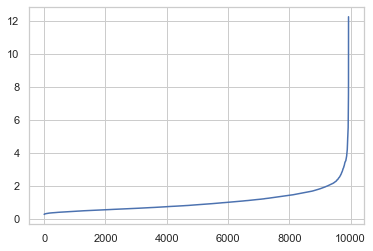

In [724]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=21)
neigh.fit(train_df[used_metric_features])
distances, _ = neigh.kneighbors(train_df[used_metric_features])
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

In [725]:
for i in np.arange(1,6,(5)/10):
    db = DBSCAN(eps=i, min_samples=10).fit(train_df)
    labels = db.labels_

    # Number of clusters in labels, ignoring noise if present.
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise_ = list(labels).count(-1)

    print(i, ", Estimated number of clusters: %d" % n_clusters_,"Estimated number of noise points: %d" % n_noise_)

1.0 , Estimated number of clusters: 21 Estimated number of noise points: 3575
1.5 , Estimated number of clusters: 14 Estimated number of noise points: 984
2.0 , Estimated number of clusters: 10 Estimated number of noise points: 240
2.5 , Estimated number of clusters: 3 Estimated number of noise points: 102
3.0 , Estimated number of clusters: 1 Estimated number of noise points: 42
3.5 , Estimated number of clusters: 1 Estimated number of noise points: 18
4.0 , Estimated number of clusters: 1 Estimated number of noise points: 16
4.5 , Estimated number of clusters: 1 Estimated number of noise points: 7
5.0 , Estimated number of clusters: 1 Estimated number of noise points: 5
5.5 , Estimated number of clusters: 1 Estimated number of noise points: 1


In [726]:
# Creating the clustering model
clustering_model = DBSCAN(eps=2.9, min_samples=10)
# Fit the data (Training) and Predict the same data
labels = clustering_model.fit_predict(train_df)

In [727]:
train_df['clusters']=(labels)
train_df['clusters'].value_counts()

 0    9880
-1      56
Name: clusters, dtype: int64

In [728]:
train_df=train_df[train_df['clusters'] != -1]
train_df=train_df.drop(['clusters'], axis=1)

In [729]:
print('In total,', round((1-len(train_df)/len(original_dataframe))*100,3), '% of observations were deleted from the dataset.')

In total, 4.04 % of observations were deleted from the dataset.


The 56 most removed outliers were removed as a safeguard, since outliers affect some clustering methods.

## 7.2. Sociodemographic Variables
###  K-Prototypes
<a name="7.2."></a>

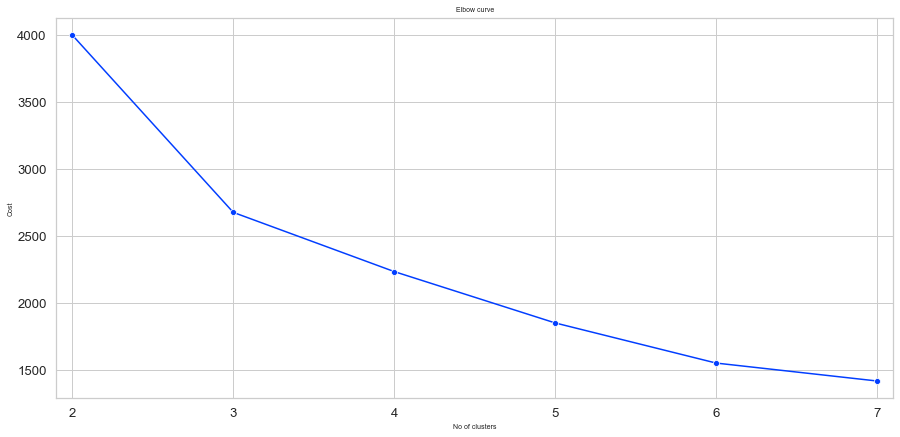

In [730]:
# Function for plotting elbow curve
def plot_elbow_curve(start, end, data, num_cat):
    no_of_clusters = list(range(start, end+1))
    cost_values = []
    
    for k in no_of_clusters:
        test_model = KPrototypes(n_clusters=k, init='Huang', random_state=42)
        test_model.fit_predict(data, categorical=[num_cat])
        cost_values.append(test_model.cost_)
        
    sns.set_theme(style="whitegrid", palette="bright", font_scale=1.2)
    
    plt.figure(figsize=(15, 7))
    ax = sns.lineplot(x=no_of_clusters, y=cost_values, marker="o", dashes=False)
    ax.set_title('Elbow curve', fontsize=7)
    ax.set_xlabel('No of clusters', fontsize=7)
    ax.set_ylabel('Cost', fontsize=7)
    ax.set(xlim=(start-0.1, end+0.1))
    plt.plot();
    
# Plotting elbow curve for k=2 to k=10
plot_elbow_curve(2,7,train_df[sociodemographic],2)

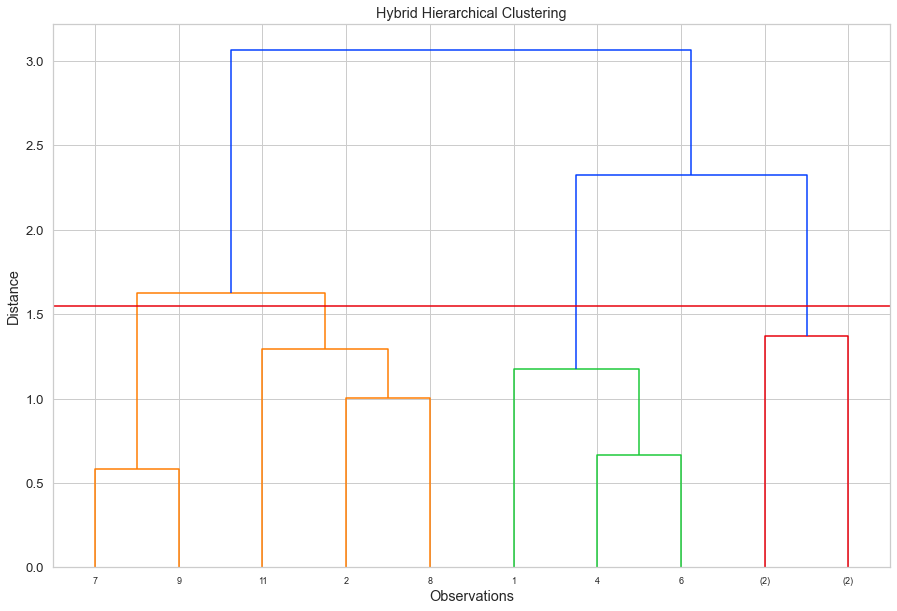

In [731]:
#Starting with 10 clusters
kmeans =KPrototypes(n_clusters=12, n_init= 10, n_jobs=-1).fit(train_df[sociodemographic], categorical=[2])

#centroids = kmeans.labels_
centroids = pd.DataFrame(kmeans.cluster_centroids_, columns = [sociodemographic])

#Checking the Dendrogram
Z = linkage(centroids, method = "ward")

plt.figure(figsize=(15, 10))

plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(Z,
           truncate_mode="lastp",
           p=10,
           show_contracted=True,
           leaf_font_size=9)
plt.axhline(y = 1.55, color = 'r', linestyle = '-')
plt.title("Hybrid Hierarchical Clustering")
plt.show()

In [732]:
# Creating the clustering model
clustering_model =KPrototypes(n_clusters=3, init='Huang', random_state=42, n_jobs=-1)
# Fit the data (Training) and Predict the same data
labels = clustering_model.fit_predict(train_df[sociodemographic], categorical= [2])

kprototypes_social = train_df[sociodemographic].copy()
kprototypes_social['clusters']=(labels)
df_to_merge=train_df[final_metrics].copy()
df_to_merge['clusters_social']=labels

clusters size


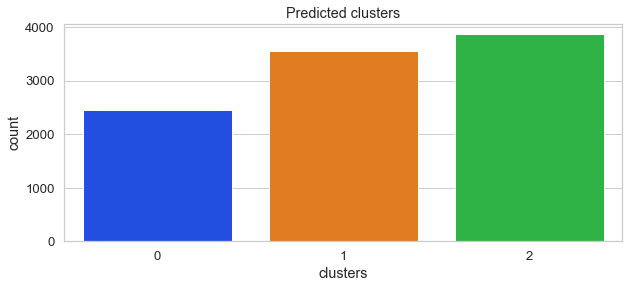

In [733]:
individual_profile_kprototypes(kprototypes_social,labels,train_df[sociodemographic],
        ['Children', 'MonthSal', 'EducDeg'])

Clusters histograms


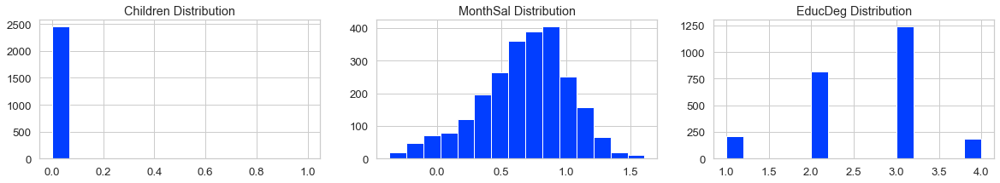

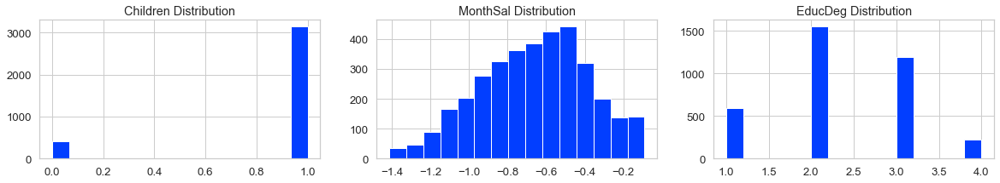

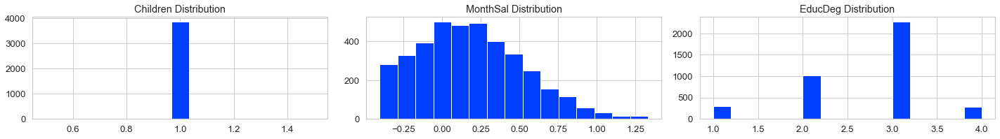

In [734]:
print('Clusters histograms')
for j in range(len(np.unique(kprototypes_social['clusters']))):
    fig, axes = plt.subplots(1, (len(sociodemographic) ), figsize=(20, 3))
    cond=(kprototypes_social.loc[kprototypes_social['clusters']==j])
    for ax, feat in zip(axes.flatten(), sociodemographic):
        ax.set_title(feat+" Distribution")
        cond[feat].hist(bins=15, ax=ax)
            
fig.tight_layout()  
plt.show()

visualization of the mean of the metric features of each cluster


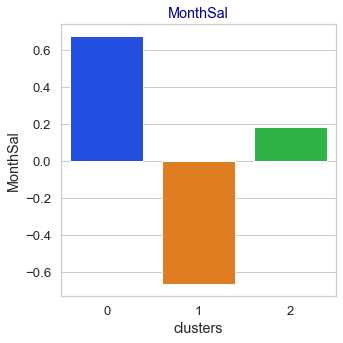

In [735]:
df_concat = kprototypes_social
hc=df_concat.groupby('clusters').mean()
hc['Labels_'] = hc.index
print('visualization of the mean of the metric features of each cluster')
fig=plt.figure(figsize=(5,5))

for i, feature in enumerate(['MonthSal']):
    ax=fig.add_subplot(1,len(['MonthSal']),i+1)
    sns.barplot(hc.index,hc[feature])
    plt.title(feature,fontdict={'color':'darkblue'})
plt.tight_layout()
plt.show()

In [736]:
df_to_merge["clusters_social"] = df_to_merge["clusters_social"].map({0:'0_high_sal__No_children__higher_educ',
            1:'1_low_sal__Mostly_whith_children__lower_educ', 2:'2_Medium_sal__With_children__high_educ'})

<div class="alert alert-block alert-danger">
    
# <b> 7.3. Value Variables </b> 
    
</div>


### 7.3.1. Kmeans Clustering
<a name="7.3.1."></a>

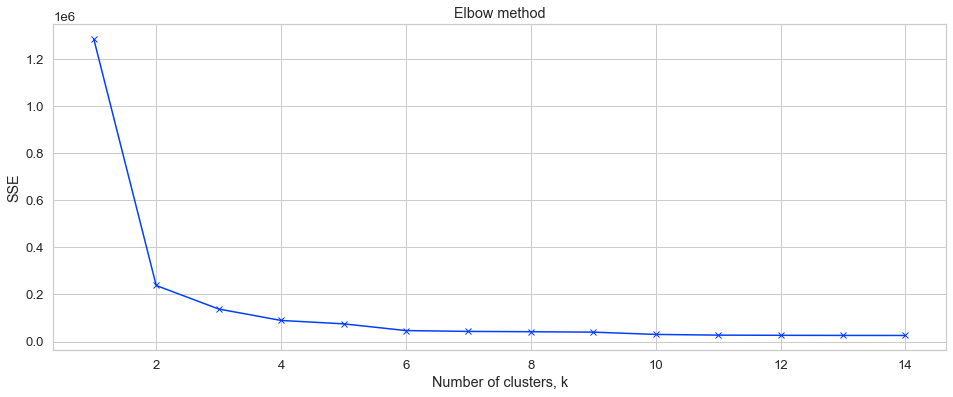

In [737]:
kmeans_kwargs = {"init": "random", "n_init": 10,"max_iter": 100, "random_state": 42,}

# A list holds the SSE values for each k
sse = []
for k in range(1, 15):
   kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
   kmeans.fit(train_df[value])
   sse.append(kmeans.inertia_)

# Plot inertias
plt.figure(figsize=(16,6))
plt.plot(range(1,15), sse, 'bx-')
plt.xlabel('Number of clusters, k')
plt.ylabel('SSE')
plt.title('Elbow method')
plt.show()

For n_clusters = 2, the average silhouette_score is : 0.8948977101842506
For n_clusters = 3, the average silhouette_score is : 0.8416858591662084
For n_clusters = 4, the average silhouette_score is : 0.7901242482725571
For n_clusters = 5, the average silhouette_score is : 0.7210624113633124
For n_clusters = 6, the average silhouette_score is : 0.5835032233235468
For n_clusters = 7, the average silhouette_score is : 0.5977566637919809
For n_clusters = 8, the average silhouette_score is : 0.599654893593316
For n_clusters = 9, the average silhouette_score is : 0.600089336162825
For n_clusters = 10, the average silhouette_score is : 0.4197642163689553


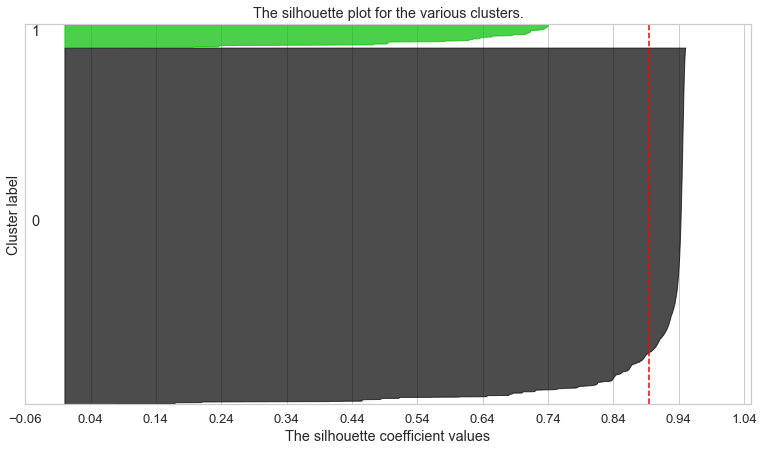

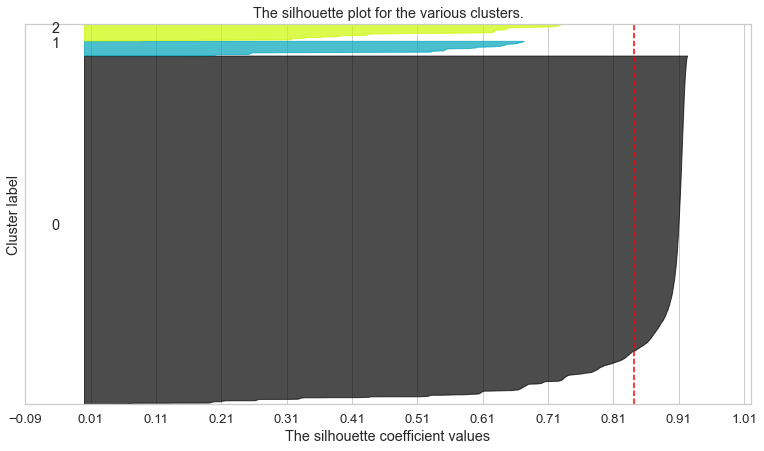

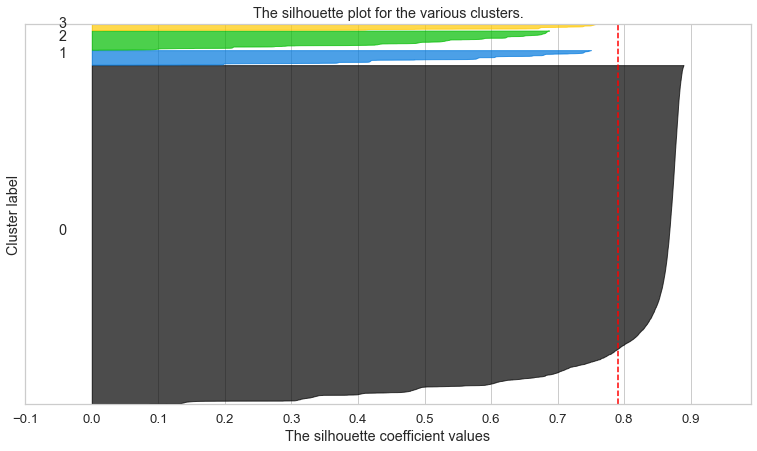

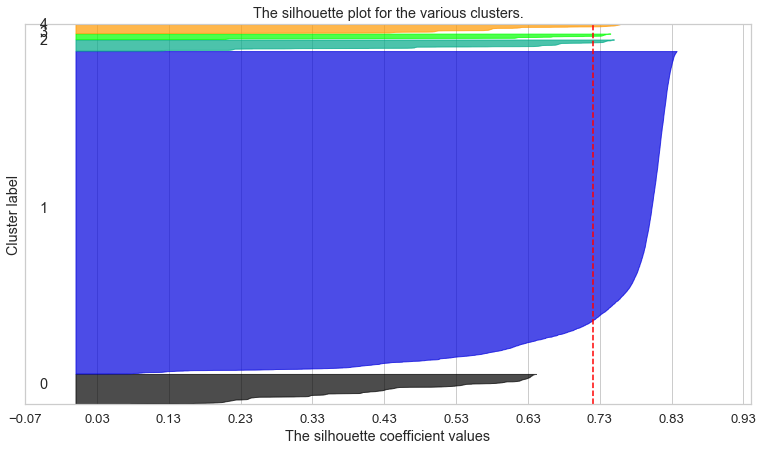

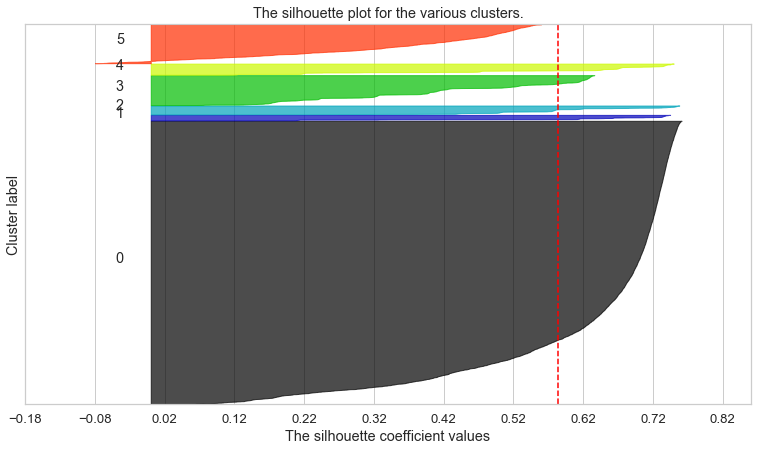

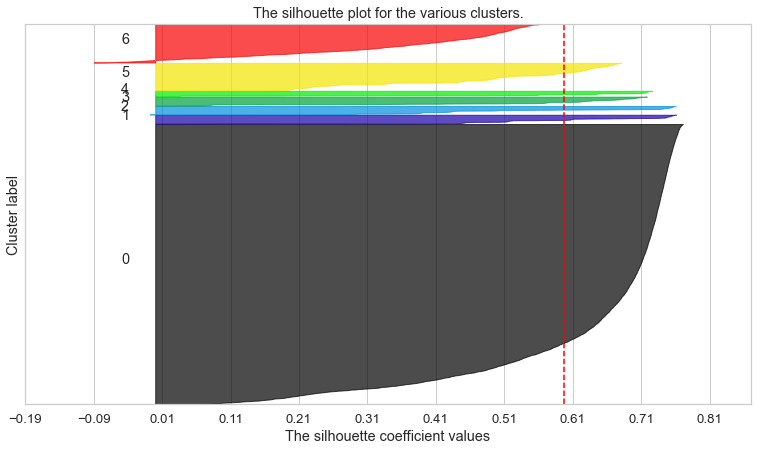

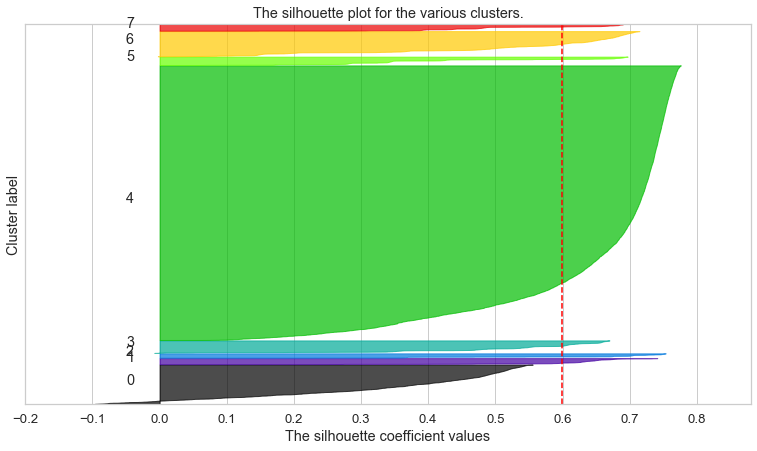

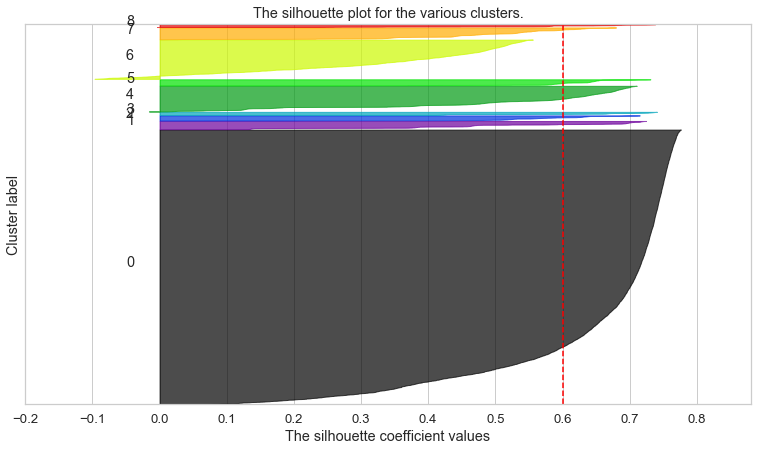

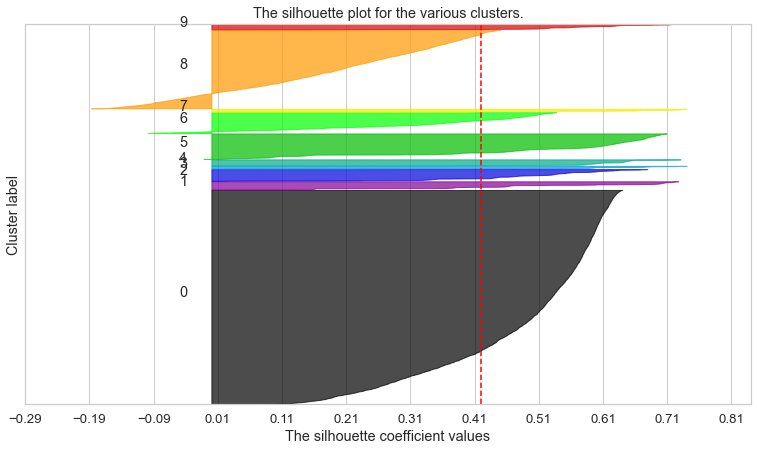

In [738]:
range_clusters = range(2, 11)

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(train_df[value])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(train_df[value], cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(train_df[value], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(train_df[value]) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

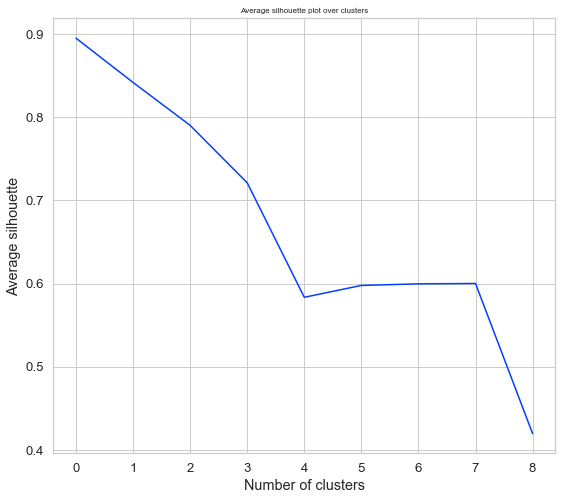

In [739]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,8))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=8)
plt.show()

#### Hybrid Hierarchical k-means Clustering

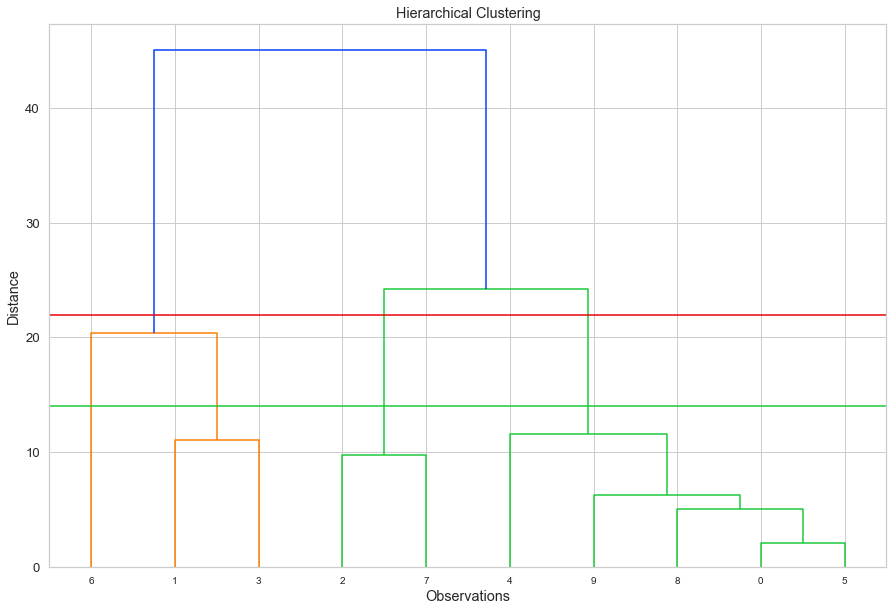

In [740]:
#Starting with 10 clusters
kmeans = KMeans(n_clusters=10, n_init = 10, max_iter = 200).fit(train_df[value])

centroids = kmeans.cluster_centers_

#Checking the Dendrogram
Z = linkage(centroids, method = "average")

plt.figure(figsize=(15, 10))
plt.title("Hierarchical Clustering")
plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(Z,
           truncate_mode="lastp",
           p=10,
           show_contracted=True,
           leaf_font_size=10)
plt.axhline(y = 14, color = 'g', linestyle = '-')
plt.axhline(y = 22, color = 'r', linestyle = '-')
plt.show()

In [741]:
# Creating the clustering model
clustering_model = KMeans(n_clusters=2, n_init = 20, max_iter = 200)
# Fit the data (Training) and Predict the same data
labels = clustering_model.fit_predict(train_df[value])

kmeans_value = train_df[value].copy()
kmeans_value['clusters']=(labels)

           Visualization of the mean of the metric features of each cluster


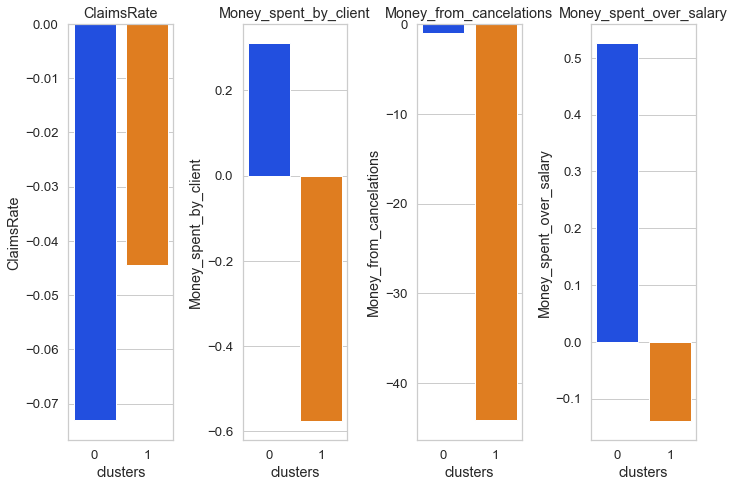

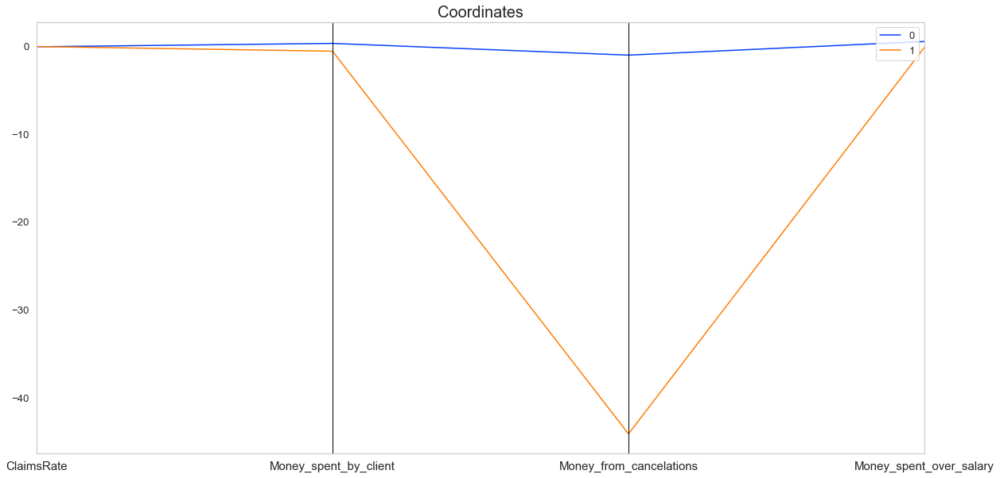


 r2 = 0.8146374559537156 

                                                    Clusters histograms


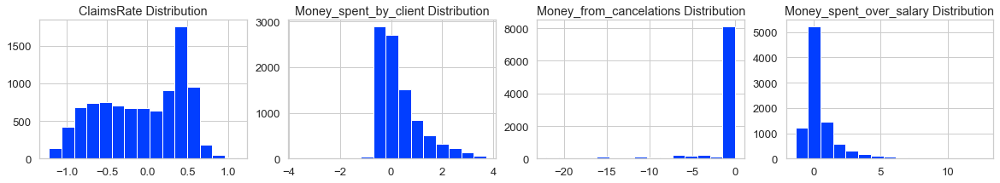

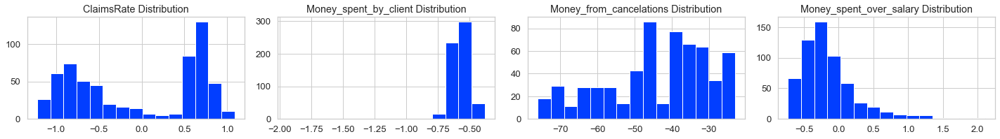

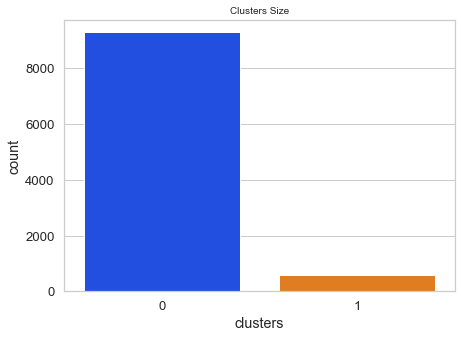

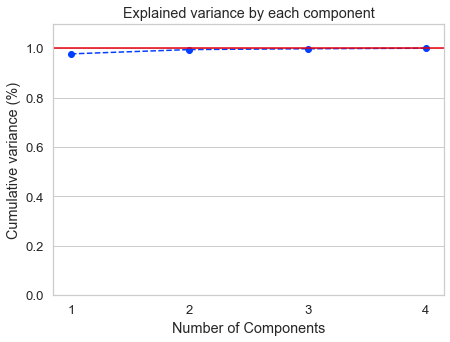

In [742]:
individual_profile(kmeans_value,labels,train_df[value],
                  ['ClaimsRate', 'Money_spent_by_client','Money_from_cancelations', 'Money_spent_over_salary'])

### 7.3.2. K-means on top of SOM
<a name="7.3.2."></a>

In [743]:
som_df = train_df.copy()

In [744]:
sm_value = som(train_df[value],50,50,value)

 Training...
 random_initialization took: 0.000000 seconds
 Rough training...
 radius_ini: 17.000000 , radius_final: 2.833333, trainlen: 100

 epoch: 1 ---> elapsed time:  0.156000, quantization error: 0.611703

 epoch: 2 ---> elapsed time:  0.194000, quantization error: 1.670158

 epoch: 3 ---> elapsed time:  0.202000, quantization error: 1.644539

 epoch: 4 ---> elapsed time:  0.194000, quantization error: 1.638763

 epoch: 5 ---> elapsed time:  0.182000, quantization error: 1.633785

 epoch: 6 ---> elapsed time:  0.187000, quantization error: 1.631663

 epoch: 7 ---> elapsed time:  0.190000, quantization error: 1.630620

 epoch: 8 ---> elapsed time:  0.199000, quantization error: 1.629692

 epoch: 9 ---> elapsed time:  0.209000, quantization error: 1.628787

 epoch: 10 ---> elapsed time:  0.195000, quantization error: 1.627938

 epoch: 11 ---> elapsed time:  0.206000, quantization error: 1.627083

 epoch: 12 ---> elapsed time:  0.209000, quantization error: 1.626204

 epoch: 13 --->

 epoch: 14 ---> elapsed time:  0.193000, quantization error: 0.970120

 epoch: 15 ---> elapsed time:  0.218000, quantization error: 0.963020

 epoch: 16 ---> elapsed time:  0.200000, quantization error: 0.955923

 epoch: 17 ---> elapsed time:  0.201000, quantization error: 0.948744

 epoch: 18 ---> elapsed time:  0.193000, quantization error: 0.941524

 epoch: 19 ---> elapsed time:  0.218000, quantization error: 0.934211

 epoch: 20 ---> elapsed time:  0.207000, quantization error: 0.926779

 epoch: 21 ---> elapsed time:  0.211000, quantization error: 0.919117

 epoch: 22 ---> elapsed time:  0.204000, quantization error: 0.911288

 epoch: 23 ---> elapsed time:  0.209000, quantization error: 0.903673

 epoch: 24 ---> elapsed time:  0.208000, quantization error: 0.896107

 epoch: 25 ---> elapsed time:  0.193000, quantization error: 0.888464

 epoch: 26 ---> elapsed time:  0.201000, quantization error: 0.880836

 epoch: 27 ---> elapsed time:  0.194000, quantization error: 0.873156

 epoch

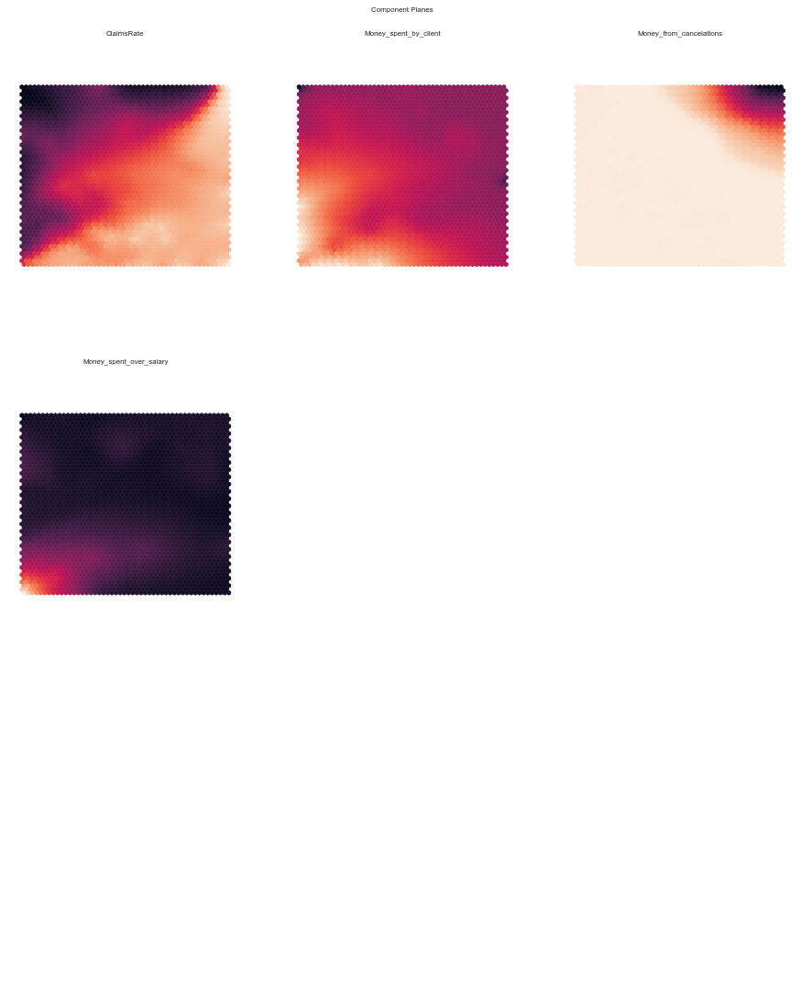

In [745]:
plot_component_planes(weights=sm_value.codebook.matrix,features=value,
                      M=50,N=50,
                      figsize=(12,15),figlayout=(3,3),
                      title="Component Planes",
                      cmap=sns.color_palette("rocket", as_cmap=True))

### U-matrix

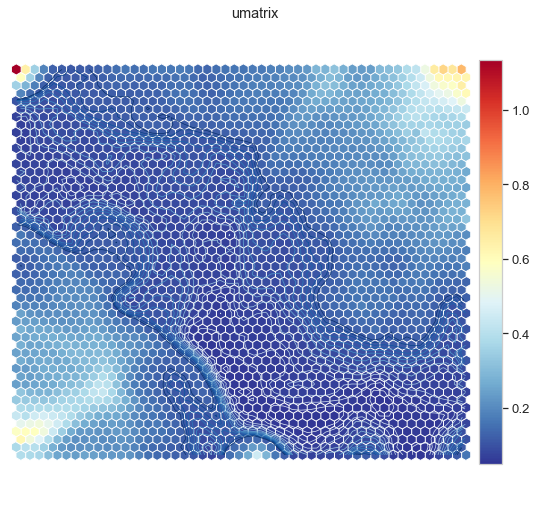

In [746]:
# U-matrix of the 50x50 grid
u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    sm_value, 
    distance=2, 
    row_normalized=False, 
    show_data=False, 
    contour=True # Visualize isomorphic curves
)

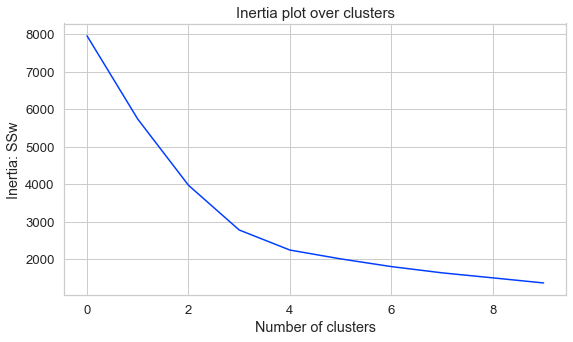

In [747]:
elbow_method(sm_value)

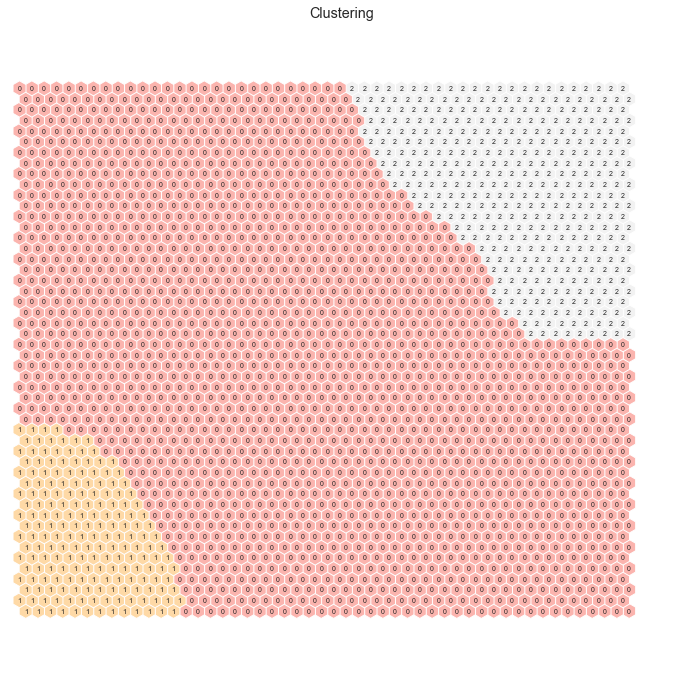

In [748]:
nodeclus_labels_valuek = kmeans_som_map(sm_value,n_clusters=3)

In [749]:
nodes ,som_bmu, final_table, final_clusters = tables(sm_value,nodeclus_labels_valuek,value)

In [750]:
# Check the nodes and and respective clusters
nodes

,ClaimsRate,Money_spent_by_client,Money_from_cancelations,Money_spent_over_salary,label
0,0.010898,1.983873,0.322939,6.709319,2
1,-0.098709,1.668680,0.322912,6.014450,2
2,-0.409978,1.944650,0.322847,5.210336,2
3,-0.815772,2.363524,0.322753,4.450284,2
4,-1.025716,2.707289,0.322594,3.882693,2
...,...,...,...,...,...
2495,1.432157,-0.952499,-3.921315,-0.441909,1
2496,1.436858,-0.948361,-4.264074,-0.456611,1
2497,1.444165,-0.947837,-4.705512,-0.454102,1
2498,1.465276,-0.946652,-5.184478,-0.471417,1


In [751]:
# Obtaining SOM's BMUs labels
som_bmu

,PremHealth,PremHousehold,PremLife,PremMotor,PremWork,ClaimsRate,Money_spent_by_client,Money_from_cancelations,Money_spent_over_salary,Children,MonthSal,EducDeg,BMU
CustID,,,,,,,,,,,,,
1,-0.154737,-0.213423,0.486774,0.341932,-0.187621,-0.559322,-0.155187,0.0,0.143087,1.0,-0.225161,2.0,284.0
2,-0.431975,1.239965,3.684302,-1.084748,1.793838,0.677966,1.133137,0.0,5.276015,1.0,-1.192903,2.0,101.0
3,-0.358251,0.412603,1.339766,-0.469448,1.63597,-0.745763,0.238765,0.0,0.239486,0.0,-0.160645,1.0,282.0
4,1.385255,-0.369227,0.233738,-0.58262,0.066611,0.457627,-0.4958,0.0,1.331945,1.0,-0.920645,3.0,861.0
5,0.183797,-0.350022,-0.125325,0.163925,0.357702,0.305085,-0.345863,0.0,0.395774,1.0,-0.492258,3.0,1215.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10291,-0.558681,3.235218,1.91804,-1.422161,3.906078,0.220339,3.190256,0.0,8.906899,1.0,-1.225806,1.0,0.0
10292,0.101757,-0.3429,-0.320468,0.427468,-0.234471,0.40678,-0.281184,0.0,-0.372651,0.0,0.427097,4.0,1834.0
10294,-0.193141,0.016832,-0.257806,0.474755,-0.454066,-0.864407,0.00588,0.0,-0.188237,1.0,0.252903,3.0,384.0


In [752]:
# Get cluster labels for each observation
final_table

,PremHealth,PremHousehold,PremLife,PremMotor,PremWork,ClaimsRate,Money_spent_by_client,Money_from_cancelations,Money_spent_over_salary,Children,MonthSal,EducDeg,clusters
CustID,,,,,,,,,,,,,
1,-0.154737,-0.213423,0.486774,0.341932,-0.187621,-0.559322,-0.155187,0.0,0.143087,1.0,-0.225161,2.0,0
2,-0.431975,1.239965,3.684302,-1.084748,1.793838,0.677966,1.133137,0.0,5.276015,1.0,-1.192903,2.0,2
3,-0.358251,0.412603,1.339766,-0.469448,1.63597,-0.745763,0.238765,0.0,0.239486,0.0,-0.160645,1.0,0
4,1.385255,-0.369227,0.233738,-0.58262,0.066611,0.457627,-0.4958,0.0,1.331945,1.0,-0.920645,3.0,2
5,0.183797,-0.350022,-0.125325,0.163925,0.357702,0.305085,-0.345863,0.0,0.395774,1.0,-0.492258,3.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10291,-0.558681,3.235218,1.91804,-1.422161,3.906078,0.220339,3.190256,0.0,8.906899,1.0,-1.225806,1.0,2
10292,0.101757,-0.3429,-0.320468,0.427468,-0.234471,0.40678,-0.281184,0.0,-0.372651,0.0,0.427097,4.0,0
10294,-0.193141,0.016832,-0.257806,0.474755,-0.454066,-0.864407,0.00588,0.0,-0.188237,1.0,0.252903,3.0,0


In [753]:
# Characterizing the final clusters
final_clusters

,PremHealth,PremHousehold,PremLife,PremMotor,PremWork,ClaimsRate,Money_spent_by_client,Money_from_cancelations,Money_spent_over_salary,Children,MonthSal,EducDeg
clusters,,,,,,,,,,,,
0,0.073805,0.034135,0.196023,0.080626,0.194968,-0.054665,0.007707,-0.041004,-0.054457,0.660646,0.211718,2.575894
1,-0.342981,-0.416740,-0.212496,0.558951,-0.319202,-0.073704,-0.363536,-20.354900,-0.050773,0.816315,0.045943,2.850542
2,0.217256,1.368705,1.017876,-0.638516,1.063723,-0.110273,1.326332,-0.018789,2.196385,0.751372,-0.546893,2.067117


For n_clusters = 3, the average silhouette_score is : 0.4459941716097827


<Figure size 936x504 with 0 Axes>

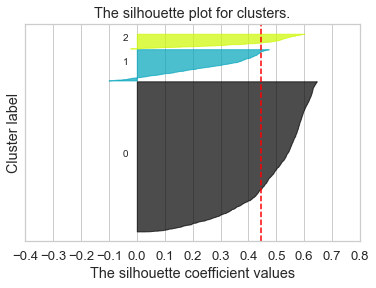

In [755]:
# Silhouette plot
silhouette_kmeans(sm_value.codebook.matrix, n_clusters = 3)

           Visualization of the mean of the metric features of each cluster


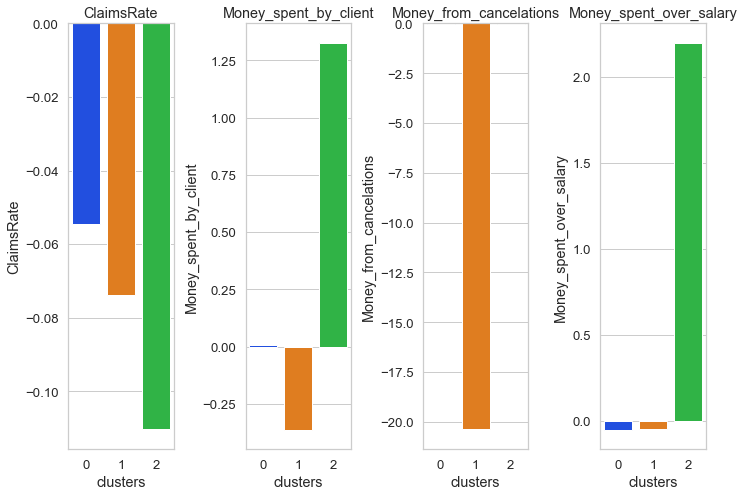

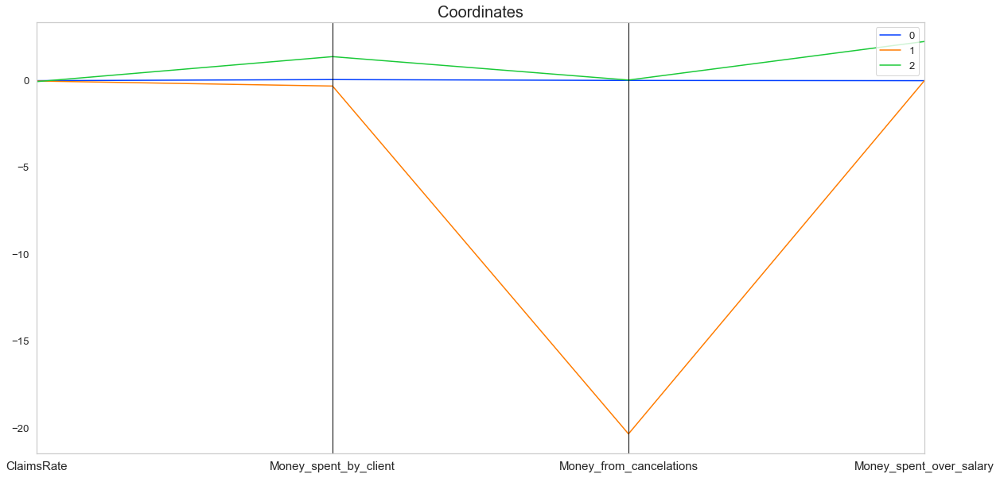


 r2 = 0.47320622441767624 

                                                    Clusters histograms


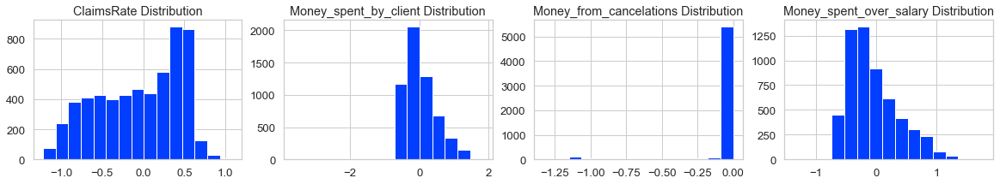

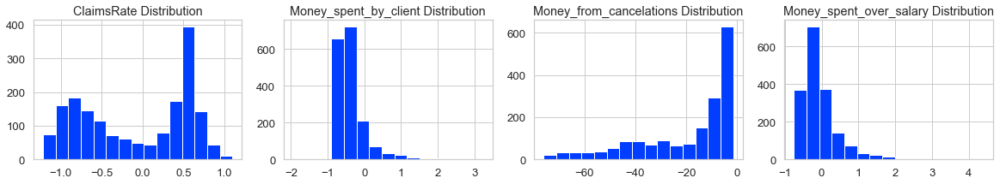

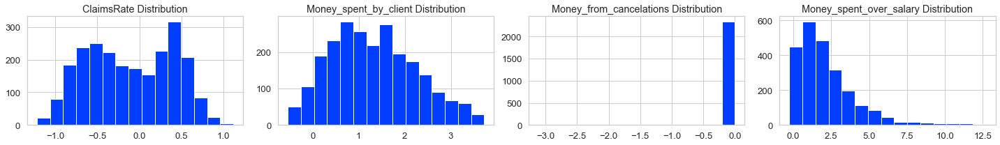

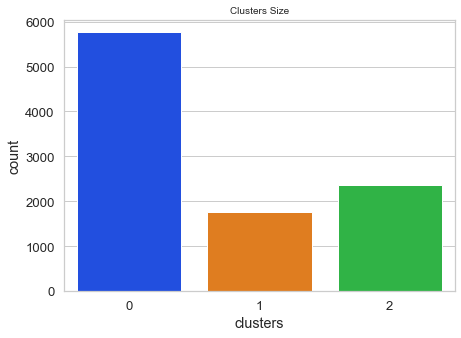

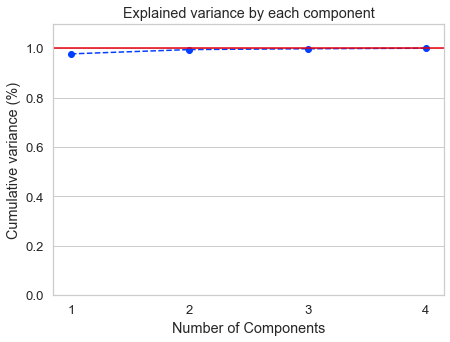

In [756]:
individual_profile(final_table[['ClaimsRate', 'Money_spent_by_client','Money_from_cancelations', 'Money_spent_over_salary','clusters']],
                   final_table['clusters'],final_table[value],
                  ['ClaimsRate', 'Money_spent_by_client','Money_from_cancelations', 'Money_spent_over_salary'])

#### The K-means on top of SOM was chosen over K-means as 3 clusters are more useful to the analysis than 2, and it also has more differentiated clusters.

In [757]:
df_to_merge['clusters_value']=final_table['clusters']

df_to_merge["clusters_value"] = df_to_merge["clusters_value"].map({0:'Medium_value',
            1:'Low_value',
            2:'High_value'})

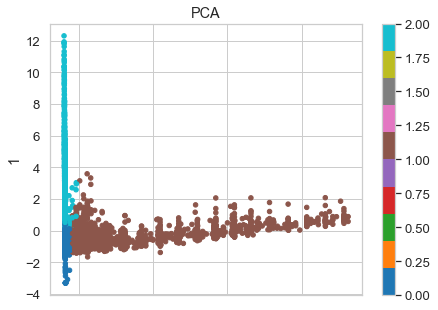

In [758]:
two_dim = PCA(random_state=42).fit_transform(final_table[['ClaimsRate', 'Money_spent_by_client','Money_from_cancelations', 'Money_spent_over_salary']])
# t-SNE visualization
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=final_table['clusters'], colormap='tab10', figsize=(7,5))
plt.title('PCA')
plt.show()

<Figure size 504x360 with 0 Axes>

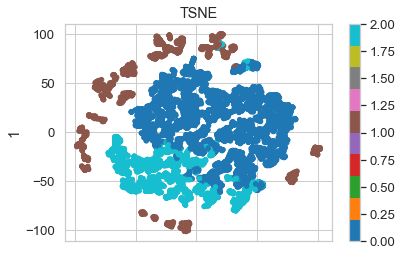

In [759]:
two_dim = TSNE(perplexity=25.0).fit_transform(final_table[['ClaimsRate', 'Money_spent_by_client','Money_from_cancelations', 'Money_spent_over_salary']])
# t-SNE visualization
plt.figure(figsize=(7, 5))
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=final_table['clusters'], colormap='tab10')
plt.title('TSNE')
plt.show() 

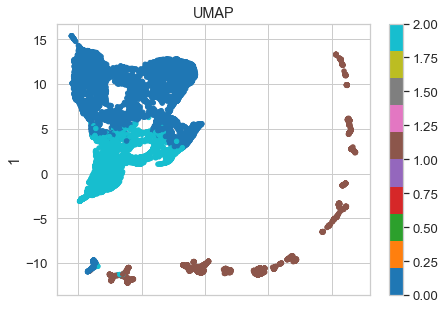

In [760]:
# UMAP
um = umap.UMAP(n_components=2,min_dist=0.05, n_neighbors=21)
components_umap = um.fit_transform(final_table[['ClaimsRate', 'Money_spent_by_client','Money_from_cancelations', 'Money_spent_over_salary']])
pd.DataFrame(components_umap).plot.scatter(x=0, y=1, c=final_table['clusters'], colormap='tab10', figsize=(7,5))
plt.title('UMAP')
plt.show()

<div class="alert alert-block alert-danger">
    
# <b> 7.4. Product variables </b> 
    
</div>
<a name="7.4."></a>

### 7.4.1 Kmeans Clustering
<a name="7.4.1."></a>

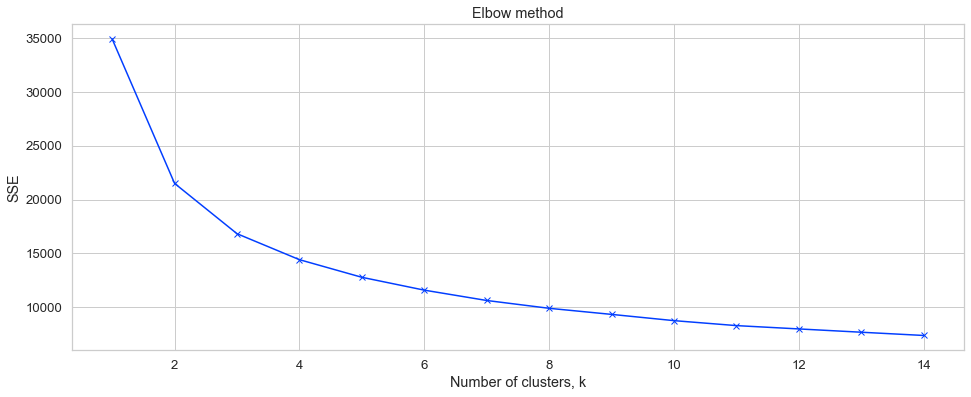

In [761]:
kmeans_kwargs = {"init": "random", "n_init": 10,"max_iter": 100, "random_state": 42,}

# A list holds the SSE values for each k
sse = []
for k in range(1, 15):
   kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
   kmeans.fit(train_df[product])
   sse.append(kmeans.inertia_)

# Plot inertias
plt.figure(figsize=(16,6))
plt.plot(range(1,15), sse, 'bx-')
plt.xlabel('Number of clusters, k')
plt.ylabel('SSE')
plt.title('Elbow method')
plt.show()

For n_clusters = 2, the average silhouette_score is : 0.40987238497859957
For n_clusters = 3, the average silhouette_score is : 0.3098600476206717
For n_clusters = 4, the average silhouette_score is : 0.3078055110309075
For n_clusters = 5, the average silhouette_score is : 0.2974905996973329
For n_clusters = 6, the average silhouette_score is : 0.27888450219007244
For n_clusters = 7, the average silhouette_score is : 0.24142621321529742
For n_clusters = 8, the average silhouette_score is : 0.2409559024791326
For n_clusters = 9, the average silhouette_score is : 0.24521107852249605
For n_clusters = 10, the average silhouette_score is : 0.24356041116875546


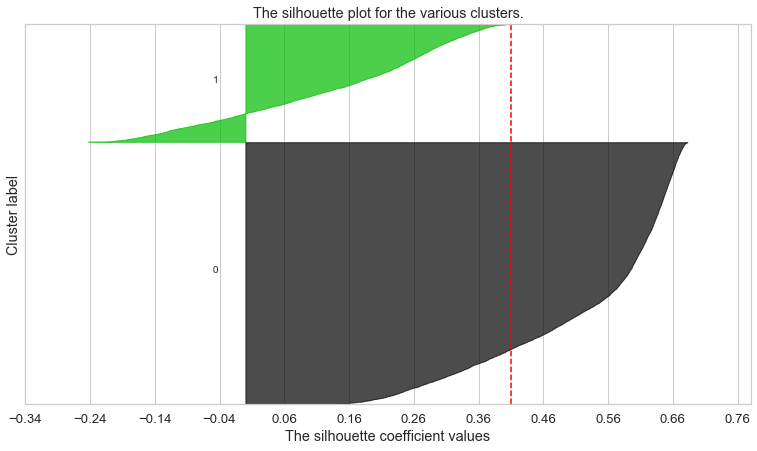

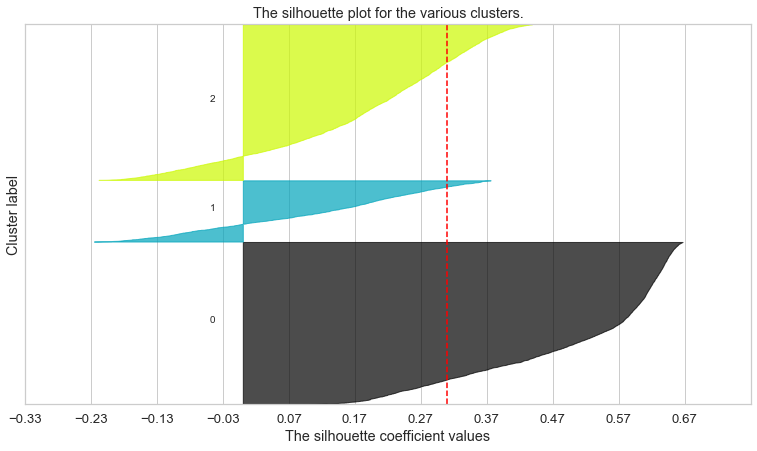

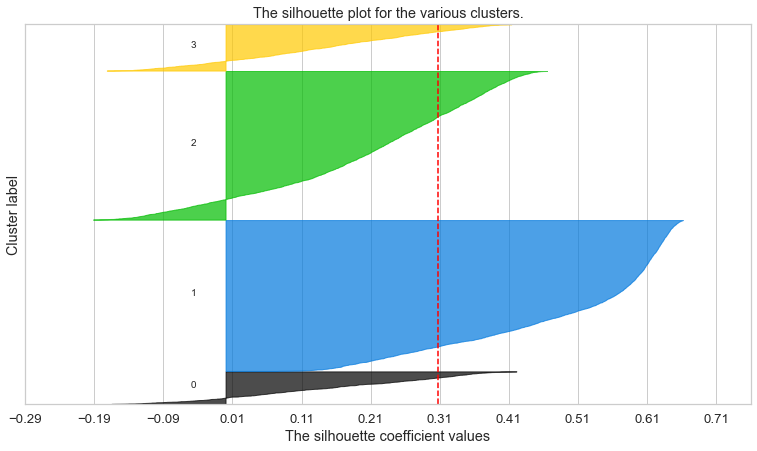

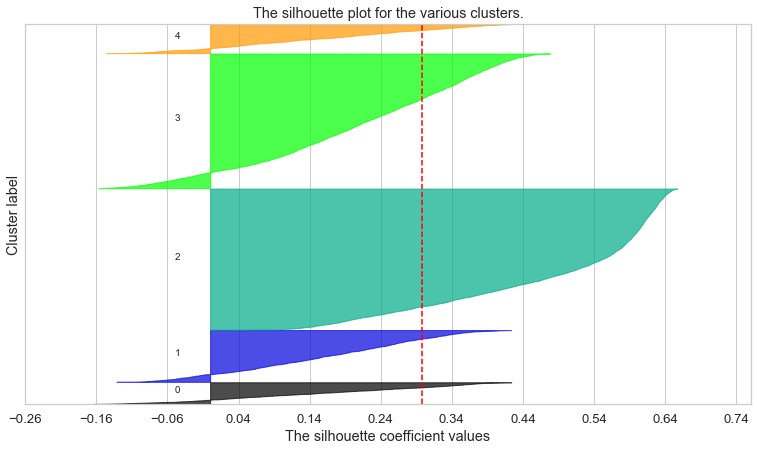

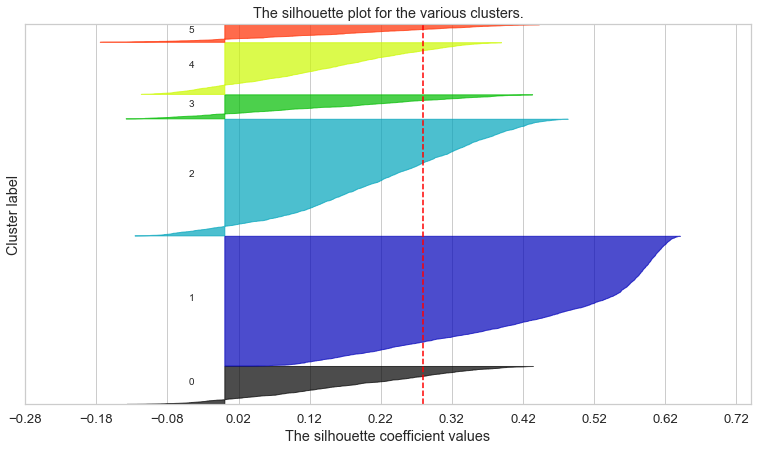

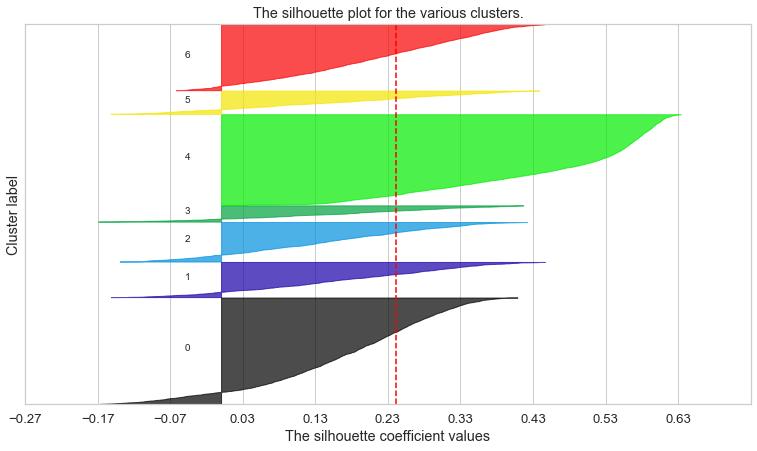

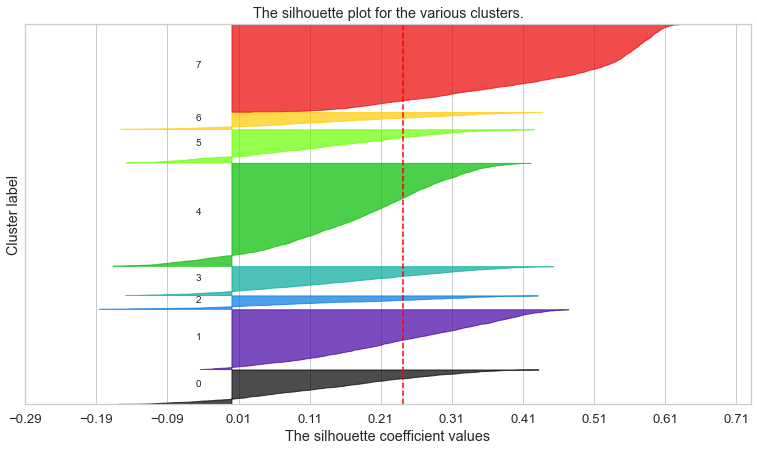

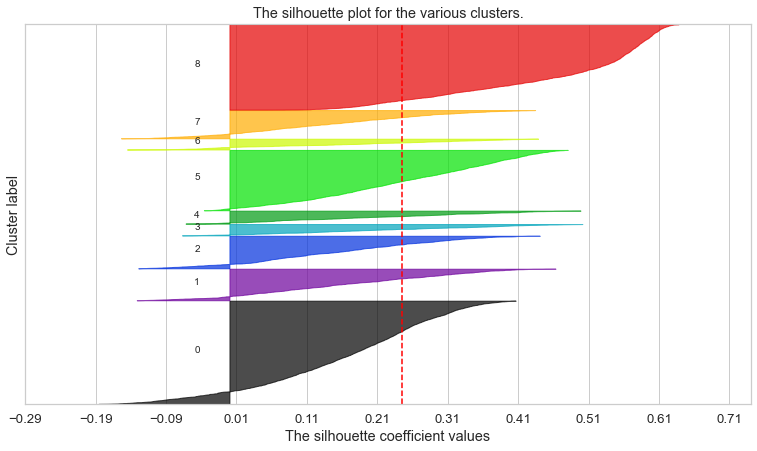

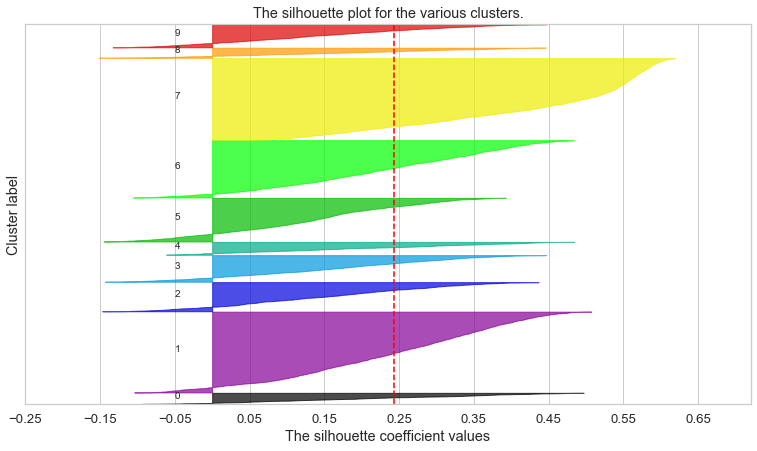

In [762]:
range_clusters = range(2, 11)

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(train_df[product])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(train_df[product], cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(train_df[product], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(train_df[product]) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

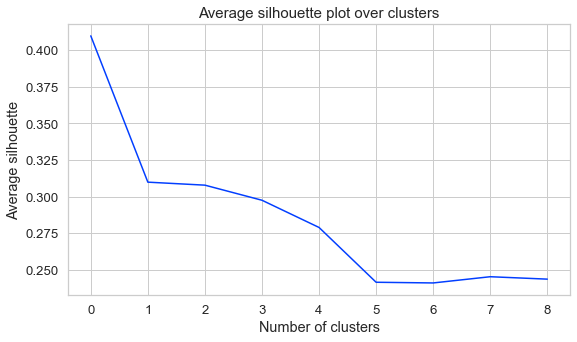

In [763]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

#### Hybrid Hierarchical k-means Clustering

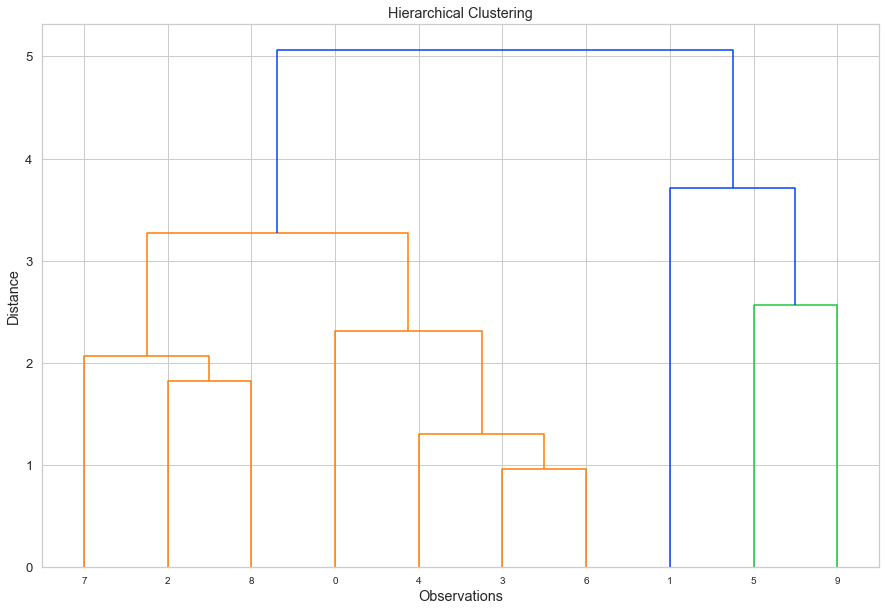

In [764]:
#Starting with 10 clusters
kmeans = KMeans(n_clusters=10, n_init = 10, max_iter = 200).fit(train_df[product])

centroids = kmeans.cluster_centers_

#Checking the Dendrogram
Z = linkage(centroids, method = "complete")

plt.figure(figsize=(15, 10))
plt.title("Hierarchical Clustering")
plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(Z,
           truncate_mode="lastp",
           p=10,
           show_contracted=True,
           leaf_font_size=10)
plt.axhline(y = 14, color = 'g', linestyle = '-')
plt.axhline(y = 22, color = 'r', linestyle = '-')
plt.show()

In [765]:
# Creating the clustering model
clustering_model = KMeans(n_clusters=4, n_init = 20, max_iter = 200)
# Fit the data (Training) and Predict the same data
labels = clustering_model.fit_predict(train_df[product])

kmeans_product = train_df[product].copy()
kmeans_product['clusters']=(labels)

           Visualization of the mean of the metric features of each cluster


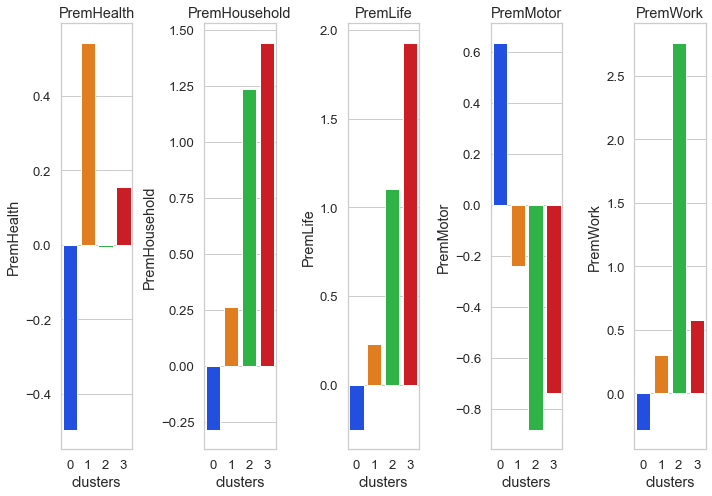

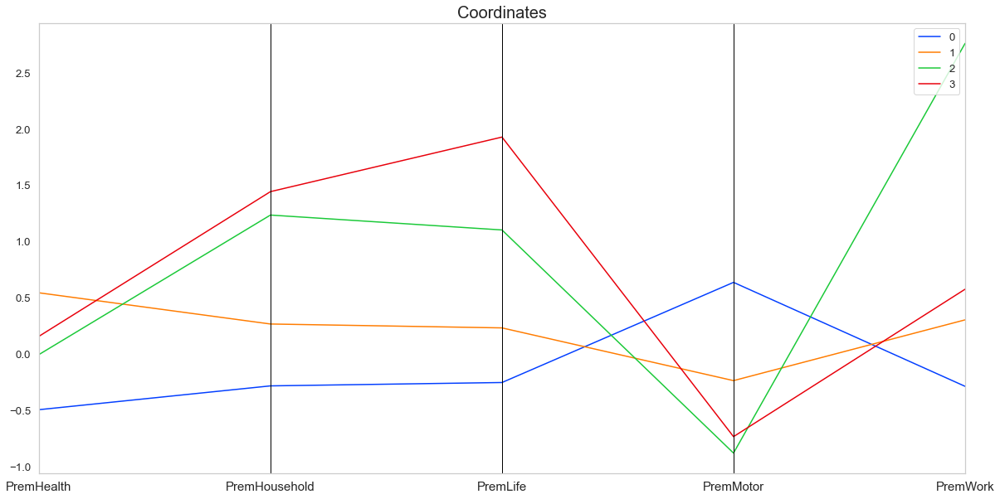


 r2 = 0.5874564141541914 

                                                    Clusters histograms


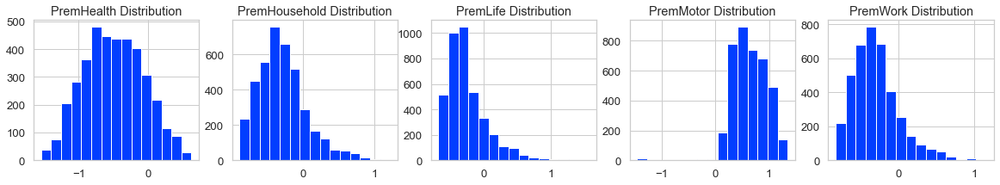

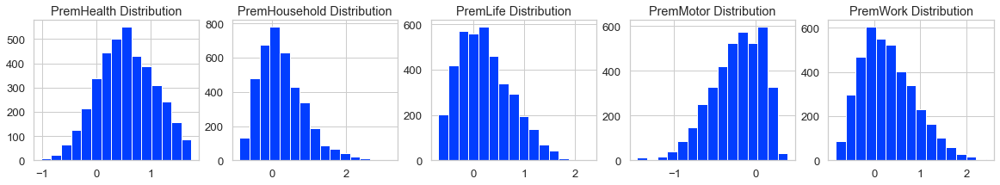

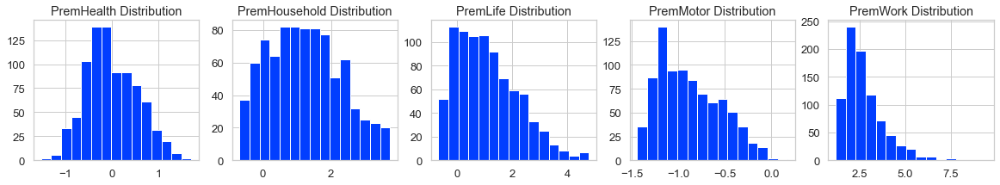

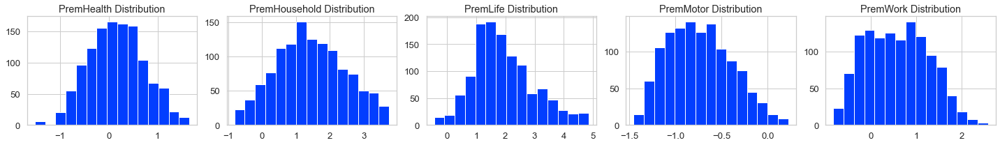

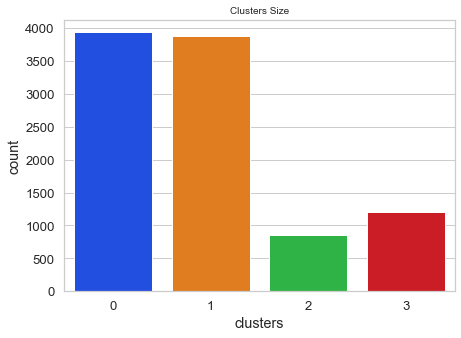

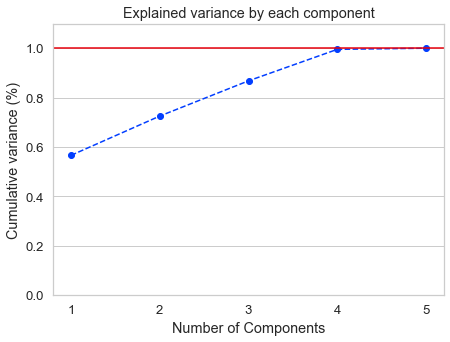

In [766]:
individual_profile(kmeans_product,labels,train_df[product],
                  ['PremHealth', 'PremHousehold', 'PremLife', 'PremMotor', 'PremWork'])

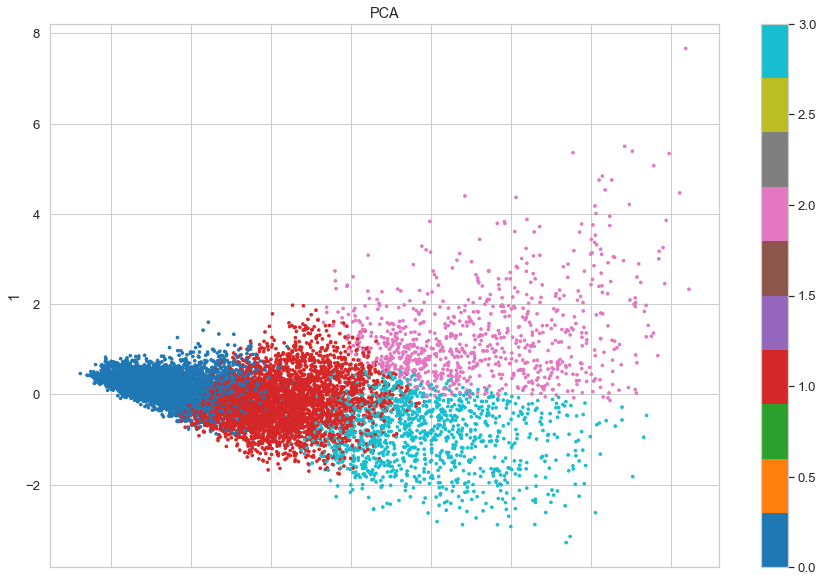

In [767]:
two_dim = PCA(random_state=42).fit_transform(train_df[product])
# t-SNE visualization
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=kmeans_product['clusters'], colormap='tab10', s=7, figsize=(15,10))
plt.title('PCA')
plt.show()

<Figure size 1080x504 with 0 Axes>

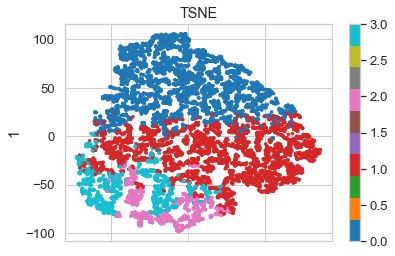

In [768]:
two_dim = TSNE(perplexity=25.0).fit_transform(train_df[product])
# t-SNE visualization
plt.figure(figsize=(15, 7))
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=kmeans_product['clusters'], colormap='tab10', s=7)
plt.title('TSNE')
plt.show() 

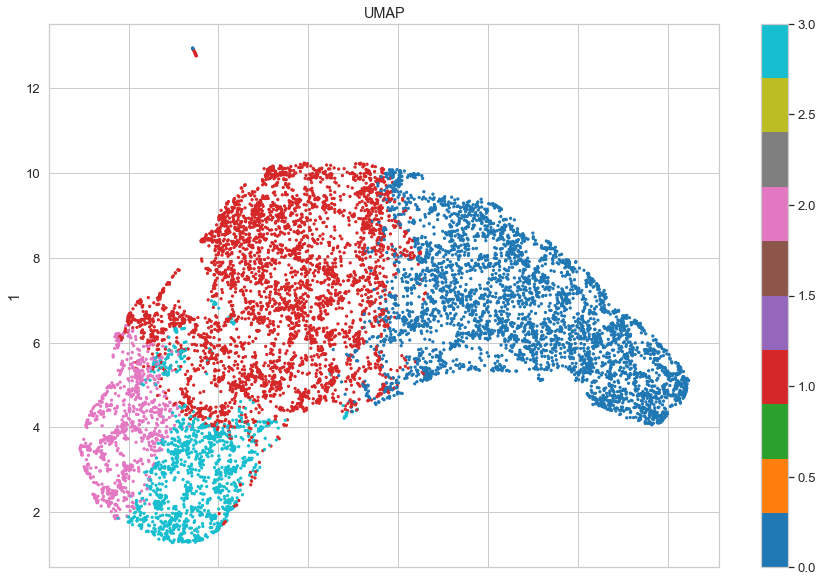

In [769]:
# UMAP
um = umap.UMAP(n_components=2,min_dist=0.05, n_neighbors=21)
components_umap = um.fit_transform(train_df[product])
pd.DataFrame(components_umap).plot.scatter(x=0, y=1, colormap='tab10', c=kmeans_product['clusters'], s=5, figsize=(15,10))
plt.title('UMAP')
plt.show()

### 7.4.2. K-Means on top of SOM units
<a name="7.4.2."></a> 

In [770]:
sm_product = som(train_df[product],50,50,product)

 Training...
 random_initialization took: 0.001000 seconds
 Rough training...
 radius_ini: 17.000000 , radius_final: 2.833333, trainlen: 100

 epoch: 1 ---> elapsed time:  0.258000, quantization error: 0.872621

 epoch: 2 ---> elapsed time:  0.336000, quantization error: 1.985713

 epoch: 3 ---> elapsed time:  0.297000, quantization error: 1.937833

 epoch: 4 ---> elapsed time:  0.266000, quantization error: 1.935012

 epoch: 5 ---> elapsed time:  0.197000, quantization error: 1.932504

 epoch: 6 ---> elapsed time:  0.191000, quantization error: 1.930945

 epoch: 7 ---> elapsed time:  0.205000, quantization error: 1.929277

 epoch: 8 ---> elapsed time:  0.194000, quantization error: 1.927435

 epoch: 9 ---> elapsed time:  0.211000, quantization error: 1.925555

 epoch: 10 ---> elapsed time:  0.201000, quantization error: 1.924123

 epoch: 11 ---> elapsed time:  0.194000, quantization error: 1.922617

 epoch: 12 ---> elapsed time:  0.207000, quantization error: 1.920973

 epoch: 13 --->

 epoch: 14 ---> elapsed time:  0.199000, quantization error: 1.128470

 epoch: 15 ---> elapsed time:  0.219000, quantization error: 1.122010

 epoch: 16 ---> elapsed time:  0.210000, quantization error: 1.115666

 epoch: 17 ---> elapsed time:  0.196000, quantization error: 1.109456

 epoch: 18 ---> elapsed time:  0.209000, quantization error: 1.103392

 epoch: 19 ---> elapsed time:  0.208000, quantization error: 1.097350

 epoch: 20 ---> elapsed time:  0.209000, quantization error: 1.091269

 epoch: 21 ---> elapsed time:  0.193000, quantization error: 1.085317

 epoch: 22 ---> elapsed time:  0.209000, quantization error: 1.079258

 epoch: 23 ---> elapsed time:  0.200000, quantization error: 1.073242

 epoch: 24 ---> elapsed time:  0.201000, quantization error: 1.067119

 epoch: 25 ---> elapsed time:  0.193000, quantization error: 1.060955

 epoch: 26 ---> elapsed time:  0.212000, quantization error: 1.054700

 epoch: 27 ---> elapsed time:  0.205000, quantization error: 1.048277

 epoch

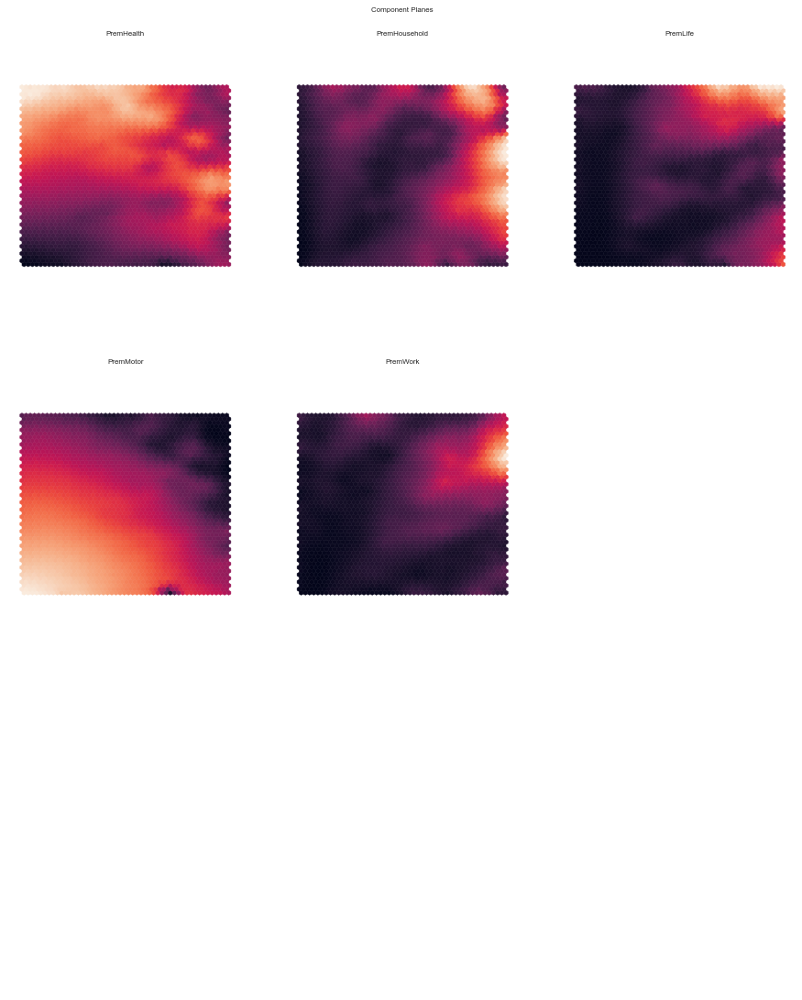

In [771]:
plot_component_planes(weights=sm_product.codebook.matrix,features=product,
                      M=50,N=50,
                      figsize=(12,15),figlayout=(3,3),
                      title="Component Planes",
                      cmap=sns.color_palette("rocket", as_cmap=True))

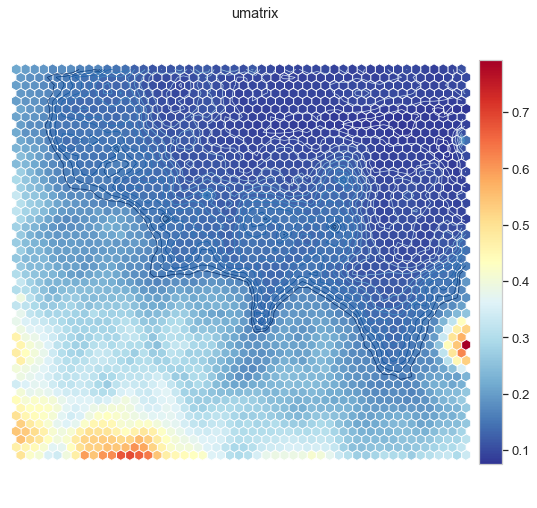

In [772]:
# U-matrix of the 50x50 grid
u_prod = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT_prod = u_prod.show(
    sm_product, 
    distance=2, 
    row_normalized=False, 
    show_data=False, 
    contour=True # Visualize isomorphic curves
)

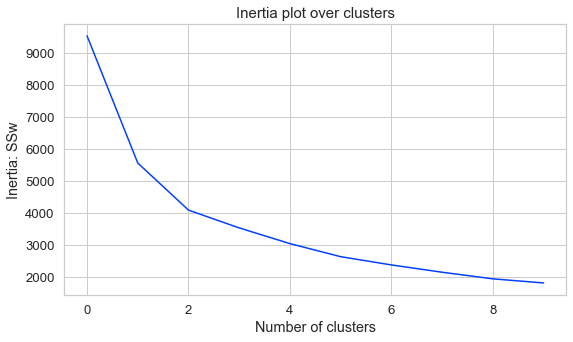

In [773]:
elbow_method(sm_product)

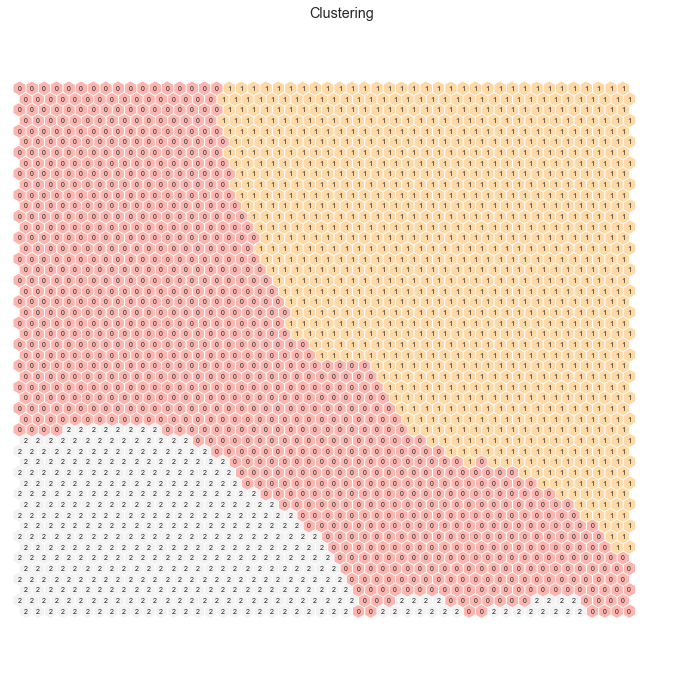

In [774]:
nodeclus_labels_prodk = kmeans_som_map(sm_product,n_clusters=3)

In [775]:
nodes ,som_bmu, final_table, final_clusters = tables(sm_product,nodeclus_labels_prodk,product)

In [776]:
# Check the nodes and and respective clusters
nodes

,PremHealth,PremHousehold,PremLife,PremMotor,PremWork,label
0,-1.890601,-1.051360,-0.863103,1.835264,-0.868714,1
1,-1.801425,-1.063725,-0.854003,1.785230,-0.844858,1
2,-1.726713,-1.091293,-0.836160,1.736250,-0.801540,1
3,-1.645785,-1.090847,-0.827273,1.690561,-0.784454,1
4,-1.555651,-1.103660,-0.819291,1.641961,-0.792566,1
...,...,...,...,...,...,...
2495,-0.598213,1.025400,2.729426,-1.675645,2.525920,2
2496,-0.385922,0.936456,2.855702,-1.705946,2.292060,2
2497,-0.210428,0.671480,2.996447,-1.683785,2.082306,2
2498,-0.168229,0.391355,3.286836,-1.664062,1.919124,2


In [777]:
# Obtaining SOM's BMUs labels
som_bmu

,PremHealth,PremHousehold,PremLife,PremMotor,PremWork,ClaimsRate,Money_spent_by_client,Money_from_cancelations,Money_spent_over_salary,Children,MonthSal,EducDeg,BMU
CustID,,,,,,,,,,,,,
1,-0.154737,-0.213423,0.486774,0.341932,-0.187621,-0.559322,-0.155187,0.0,0.143087,1.0,-0.225161,2.0,2005.0
2,-0.431975,1.239965,3.684302,-1.084748,1.793838,0.677966,1.133137,0.0,5.276015,1.0,-1.192903,2.0,2398.0
3,-0.358251,0.412603,1.339766,-0.469448,1.63597,-0.745763,0.238765,0.0,0.239486,0.0,-0.160645,1.0,1989.0
4,1.385255,-0.369227,0.233738,-0.58262,0.066611,0.457627,-0.4958,0.0,1.331945,1.0,-0.920645,3.0,794.0
5,0.183797,-0.350022,-0.125325,0.163925,0.357702,0.305085,-0.345863,0.0,0.395774,1.0,-0.492258,3.0,1374.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10291,-0.558681,3.235218,1.91804,-1.422161,3.906078,0.220339,3.190256,0.0,8.906899,1.0,-1.225806,1.0,2485.0
10292,0.101757,-0.3429,-0.320468,0.427468,-0.234471,0.40678,-0.281184,0.0,-0.372651,0.0,0.427097,4.0,1223.0
10294,-0.193141,0.016832,-0.257806,0.474755,-0.454066,-0.864407,0.00588,0.0,-0.188237,1.0,0.252903,3.0,1658.0


In [778]:
# Get cluster labels for each observation
final_table

,PremHealth,PremHousehold,PremLife,PremMotor,PremWork,ClaimsRate,Money_spent_by_client,Money_from_cancelations,Money_spent_over_salary,Children,MonthSal,EducDeg,clusters
CustID,,,,,,,,,,,,,
1,-0.154737,-0.213423,0.486774,0.341932,-0.187621,-0.559322,-0.155187,0.0,0.143087,1.0,-0.225161,2.0,0
2,-0.431975,1.239965,3.684302,-1.084748,1.793838,0.677966,1.133137,0.0,5.276015,1.0,-1.192903,2.0,2
3,-0.358251,0.412603,1.339766,-0.469448,1.63597,-0.745763,0.238765,0.0,0.239486,0.0,-0.160645,1.0,2
4,1.385255,-0.369227,0.233738,-0.58262,0.066611,0.457627,-0.4958,0.0,1.331945,1.0,-0.920645,3.0,0
5,0.183797,-0.350022,-0.125325,0.163925,0.357702,0.305085,-0.345863,0.0,0.395774,1.0,-0.492258,3.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10291,-0.558681,3.235218,1.91804,-1.422161,3.906078,0.220339,3.190256,0.0,8.906899,1.0,-1.225806,1.0,2
10292,0.101757,-0.3429,-0.320468,0.427468,-0.234471,0.40678,-0.281184,0.0,-0.372651,0.0,0.427097,4.0,1
10294,-0.193141,0.016832,-0.257806,0.474755,-0.454066,-0.864407,0.00588,0.0,-0.188237,1.0,0.252903,3.0,1


In [779]:
# Characterizing the final clusters (mean)
final_clusters

,PremHealth,PremHousehold,PremLife,PremMotor,PremWork,ClaimsRate,Money_spent_by_client,Money_from_cancelations,Money_spent_over_salary,Children,MonthSal,EducDeg
clusters,,,,,,,,,,,,
0,0.517383,0.268821,0.307656,-0.226779,0.230343,-0.012804,0.247890,-1.494517,0.310493,0.616585,0.092016,2.526904
1,-0.535062,-0.289934,-0.257286,0.652199,-0.280867,-0.148335,-0.282463,-7.809625,-0.051701,0.853776,0.058856,2.810123
2,0.062169,1.423113,1.515100,-0.825855,1.696124,-0.052000,1.370589,-0.208122,1.975591,0.636805,-0.329612,1.826767


For n_clusters = 3, the average silhouette_score is : 0.33719300883065334


<Figure size 936x504 with 0 Axes>

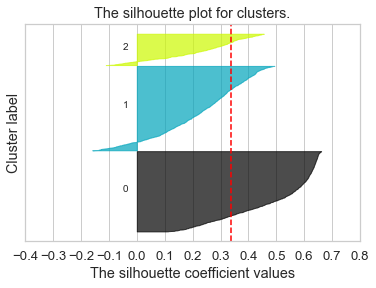

In [780]:
# Silhouette plot
silhouette_kmeans(sm_product.codebook.matrix, n_clusters = 3)

           Visualization of the mean of the metric features of each cluster


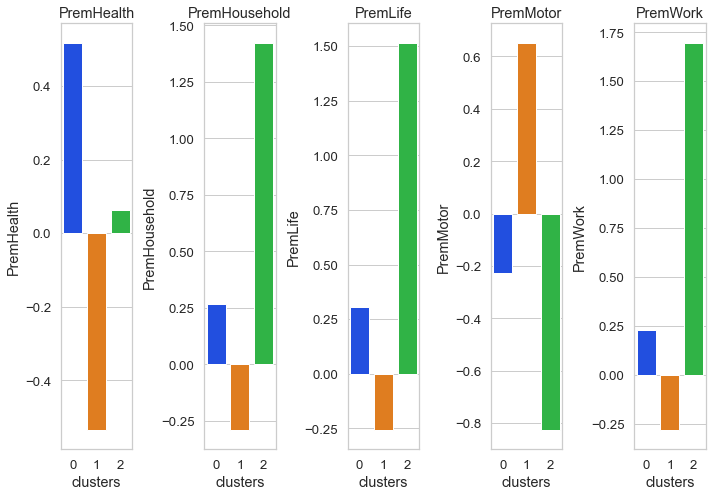

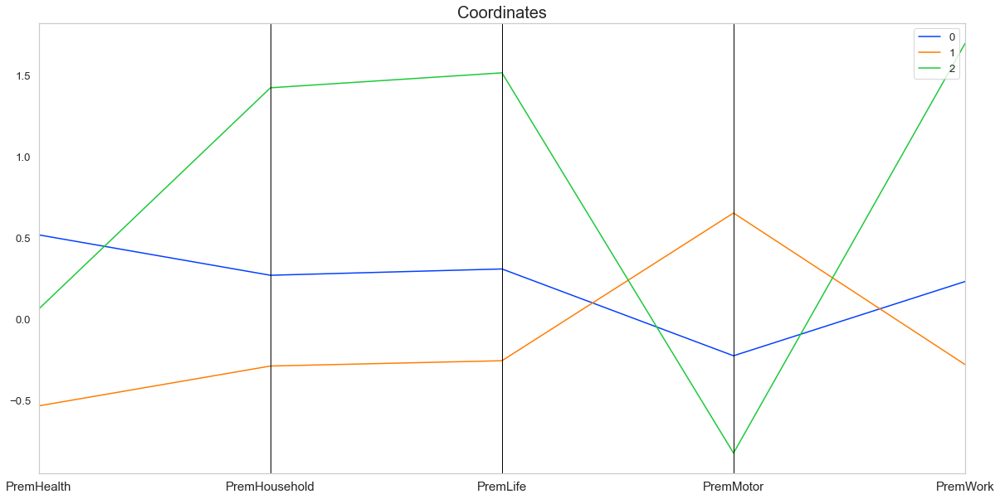


 r2 = 0.50688740707054 

                                                    Clusters histograms


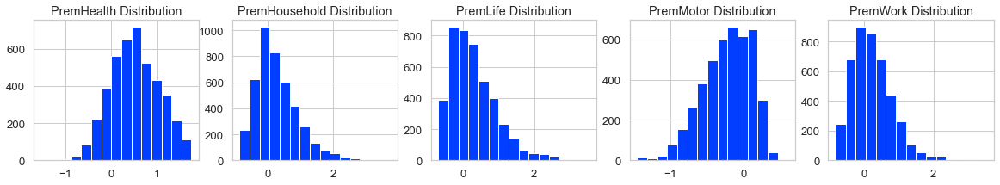

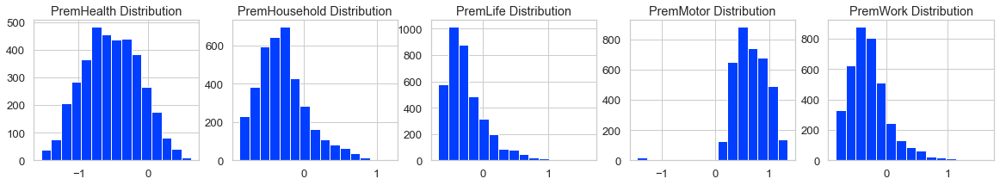

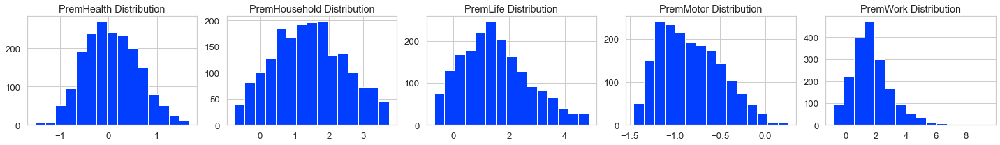

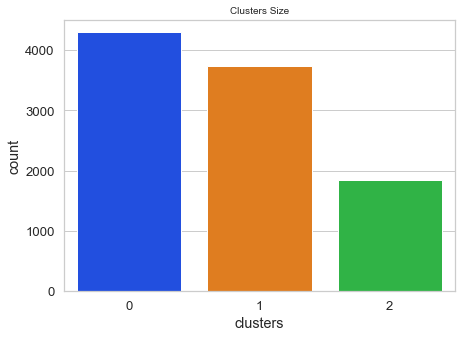

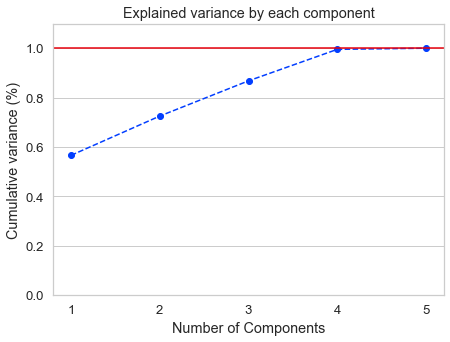

In [781]:
individual_profile(final_table[['PremHealth', 'PremHousehold', 'PremLife', 'PremMotor', 'PremWork', 'clusters']],final_table['clusters'],train_df[product],
                  ['PremHealth', 'PremHousehold', 'PremLife', 'PremMotor', 'PremWork'])

#### K-means on top of SOM was chosen over K-means since it more differentiated clusters.

In [782]:
df_to_merge['clusters_product']=final_table['clusters']

df_to_merge["clusters_product"] = df_to_merge["clusters_product"].map({0:'0_Health',
            1:'1_Motor',
            2:'2_Household_Life_work'})

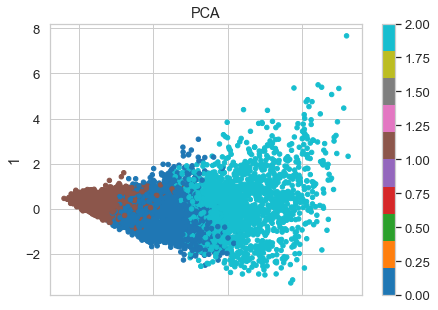

In [783]:
two_dim = PCA(random_state=42).fit_transform(final_table[['PremHealth', 'PremHousehold', 'PremLife', 'PremMotor', 'PremWork']])
# t-SNE visualization
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=final_table['clusters'], colormap='tab10', figsize=(7,5))
plt.title('PCA')
plt.show()

<Figure size 504x360 with 0 Axes>

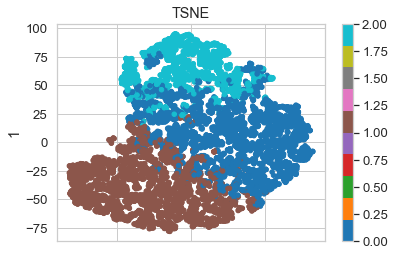

In [784]:
two_dim = TSNE(perplexity=30.0).fit_transform(final_table[['PremHealth', 'PremHousehold', 'PremLife', 'PremMotor', 'PremWork']])
# t-SNE visualization
plt.figure(figsize=(7, 5))
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=final_table['clusters'], colormap='tab10')
plt.title('TSNE')
plt.show() 

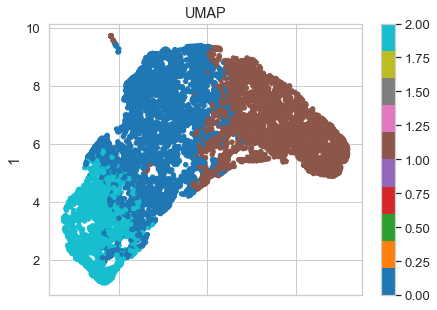

In [785]:
# UMAP
um = umap.UMAP(n_components=2,min_dist=0.02, n_neighbors=31)
components_umap = um.fit_transform(final_table[['PremHealth', 'PremHousehold', 'PremLife', 'PremMotor', 'PremWork']])
pd.DataFrame(components_umap).plot.scatter(x=0, y=1, c=final_table['clusters'], colormap='tab10', figsize=(7,5))
plt.title('UMAP')
plt.show()

<div class="alert alert-block alert-danger">
    
# <b> 8. Merging </b> 
    
</div>
<a name="8."></a>

In [786]:
df_to_merge

,PremHealth,PremHousehold,PremLife,PremMotor,PremWork,ClaimsRate,Money_spent_by_client,Money_from_cancelations,Money_spent_over_salary,Children,MonthSal,EducDeg,clusters_social,clusters_value,clusters_product
CustID,,,,,,,,,,,,,,,
1,-0.154737,-0.213423,0.486774,0.341932,-0.187621,-0.559322,-0.155187,0.0,0.143087,1.0,-0.225161,2.0,1_low_sal__Mostly_whith_children__lower_educ,Medium_value,0_Health
2,-0.431975,1.239965,3.684302,-1.084748,1.793838,0.677966,1.133137,0.0,5.276015,1.0,-1.192903,2.0,1_low_sal__Mostly_whith_children__lower_educ,High_value,2_Household_Life_work
3,-0.358251,0.412603,1.339766,-0.469448,1.635970,-0.745763,0.238765,0.0,0.239486,0.0,-0.160645,1.0,0_high_sal__No_children__higher_educ,Medium_value,2_Household_Life_work
4,1.385255,-0.369227,0.233738,-0.582620,0.066611,0.457627,-0.495800,0.0,1.331945,1.0,-0.920645,3.0,1_low_sal__Mostly_whith_children__lower_educ,High_value,0_Health
5,0.183797,-0.350022,-0.125325,0.163925,0.357702,0.305085,-0.345863,0.0,0.395774,1.0,-0.492258,3.0,1_low_sal__Mostly_whith_children__lower_educ,Medium_value,0_Health
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10291,-0.558681,3.235218,1.918040,-1.422161,3.906078,0.220339,3.190256,0.0,8.906899,1.0,-1.225806,1.0,1_low_sal__Mostly_whith_children__lower_educ,High_value,2_Household_Life_work
10292,0.101757,-0.342900,-0.320468,0.427468,-0.234471,0.406780,-0.281184,0.0,-0.372651,0.0,0.427097,4.0,0_high_sal__No_children__higher_educ,Medium_value,1_Motor
10294,-0.193141,0.016832,-0.257806,0.474755,-0.454066,-0.864407,0.005880,0.0,-0.188237,1.0,0.252903,3.0,2_Medium_sal__With_children__high_educ,Medium_value,1_Motor


In [787]:
# Centroids of the concatenated cluster labels
df_centroids = df_to_merge.groupby(['clusters_value', 'clusters_product','clusters_social'])\
    [final_metrics].mean()
df_centroids

PremHealth  \
clusters_value clusters_product      clusters_social                                            
High_value     0_Health              0_high_sal__No_children__higher_educ            0.508143   
                                     1_low_sal__Mostly_whith_children__lower_educ    0.600328   
                                     2_Medium_sal__With_children__high_educ          0.204827   
               1_Motor               1_low_sal__Mostly_whith_children__lower_educ   -0.392648   
                                     2_Medium_sal__With_children__high_educ         -0.606055   
               2_Household_Life_work 0_high_sal__No_children__higher_educ            0.130163   
                                     1_low_sal__Mostly_whith_children__lower_educ    0.070606   
                                     2_Medium_sal__With_children__high_educ         -0.251785   
Low_value      0_Health              0_high_sal__No_children__higher_educ            0.671944   
                                     1_low_sal__Mostly_whith_children__lower_educ    0.616673   
                                     2_Medium_sal__With_children__high_educ          0.371937   
               1_Motor               0_high_sal__No_children__higher_educ           -0.378286   
                                     1_low_sal__Mostly_whith_children__lower_educ   -0.501247   
                                     2_Medium_sal__With_children__high_educ         -0.705975   
               2_Household_Life_work 0_high_sal__No_children__higher_educ            0.620672   
                                     1_low_sal__Mostly_whith_children__lower_educ    0.415782   
                                     2_Medium_sal__With_children__high_educ          0.122417   
Medium_value   0_Health              0_high_sal__No_children__higher_educ            0.645255   
                                     1_low_sal__Mostly_whith_children__lower_educ    0.567207   
                                     2_Medium_sal__With_children__high_educ          0.271261   
               1_Motor               0_high_sal__No_children__higher_educ           -0.352753   
                                     1_low_sal__Mostly_whith_children__lower_educ   -0.403188   
                                     2_Medium_sal__With_children__high_educ         -0.548725   
               2_Household_Life_work 0_high_sal__No_children__higher_educ            0.195749   
                                     1_low_sal__Mostly_whith_children__lower_educ    0.164704   
                                     2_Medium_sal__With_children__high_educ         -0.130285   

                                                                                   PremHousehold  \
clusters_value clusters_product      clusters_social                                               
High_value     0_Health              0_high_sal__No_children__higher_educ               1.688442   
                                     1_low_sal__Mostly_whith_children__lower_educ       0.693998   
                                     2_Medium_sal__With_children__high_educ             1.443482   
               1_Motor               1_low_sal__Mostly_whith_children__lower_educ       0.164276   
                                     2_Medium_sal__With_children__high_educ             0.793537   
               2_Household_Life_work 0_high_sal__No_children__higher_educ               2.138763   
                                     1_low_sal__Mostly_whith_children__lower_educ       1.670004   
                                     2_Medium_sal__With_children__high_educ             2.002336   
Low_value      0_Health              0_high_sal__No_children__higher_educ              -0.156908   
                                     1_low_sal__Mostly_whith_children__lower_educ      -0.163625   
                                     2_Medium_sal__With_children__high_educ            -0.130626   
               1_Motor               0_high_sal__No_children__high

In [788]:
# Using Hierarchical clustering to merge the concatenated cluster centroids
hclust = AgglomerativeClustering(
    linkage='single', 
    affinity='euclidean', 
    distance_threshold=0, 
    n_clusters=None
)
hclust_labels = hclust.fit_predict(df_centroids)

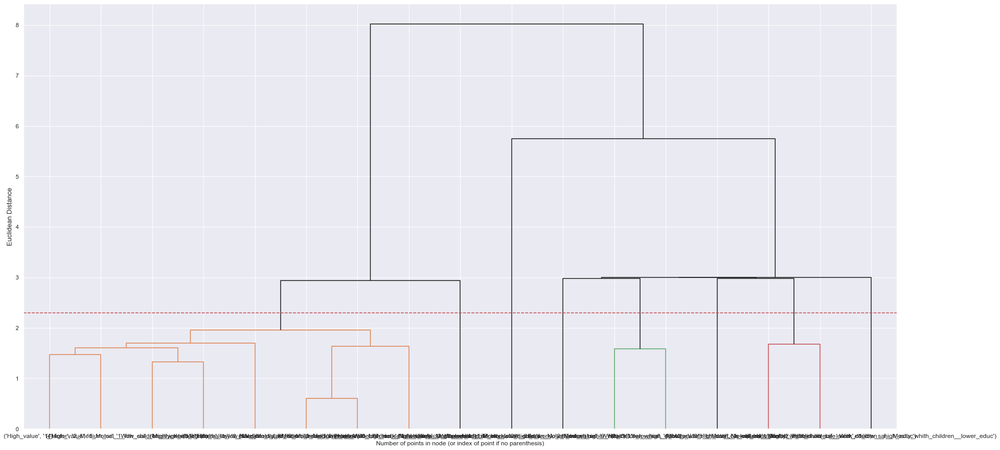

In [789]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(30,15))
# The Dendrogram parameters need to be tuned
y_threshold = 2.3
dendrogram(linkage_matrix, truncate_mode='level', labels=df_centroids.index, p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'Euclidean Distance', fontsize=13)
plt.show()

In [790]:
# Re-running the Hierarchical clustering based on the correct number of clusters
hclust = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    n_clusters=5
)
hclust_labels = hclust.fit_predict(df_centroids)
df_centroids['hclust_labels'] = hclust_labels

df_centroids  # centroid's cluster labels

PremHealth  \
clusters_value clusters_product      clusters_social                                            
High_value     0_Health              0_high_sal__No_children__higher_educ            0.508143   
                                     1_low_sal__Mostly_whith_children__lower_educ    0.600328   
                                     2_Medium_sal__With_children__high_educ          0.204827   
               1_Motor               1_low_sal__Mostly_whith_children__lower_educ   -0.392648   
                                     2_Medium_sal__With_children__high_educ         -0.606055   
               2_Household_Life_work 0_high_sal__No_children__higher_educ            0.130163   
                                     1_low_sal__Mostly_whith_children__lower_educ    0.070606   
                                     2_Medium_sal__With_children__high_educ         -0.251785   
Low_value      0_Health              0_high_sal__No_children__higher_educ            0.671944   
                                     1_low_sal__Mostly_whith_children__lower_educ    0.616673   
                                     2_Medium_sal__With_children__high_educ          0.371937   
               1_Motor               0_high_sal__No_children__higher_educ           -0.378286   
                                     1_low_sal__Mostly_whith_children__lower_educ   -0.501247   
                                     2_Medium_sal__With_children__high_educ         -0.705975   
               2_Household_Life_work 0_high_sal__No_children__higher_educ            0.620672   
                                     1_low_sal__Mostly_whith_children__lower_educ    0.415782   
                                     2_Medium_sal__With_children__high_educ          0.122417   
Medium_value   0_Health              0_high_sal__No_children__higher_educ            0.645255   
                                     1_low_sal__Mostly_whith_children__lower_educ    0.567207   
                                     2_Medium_sal__With_children__high_educ          0.271261   
               1_Motor               0_high_sal__No_children__higher_educ           -0.352753   
                                     1_low_sal__Mostly_whith_children__lower_educ   -0.403188   
                                     2_Medium_sal__With_children__high_educ         -0.548725   
               2_Household_Life_work 0_high_sal__No_children__higher_educ            0.195749   
                                     1_low_sal__Mostly_whith_children__lower_educ    0.164704   
                                     2_Medium_sal__With_children__high_educ         -0.130285   

                                                                                   PremHousehold  \
clusters_value clusters_product      clusters_social                                               
High_value     0_Health              0_high_sal__No_children__higher_educ               1.688442   
                                     1_low_sal__Mostly_whith_children__lower_educ       0.693998   
                                     2_Medium_sal__With_children__high_educ             1.443482   
               1_Motor               1_low_sal__Mostly_whith_children__lower_educ       0.164276   
                                     2_Medium_sal__With_children__high_educ             0.793537   
               2_Household_Life_work 0_high_sal__No_children__higher_educ               2.138763   
                                     1_low_sal__Mostly_whith_children__lower_educ       1.670004   
                                     2_Medium_sal__With_children__high_educ             2.002336   
Low_value      0_Health              0_high_sal__No_children__higher_educ              -0.156908   
                                     1_low_sal__Mostly_whith_children__lower_educ      -0.163625   
                                     2_Medium_sal__With_children__high_educ            -0.130626   
               1_Motor               0_high_sal__No_children__high

In [791]:
df_centroids["hclust_labels"]

clusters_value  clusters_product       clusters_social                             
High_value      0_Health               0_high_sal__No_children__higher_educ            1
                                       1_low_sal__Mostly_whith_children__lower_educ    4
                                       2_Medium_sal__With_children__high_educ          1
                1_Motor                1_low_sal__Mostly_whith_children__lower_educ    4
                                       2_Medium_sal__With_children__high_educ          4
                2_Household_Life_work  0_high_sal__No_children__higher_educ            1
                                       1_low_sal__Mostly_whith_children__lower_educ    1
                                       2_Medium_sal__With_children__high_educ          1
Low_value       0_Health               0_high_sal__No_children__higher_educ            0
                                       1_low_sal__Mostly_whith_children__lower_educ    0
                          

In [792]:
# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper = df_centroids['hclust_labels'].to_dict()

df_ = df_to_merge.copy()

# Mapping the hierarchical clusters on the centroids to the observations
df_['merged_labels'] = df_.apply(
    lambda row: cluster_mapper[
        (row['clusters_value'], row['clusters_product'], row['clusters_social'])
    ], axis=1
)

# Merged cluster centroids
df_.groupby('merged_labels').mean()[['MonthSal','PremHealth', 'PremHousehold', 'PremLife', 'PremMotor', 'PremWork','ClaimsRate', 
               'Money_spent_by_client','Money_from_cancelations', 'Money_spent_over_salary']]

,MonthSal,PremHealth,PremHousehold,PremLife,PremMotor,PremWork,ClaimsRate,Money_spent_by_client,Money_from_cancelations,Money_spent_over_salary
merged_labels,,,,,,,,,,
0,0.192434,0.302766,-0.230258,0.094996,0.058935,-0.055097,0.019465,-0.205436,-16.656272,-0.010281
1,-0.268904,0.087466,1.451808,1.392023,-0.784822,1.552535,-0.074483,1.399991,-0.013910,1.827110
2,0.725346,0.620672,0.625316,2.228906,-0.756221,-0.044090,0.336562,0.591671,-7.808571,-0.237987
3,-0.028353,-0.658437,-0.512370,-0.374472,0.806592,-0.447515,-0.120827,-0.445037,-22.203415,-0.069085
4,0.077152,0.125013,0.079994,0.116518,0.089784,0.079796,-0.069671,0.055838,-0.041406,0.192839


In [793]:
#Merge cluster contigency table
# Getting size of each final cluster
df_counts = df_.groupby('merged_labels')\
    .size()\
    .to_frame()

# Getting the product and behavior labels
df_counts = df_counts\
    .rename({v:k for k, v in cluster_mapper.items()})\
    .reset_index()
df_counts

,merged_labels,0
0,"(Low_value, 2_Household_Life_work, 2_Medium_sa...",566
1,"(Medium_value, 2_Household_Life_work, 2_Medium...",2033
2,"(Low_value, 2_Household_Life_work, 0_high_sal_...",7
3,"(Low_value, 1_Motor, 2_Medium_sal__With_childr...",1180
4,"(Medium_value, 1_Motor, 2_Medium_sal__With_chi...",6094


In [794]:
def individual_profile(dataframe, predi, selected_dataframe,selected_vars):      
    plt.figure(figsize=(7,5))
    sns.countplot(x=dataframe['merged_labels'])
    plt.title('Clusters Size', fontsize=10)
    plt.show()
    
    # Characterizing the 3 clusters - 
    df_concat = dataframe
    hc=df_concat.groupby('merged_labels').mean()
    hc['Labels_'] = hc.index
    print('           Visualization of the mean of the metric features of each cluster')
    fig=plt.figure(figsize=(30,10))
    for i, feature in enumerate(selected_vars):
        ax=fig.add_subplot(1,len(selected_vars),i+1)
        sns.barplot(hc.index,hc[feature])
        plt.title(feature)
    plt.tight_layout()
    plt.show()
    
    plt.figure(figsize=(20, 10))
    pd.plotting.parallel_coordinates(hc, class_column='Labels_', color=sns.color_palette())
    plt.xticks(fontsize=15)
    plt.title("Coordinates", fontsize=13)
    plt.show()

    print("\n r2 =", r2(dataframe[selected_vars], dataframe['merged_labels']),'\n')  
    
    print('                                                    Clusters histograms')
    for j in range(len(np.unique(dataframe['merged_labels']))):
        fig, axes = plt.subplots(1, (len(selected_vars) ), figsize=(20, 3))
        cond=(dataframe.loc[dataframe['merged_labels']==j])
        for ax, feat in zip(axes.flatten(), selected_vars):
            ax.set_title(feat,fontsize=9 )
            cond[feat].hist(bins=20, ax=ax)
    fig.tight_layout() 
    plt.show()

    # PCA
    pca_var = PCA()
    pca_var.fit(selected_dataframe)
    # Plot
    plt.figure(figsize=(7,5))
    xi = np.arange(1,1+selected_dataframe.shape[1], step=1)
    yi = np.cumsum(pca_var.explained_variance_ratio_)
    plt.plot(xi, yi, marker='o', linestyle='--', color='b')
    # Aesthetics
    plt.ylim(0.0,1.1)
    plt.xlabel('Number of Components')
    plt.xticks(np.arange(1,1+selected_dataframe.shape[1], step=1))
    plt.ylabel('Cumulative variance (%)')
    plt.title('Explained variance by each component')
    plt.axhline(y=1, color='r', linestyle='-')
    plt.gca().xaxis.grid(False)
    plt.show()

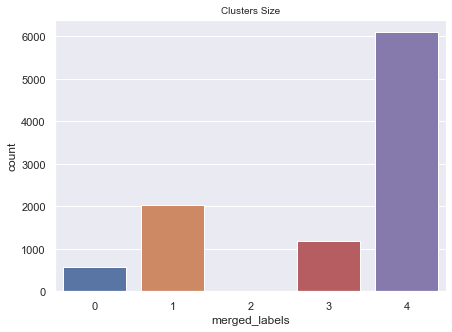

           Visualization of the mean of the metric features of each cluster


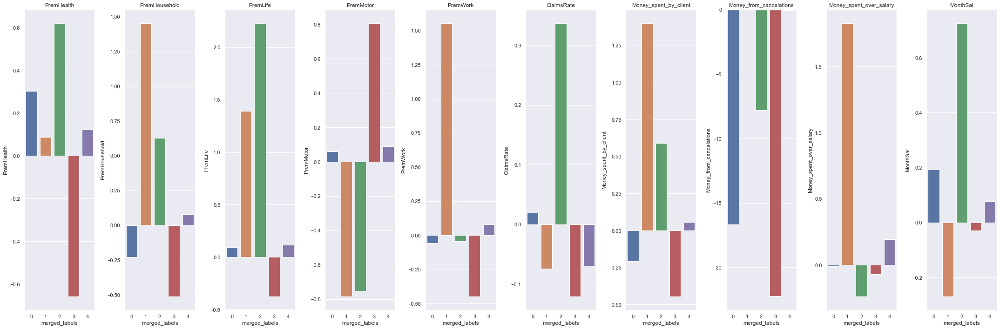

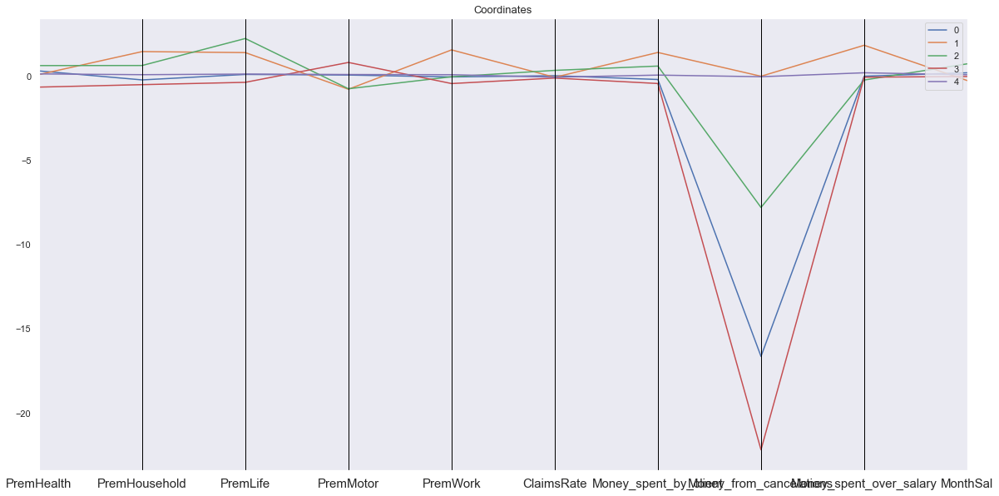


 r2 = 0.4764325215670179 

                                                    Clusters histograms


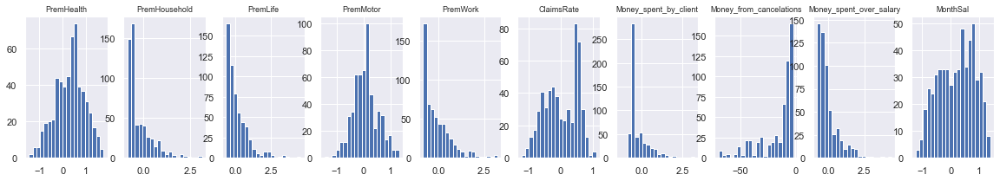

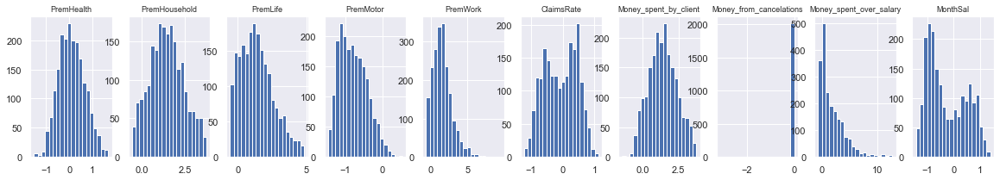

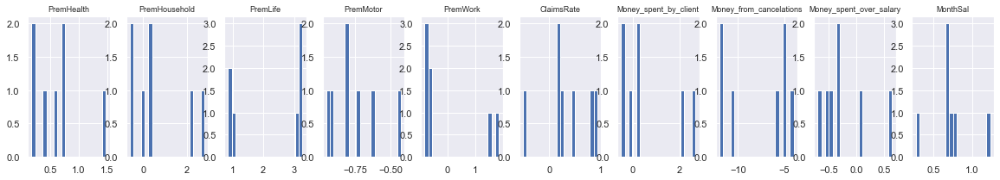

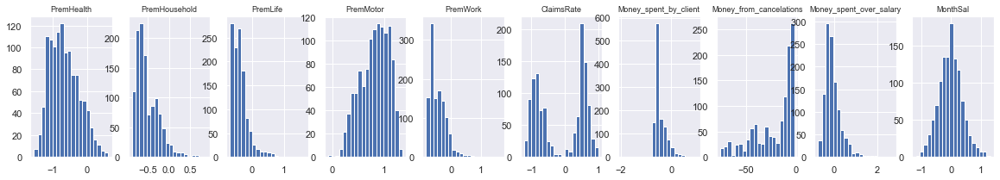

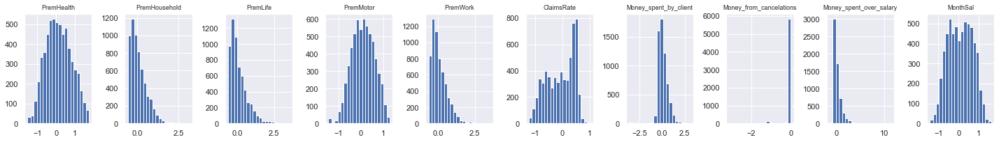

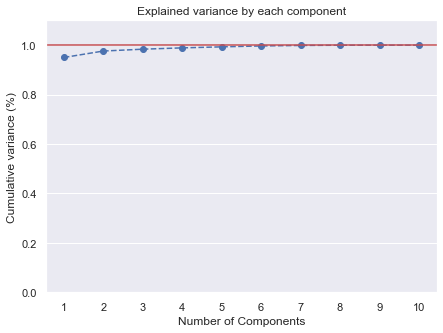

In [795]:
individual_profile(df_[['PremHealth', 'PremHousehold', 'PremLife', 'PremMotor', 'PremWork',
       'ClaimsRate', 'Money_spent_by_client', 'Money_from_cancelations',
       'Money_spent_over_salary', 'MonthSal',
       'merged_labels']],df_['merged_labels'],df_[['PremHealth', 'PremHousehold', 'PremLife', 'PremMotor', 'PremWork',
       'ClaimsRate', 'Money_spent_by_client', 'Money_from_cancelations',
       'Money_spent_over_salary','MonthSal']],
                  ['PremHealth', 'PremHousehold', 'PremLife', 'PremMotor', 'PremWork',
       'ClaimsRate', 'Money_spent_by_client', 'Money_from_cancelations',
       'Money_spent_over_salary', 'MonthSal'])

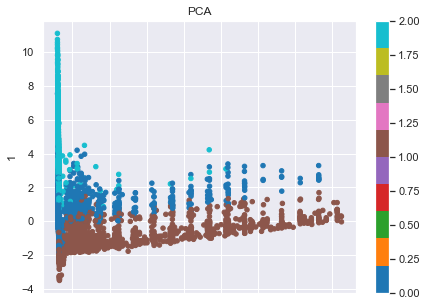

In [796]:
two_dim = PCA(random_state=42).fit_transform(df_[['PremHealth', 'PremHousehold', 'PremLife', 'PremMotor', 'PremWork',
       'ClaimsRate', 'Money_spent_by_client', 'Money_from_cancelations',
       'Money_spent_over_salary', 'MonthSal',
       'merged_labels']])
# PCA visualization
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=final_table['clusters'], colormap='tab10', figsize=(7,5))
plt.title('PCA')
plt.show()   

<Figure size 504x360 with 0 Axes>

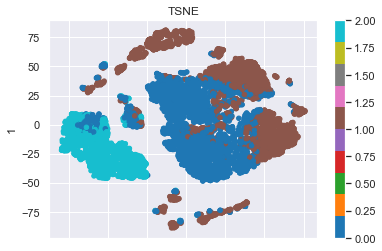

In [803]:
two_dim = TSNE(perplexity=40.0).fit_transform(df_[['PremHealth', 'PremHousehold', 'PremLife', 'PremMotor', 'PremWork',
       'ClaimsRate', 'Money_spent_by_client', 'Money_from_cancelations',
       'Money_spent_over_salary','MonthSal',
       'merged_labels']])
# t-SNE visualization
plt.figure(figsize=(7, 5))
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=final_table['clusters'], colormap='tab10')
plt.title('TSNE')
plt.show()

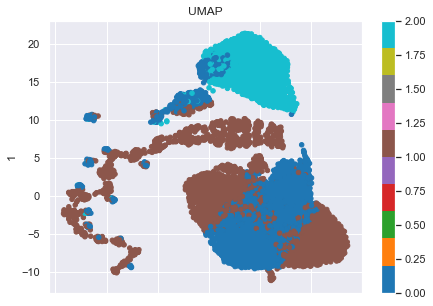

In [809]:
# UMAP
um = umap.UMAP(n_components=2,min_dist=0.9, n_neighbors=31)
components_umap = um.fit_transform(df_[['PremHealth', 'PremHousehold', 'PremLife', 'PremMotor', 'PremWork',
       'ClaimsRate', 'Money_spent_by_client', 'Money_from_cancelations',
       'Money_spent_over_salary', 'MonthSal',
       'merged_labels']])
pd.DataFrame(components_umap).plot.scatter(x=0, y=1, c=final_table['clusters'], colormap='tab10', figsize=(7,5))
plt.title('UMAP')
plt.show()

# Conclusion
### Final Profiles

</div>

* **Cluster 0**, which contains 566 clients, 
is characterized by having a high income, few canceled packages, high PremHealth, a medium 
value of all Prems;
* **Cluster 1** contains 2033 clients and is characterized by having low salary, very high PremHousehold and PremWork, High money lost to cancellations and High money spent by client over 
salary;
* **Cluster 2** contains only 7 clients, and could possibly be ignored, but the group decided not to.
This cluster has a very high salary, Very low ratio of money spent over salary, very high claims 
rate;
* **Cluster 3**, containing 1180 clients, has as a common denominator a low salary, very low money 
lost from cancellations, very high PremMotor and very low PremHealth;
* **Cluster 4** contains 6094, being the largest cluster, and is characterized by having high money 
lost from cancellations.

The visualization graphs of the final clusters are good, as there is a noticeable separation of 
the clusters. Although there is some overlap this is to be expected as the graphs are a simplification of a space with 11 dimensions

### Marketing Stratagies

</div>

* As the clients in **cluster 0** are stable customers, with high income, and medium spending in 
Prems. As they seem to be loyal to the company it might be best to try and persuade them to spend more, ir order to so the company could try offering small discounts for upgrading their premiums or rewards for their loyalty.
* The clients in **cluster 1** are low-income individuals that spent a lot of their salary on the insurances so they were more prone to canceling the packages. The strategy suggested is to offer a discount in PremMotor if the client pays for PremHousehold and PremWork.
* The clients in **cluster 2** spend a lot on insurances, except in motor, which means there is potential to increase the sales. The proposed strategies are if the client has two packages, offer 10% discount in PremMotor; When they have more than 2 packages and one is PremMotor make it possible for them to earn a reward, like a raffle;
* The clients in **cluster 3** seem to be people that only have insurance for the vehicles with the company, not forgetting that it is mandatory by law to have this insurance. A possible approach could be that if they have PremMotor, a discount of 10% or 20% in PremHealth in the next 2 years.
* The clients in **cluster 4** seem to be mostly people that canceled premiums, and are possibly moving to another insurance company, in order to bring them back it is proposed to give a 30% discount in another premium of their choice for 1 year (with fidelity).


### Final Remarks

The previous strategies are only suggestions since the budget is not known.

Since the density based clusterings lead to bad results, it might suggest that the data is either 
sparse or has varying density. Since K-means clustering has the best performance, and it 
doesn't perform as well when the data has different densities, it suggests that the data is only 
sparse. Since K-means clustering is very sensitive to outliers, the good performance should 
mean that the group performed a good treatment of the outliers. Due to the nature of the data 
SOM is a good alternative. SOM is relatively tolerant of missing or noisy data, and still capable 
to find patterns in the data. Using K-means and SOM combined helps improve cluster accuracy, enhancing interpretability, and the ability to handle large datasets.